# 分析

In [1]:
import matplotlib.pyplot as plt
import seaborn as sns
import scienceplots
import numpy as np
# from .utils import plot_utils

font1 = {'family': 'Times New Roman',
        'weight': 'normal',
        'size': 12,
        }
font2 = {'family': 'simhei',
        'weight': 'normal',
        'size': 12,
        }
fonts = {'en':font1,
        'cn':font2}
# plt.style.use(['science','no-latex'])
plt.style.use(['science','ieee'])

# plt.style.use('science')
# sns.set_theme(style="white",font='sans-serif',font_scale=1.4) #serif,simhei
plt.rcParams['font.sans-serif']=['Times New Roman'] #用来正常显示中文标签
plt.rcParams['font.family'] = 'Times New Roman'

## history

In [2]:
import wandb
api = wandb.Api()
# run = api.run("/richie_team/THU_FD/runs/vgt8vjly") #2vw3ktyf
# data = run.history()
# print(run.history())

AFN_curve = api.run("/richie_team/THU_FD/runs/bt55p8lw") #2vw3ktyfrichie_team/THU_FD/bt55p8lw
Dong_curve = api.run("/richie_team/THU_com/runs/21dumwb0") # richie_team/THU_com/21dumwb0richie_team/THU_com/21dumwb0
wave_resnet_curve = api.run("/richie_team/THU_com/runs/3iegq40p") # richie_team/THU_com/3iegq40p
Huan_curve = api.run("/richie_team/THU_com/runs/3vfhsyp2") # richie_team/THU_com/3vfhsyp2
resnet_curve =  api.run("/richie_team/THU_com/runs/23g68x5q") # richie_team/THU_com/23g68x5q




In [3]:
AFN_curve = AFN_curve.history()
Dong_curve = Dong_curve.history()
wave_resnet_curve = wave_resnet_curve.history()
Huan_curve = Huan_curve.history()
resnet_curve = resnet_curve.history()


In [2]:
path = 'plot_dir/' # 保存图片的路径
markers = ['*','o', 'x', 'v', '^', 's']
colors = ['r','y', 'g','c' , 'b', 'm']
lines = ['dotted','-','--',':','-.',]

In [11]:


def line_plot(data, window=5,ylim = [0,2],ylabel = '',  alpha=0.2, dpi=512):
    """
    绘制折线图和置信区间。

    Args:
        data: 一个字典，包含要绘制的指标和对应的训练、验证和测试数据。
        window: 滑动窗口大小。
        alpha: 置信区间的透明度。
        dpi: 图像的 DPI。

    Returns:
        None
    """
    # 遍历字典中的键值对，绘制相应的折线图和置信区间
    for i,(name, values) in enumerate(data.items()):
        # 绘制折线图
        plt.plot(values.rolling(window=window).mean(),
                 color=colors[i],
                #  linestyle = lines[1],
                 label=f"{name}")
        # 添加置信区间
        plt.fill_between(values.index, values.rolling(window=window).mean()+values.rolling(window=window).std(), 
                         values.rolling(window=window).mean()-values.rolling(window=window).std(), alpha=alpha,color=colors[i],)

        

    plt.ylim(ylim)
    # 添加图例和标签
    plt.legend()
    plt.xlabel('Epochs')
    plt.ylabel(f'{ylabel}')
    # 保存图像
    plt.savefig(f'{path}{ylabel}10.pdf', transparent=True, dpi=dpi)

    # 显示图像
    plt.show()

In [11]:
AFN_curve['acc'].index

RangeIndex(start=0, stop=141, step=1)

In [6]:
acc_traindict = {'TON':AFN_curve['acc'],'ELM':Dong_curve['acc'],'WKN':wave_resnet_curve['acc'],'MWA-CNN':Huan_curve['acc'],'Resnet':resnet_curve['acc']}
acc_valdict = {'TON':AFN_curve['valacc'],'ELM':Dong_curve['valacc'],'WKN':wave_resnet_curve['valacc'],'MWA-CNN':Huan_curve['valacc'],'Resnet':resnet_curve['valacc']}
acc_testict = {'TON':AFN_curve['testacc'],'ELM':Dong_curve['testacc'],'WKN':wave_resnet_curve['testacc'],'MWA-CNN':Huan_curve['testacc'],'Resnet':resnet_curve['testacc']}

loss_traindict = {'TON':AFN_curve['loss'],'ELM':Dong_curve['loss'],'WKN':wave_resnet_curve['loss'],'MWA-CNN':Huan_curve['loss'],'Resnet':resnet_curve['loss']}
loss_valdict = {'TON':AFN_curve['valloss'],'ELM':Dong_curve['valloss'],'WKN':wave_resnet_curve['valloss'],'MWA-CNN':Huan_curve['valloss'],'Resnet':resnet_curve['valloss']}
loss_testdict = {'TON':AFN_curve['testloss'],'ELM':Dong_curve['testloss'],'WKN':wave_resnet_curve['testloss'],'MWA-CNN':Huan_curve['testloss'],'Resnet':resnet_curve['testloss']}


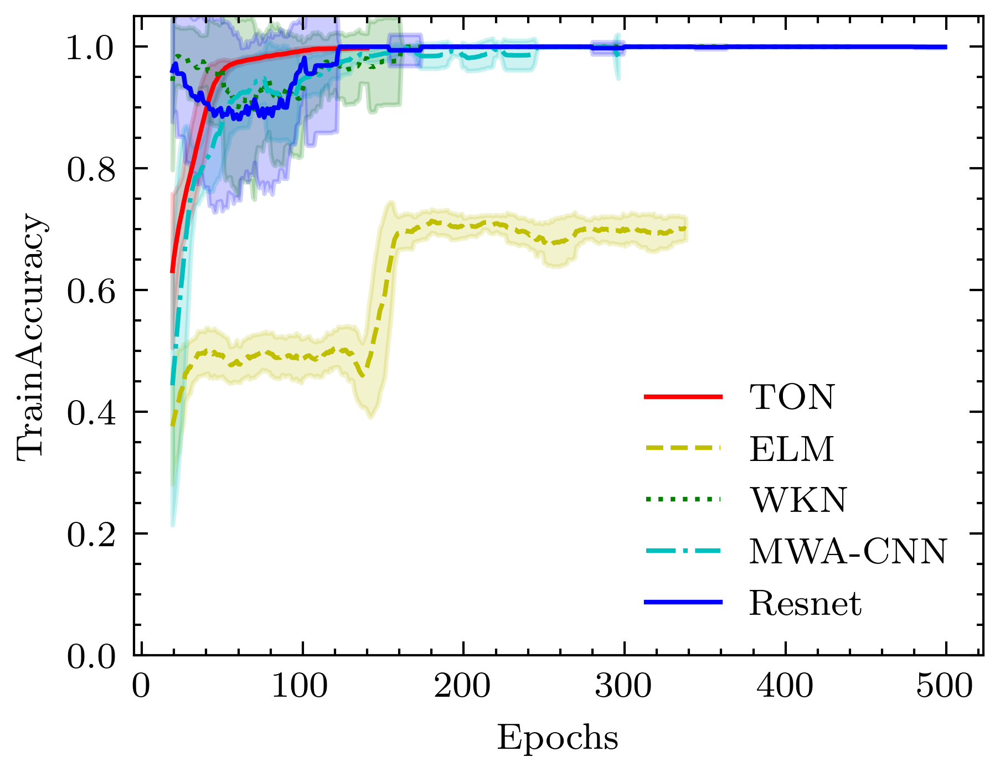

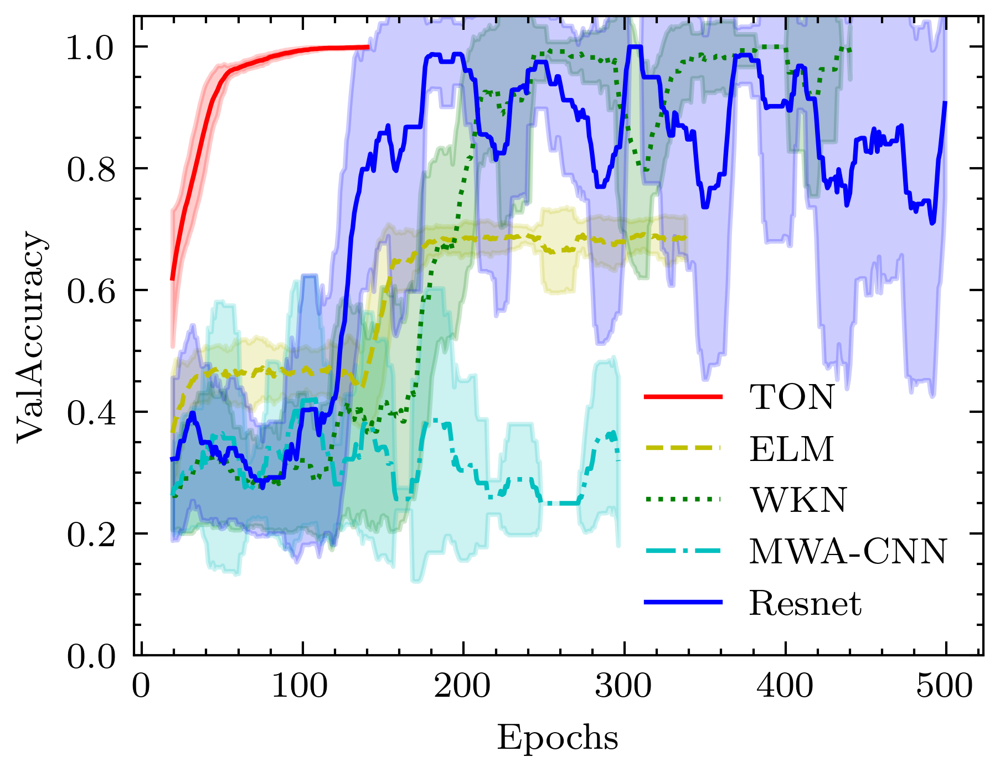

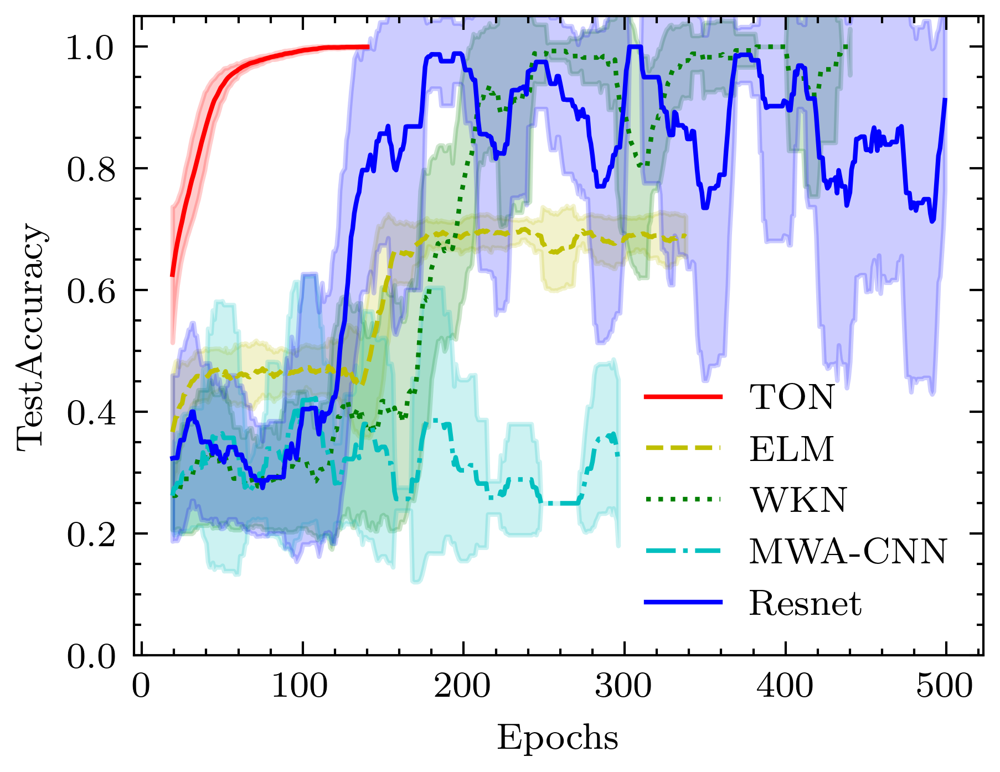

In [16]:
line_plot(acc_traindict,window=20,ylim=[0,1.05],ylabel='TrainAccuracy',alpha=0.2,dpi=512)
line_plot(acc_valdict,window=20,ylim=[0,1.05],ylabel='ValAccuracy',alpha=0.2,dpi=512)
line_plot(acc_testict,window=20,ylim=[0,1.05],ylabel='TestAccuracy',alpha=0.2,dpi=512)




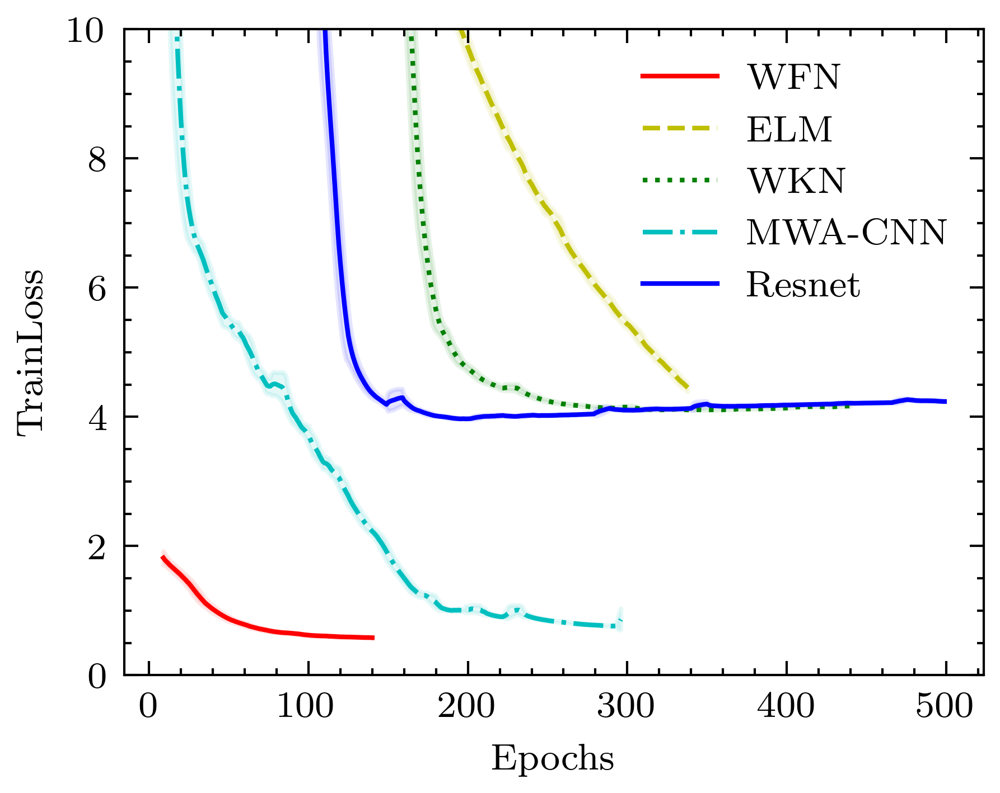

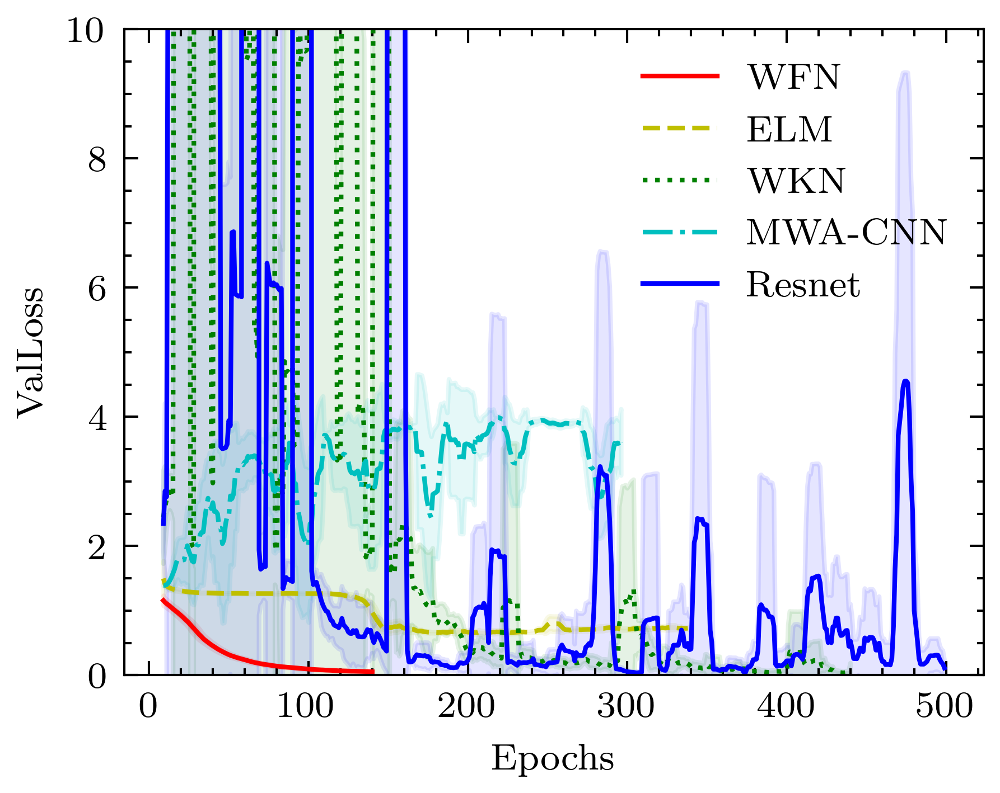

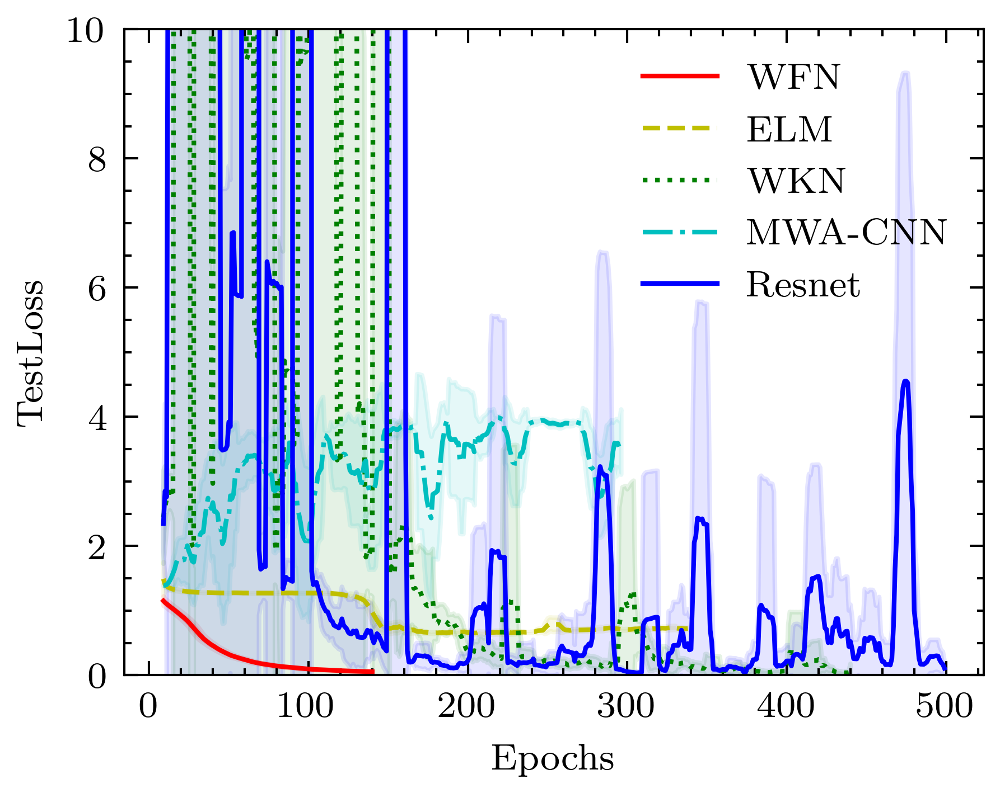

In [57]:
line_plot(loss_traindict,window=10,ylim=[0,10],ylabel='TrainLoss',alpha=0.1,dpi=512)
line_plot(loss_valdict,window=10,ylim=[0,10],ylabel='ValLoss',alpha=0.1,dpi=512)
line_plot(loss_testdict,window=10,ylim=[0,10],ylabel='TestLoss',alpha=0.1,dpi=512)

## 2混淆矩陣

### 2.1 保存的有BUG

In [3]:
def heatmap_confusion(matrix,x_labels=['1','2','3'],
            y_labels=['1','2','3'],x_title = 'Label',y_title = 'Prediction',
            title = '',font_type = 'en',plot_dir = './',name = '',cmap =None,
            save_type = '.pdf'):
    '''
    
    camp 关注大小默认即可
    把中间值作白，则用 coolworm
    
    weight 2 36*32 so figsize = (9,8)
    weight 3 32*32 so figsize = (8,8)
    
    '''
    f, ax = plt.subplots(figsize=(4, 4))
    font = fonts[font_type]
    
    sns.heatmap(matrix, cmap =cmap, annot=True, fmt=".0f",
                linewidths=.5, ax=ax,xticklabels = x_labels, yticklabels = y_labels,
                vmax=None, vmin=None)
    plt.title(title)
    # plt.title('Result Analysis')

    plt.xlabel(x_title)
    plt.ylabel(y_title)
    plt.savefig(path + f'{name}heatmap'+save_type, transparent=True,dpi=512)   
    
    
AFN_dir = 'THU10_wave_4test_lr0.001_AFN'
ELM_dir = 'THU10_wave_4test_lr0.001_Dong_net'
WKN_dir = 'THU10_wave_4test_lr0.001_wave_resnet'
Resnet_dir = 'THU10_wave_4test_lr0.001_resnet'
MWA_CNN_dir = 'THU10_wave_4test_lr0.001_Huan_net'

# AFN_confusion_matrix = np.load(f'{AFN_dir}/Confusion matrix.npy')
# ELM_confusion_matrix = np.load(f'{ELM_dir}/Confusion matrix.npy')
# WKN_confusion_matrix = np.load(f'{WKN_dir}/Confusion matrix.npy')
# Resnet_confusion_matrix = np.load(f'{Resnet_dir}/Confusion matrix.npy')
# MWA_CNN_confusion_matrix = np.load(f'{MWA_CNN_dir}/Confusion matrix.npy')




# heatmap_confusion(AFN_confusion_matrix,
#                   x_labels = ['Nor','Ball','Inner','Outer'],
#                   y_labels= ['Nor','Ball','Inner','Outer'],
#                   name = 'AFN',
#                   cmap = 'cool')
# heatmap_confusion(ELM_confusion_matrix,
#                     x_labels = ['Nor','Ball','Inner','Outer'],
#                     y_labels= ['Nor','Ball','Inner','Outer'],
#                     name = 'ELM',
#                     cmap = 'cool')
# heatmap_confusion(WKN_confusion_matrix,
#                     x_labels = ['Nor','Ball','Inner','Outer'],
#                     y_labels= ['Nor','Ball','Inner','Outer'],
#                     name = 'WKN',
#                     cmap = 'cool')
# heatmap_confusion(Resnet_confusion_matrix,
#                     x_labels = ['Nor','Ball','Inner','Outer'],
#                     y_labels= ['Nor','Ball','Inner','Outer'],
#                     name = 'Resnet',
#                     cmap = 'cool')
# heatmap_confusion(MWA_CNN_confusion_matrix,
#                     x_labels = ['Nor','Ball','Inner','Outer'],
#                     y_labels= ['Nor','Ball','Inner','Outer'],
#                     name = 'MWA_CNN',
#                     cmap = 'cool')


### 2.2 直接输出的模型

In [4]:
AFN_dir = 'THU10_wave_4test_lr0.001_AFN'
ELM_dir = 'THU10_wave_4test_lr0.001_Dong_net'
WKN_dir = 'THU10_wave_4test_lr0.001_wave_resnet'
Resnet_dir = 'THU10_wave_4test_lr0.001_resnet'
MWA_CNN_dir = 'THU10_wave_4test_lr0.001_Huan_net'
sinc_net_dir = 'THU10_sinc_net_4test_lr0.001_Sincnet'


import sys
sys.path.append("../")
sys.path.append("/home/richie_thu/_Richie_project/Deep symbolic net/rul prediction/code/")
from experiment.experiment_FD import experiment_DFN,experiment_COM

import random
import numpy as np
import pandas as pd

# common modules

import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F


# specific modules
from model.symbolic_layer import basic_model

# from utils
from utils.file_utils import create_dir, setup_config,loger
from utils.model_utils import get_arity
from utils.training_utils import EarlyStopping, setup_seed
from sklearn.manifold import TSNE
from utils.plot_utils import plot2DDG
# wandb
import wandb
from torchmetrics import ConfusionMatrix

config_dir = '/home/richie_thu/_Richie_project/Deep symbolic net/rul prediction/code/experiment/THU.yaml'
# COM
config_dir = '/home/richie_thu/_Richie_project/Deep symbolic net/rul prediction/code/experiment/THU_COM.yaml'

exp_model_dic = {'default':experiment_DFN,
                    'THU_FD':experiment_DFN,
                    'THU_COM':experiment_COM

                    }
args = setup_config(config_dir)


def wgn2(x, snr):
    "加随机噪声"
    snr = 10**(snr/10.0)
    xpower = torch.sum(x**2)/(x.size(0)*x.size(1)*x.size(2))
    npower = xpower / snr
    return torch.rand(x.size()).cuda() * torch.sqrt(npower)



MWA-CNN

In [13]:



args.model = 'Huan_net' # wave_resnet 'resnet', Huan_net, Dong_net

# args.setting = 

exp = exp_model_dic[args.exp](args)


train_loader, test_loader, val_loader = exp.get_data()
# Huan_dict = torch.load('/home/richie_thu/_Richie_project/Deep symbolic net/rul prediction/save_dir/THU10_wave_4test_lr0.001_Huan_net/checkpoint.pth')
Huan_dict = torch.load('/home/richie_thu/_Richie_project/Deep symbolic net/rul prediction/save_dir/THU10_huan_4test_lr0.001_Huan_net2/checkpoint.pth')
# Huan_dict = torch.load('/home/richie_thu/_Richie_project/Deep symbolic net/rul prediction/save_dir/THU10_Huan_net_4test_lr0.001_Huan_net/checkpoint.pth')
exp.net.load_state_dict(Huan_dict)

train_loader, test_loader, val_loader = exp.get_data()
testx,testy = test_loader.dataset.x,test_loader.dataset.y
aa = exp.net(testx.cuda())


metric = ConfusionMatrix(num_classes = args.num_class).to(args.device)
MWA_CNN_confusion_matrix = metric(aa.argmax(dim=1),testy.argmax(dim=1).to(args.device))
print(MWA_CNN_confusion_matrix)

noise_dblist = [-5,-4,-3,-2,-1,0,1,2,3,4,5,6,7,8,9,10,11]
huan_list = []
for noise in  noise_dblist:
    testx_noise = testx.cuda() + wgn2(testx,noise)
    pred = exp.net(testx_noise.cuda())
    acc = (pred.argmax(dim=1) == testy.argmax(dim=1).to(args.device)).sum().item()/len(testy)
    huan_list.append(acc)
print(huan_list)

exp THU10_Huan_net_4test_lr0.001_Huan_net begin
tensor([[100,   0,   0,   0],
        [  0, 100,   0,   0],
        [  0,   0, 100,   0],
        [  0,   0,   0, 100]], device='cuda:0')
[0.43, 0.505, 0.545, 0.5625, 0.6075, 0.6425, 0.6975, 0.7225, 0.81, 0.8325, 0.855, 0.8725, 0.885, 0.94, 0.9675, 0.9575, 0.9675]


降采样

In [14]:
downsamplerate = [2,4,8,16,32,64,128,256]
acc_list_down = []
for down in  downsamplerate:
    # testx_noise = testx.cuda() # + wgn2(testx,noise)
    testx_down = testx[:,:,::down]
    pred = exp.net(testx_down.cuda())
    acc = (pred.argmax(dim=1) == testy.argmax(dim=1).to(args.device)).sum().item()/len(testy)
    acc_list_down.append(acc)
print(acc_list_down)

[0.7775, 0.33, 0.515, 0.375, 0.345, 0.2475, 0.26, 0.2625]


wave_resnet

In [15]:
args.model = 'wave_resnet' # wave_resnet 'resnet', Huan_net, Dong_net

# args.setting = 

exp = exp_model_dic[args.exp](args)


train_loader, test_loader, val_loader = exp.get_data()
# WKN_state_dict = torch.load('/home/richie_thu/_Richie_project/Deep symbolic net/rul prediction/save_dir/THU10_wave_4test_lr0.001_wave_resnet/checkpoint.pth')
WKN_state_dict = torch.load('/home/richie_thu/_Richie_project/Deep symbolic net/rul prediction/save_dir/THU10_wave_resnet_4test_lr0.001_wave_resnet2/checkpoint.pth')
exp.net.load_state_dict(WKN_state_dict)

train_loader, test_loader, val_loader = exp.get_data()
testx,testy = test_loader.dataset.x,test_loader.dataset.y
aa = exp.net(testx.cuda())

metric = ConfusionMatrix(num_classes = args.num_class).to(args.device)
WKN_confusion_matrix = metric(aa.argmax(dim=1),testy.argmax(dim=1).to(args.device))
print(WKN_confusion_matrix)

noise_dblist = [-5,-4,-3,-2,-1,0,1,2,3,4,5,6,7,8,9,10,11]
wave_list = []
for noise in  noise_dblist:
    testx_noise = testx.cuda() + wgn2(testx,noise)
    pred = exp.net(testx_noise.cuda())
    acc = (pred.argmax(dim=1) == testy.argmax(dim=1).to(args.device)).sum().item()/len(testy)
    wave_list.append(acc)
print(wave_list)

exp THU10_Huan_net_4test_lr0.001_Huan_net begin
tensor([[100,   0,   0,   0],
        [  0, 100,   0,   0],
        [  0,   0, 100,   0],
        [  0,   0,   0, 100]], device='cuda:0')
[0.725, 0.755, 0.785, 0.82, 0.8725, 0.9225, 0.97, 0.9825, 0.995, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


降采样

In [18]:
downsamplerate = [2,4,8,16,32,64,128]
acc_list_down = []
for down in  downsamplerate:
    print(down)
    # testx_noise = testx.cuda() # + wgn2(testx,noise)
    testx_down = testx[:,:,::down]
    pred = exp.net(testx_down.cuda())
    acc = (pred.argmax(dim=1) == testy.argmax(dim=1).to(args.device)).sum().item()/len(testy)
    acc_list_down.append(acc)
print(acc_list_down)

2
4
8
16
32
64
128
[1.0, 0.5725, 0.675, 0.4775, 0.485, 0.4375, 0.405]


Dong

In [19]:
args.model = 'Dong_net' # wave_resnet 'resnet', Huan_net, Dong_net

# args.setting = 

exp = exp_model_dic[args.exp](args)


train_loader, test_loader, val_loader = exp.get_data()
ELM_state_dict = torch.load('/home/richie_thu/_Richie_project/Deep symbolic net/rul prediction/save_dir/THU10_wave_4test_lr0.001_Dong_net/checkpoint.pth')
exp.net.load_state_dict(ELM_state_dict)

train_loader, test_loader, val_loader = exp.get_data()
testx,testy = test_loader.dataset.x,test_loader.dataset.y
aa = exp.net(testx.cuda())

metric = ConfusionMatrix(num_classes = args.num_class).to(args.device)
ELM_confusion_matrix = metric(aa.argmax(dim=1),testy.argmax(dim=1).to(args.device))
print(ELM_confusion_matrix)

noise_dblist = [-5,-4,-3,-2,-1,0,1,2,3,4,5,6,7,8,9,10,11]
dong_list = []
for noise in  noise_dblist:
    testx_noise = testx.cuda() + wgn2(testx,noise)
    pred = exp.net(testx_noise.cuda())
    acc = (pred.argmax(dim=1) == testy.argmax(dim=1).to(args.device)).sum().item()/len(testy)
    dong_list.append(acc)
print(dong_list)

exp THU10_Huan_net_4test_lr0.001_Huan_net begin
tensor([[  3,  97,   0,   0],
        [ 55,  45,   0,   0],
        [  0,   0,   0, 100],
        [  0,  18,   0,  82]], device='cuda:0')
[0.3275, 0.34, 0.3425, 0.395, 0.3925, 0.3925, 0.42, 0.4375, 0.415, 0.3825, 0.405, 0.345, 0.3675, 0.3575, 0.355, 0.3525, 0.3075]


降采样

In [21]:
downsamplerate = [2,4,8,16,32,64]
acc_list_down = []
for down in  downsamplerate:
    print(down)
    # testx_noise = testx.cuda() # + wgn2(testx,noise)
    testx_down = testx[:,:,::down]
    pred = exp.net(testx_down.cuda())
    acc = (pred.argmax(dim=1) == testy.argmax(dim=1).to(args.device)).sum().item()/len(testy)
    acc_list_down.append(acc)
print(acc_list_down)

2
4
8
16
32
64
[0.085, 0.315, 0.185, 0.27, 0.2925, 0.2525]


Resnet_confusion_matrix

In [22]:
args.model = 'resnet' # wave_resnet 'resnet', Huan_net, Dong_net

# args.setting = 

exp = exp_model_dic[args.exp](args)


train_loader, test_loader, val_loader = exp.get_data()
# Resnet_dict = torch.load('/home/richie_thu/_Richie_project/Deep symbolic net/rul prediction/save_dir/THU10_wave_4test_lr0.001_resnet/checkpoint.pth')
Resnet_dict = torch.load('/home/richie_thu/_Richie_project/Deep symbolic net/rul prediction/save_dir/THU10_resnet_4test_lr0.001_resnet2/checkpoint.pth')
exp.net.load_state_dict(Resnet_dict)

train_loader, test_loader, val_loader = exp.get_data()
testx,testy = test_loader.dataset.x,test_loader.dataset.y
aa = exp.net(testx.cuda())

metric = ConfusionMatrix(num_classes = args.num_class).to(args.device)
Resnet_confusion_matrix = metric(aa.argmax(dim=1),testy.argmax(dim=1).to(args.device))
print(Resnet_confusion_matrix)

noise_dblist = [-5,-4,-3,-2,-1,0,1,2,3,4,5,6,7,8,9,10,11]
res_list = []
for noise in  noise_dblist:
    testx_noise = testx.cuda() + wgn2(testx,noise)
    pred = exp.net(testx_noise.cuda())
    acc = (pred.argmax(dim=1) == testy.argmax(dim=1).to(args.device)).sum().item()/len(testy)
    res_list.append(acc)
print(res_list)

exp THU10_Huan_net_4test_lr0.001_Huan_net begin
tensor([[100,   0,   0,   0],
        [  0, 100,   0,   0],
        [  0,   0, 100,   0],
        [  0,   0,   0, 100]], device='cuda:0')
[0.635, 0.745, 0.7825, 0.855, 0.905, 0.925, 0.9875, 0.995, 1.0, 0.9975, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


降采样

In [24]:
downsamplerate = [2,4,8,16,32,64,128]
acc_list_down = []
for down in  downsamplerate:
    print(down)
    # testx_noise = testx.cuda() # + wgn2(testx,noise)
    testx_down = testx[:,:,::down]
    pred = exp.net(testx_down.cuda())
    acc = (pred.argmax(dim=1) == testy.argmax(dim=1).to(args.device)).sum().item()/len(testy)
    acc_list_down.append(acc)
print(acc_list_down)

2
4
8
16
32
64
128
[0.7925, 0.2975, 0.52, 0.45, 0.5575, 0.375, 0.4325]


In [ ]:
ELM_state_dict = torch.load('/home/richie_thu/_Richie_project/Deep symbolic net/rul prediction/save_dir/THU10_wave_4test_lr0.001_Dong_net/checkpoint.pth')
WKN_state_dict = torch.load('/home/richie_thu/_Richie_project/Deep symbolic net/rul prediction/save_dir/THU10_wave_4test_lr0.001_wave_resnet/checkpoint.pth')
Resnet_dict = torch.load('/home/richie_thu/_Richie_project/Deep symbolic net/rul prediction/save_dir/THU10_wave_4test_lr0.001_resnet/checkpoint.pth')

### 再次绘制

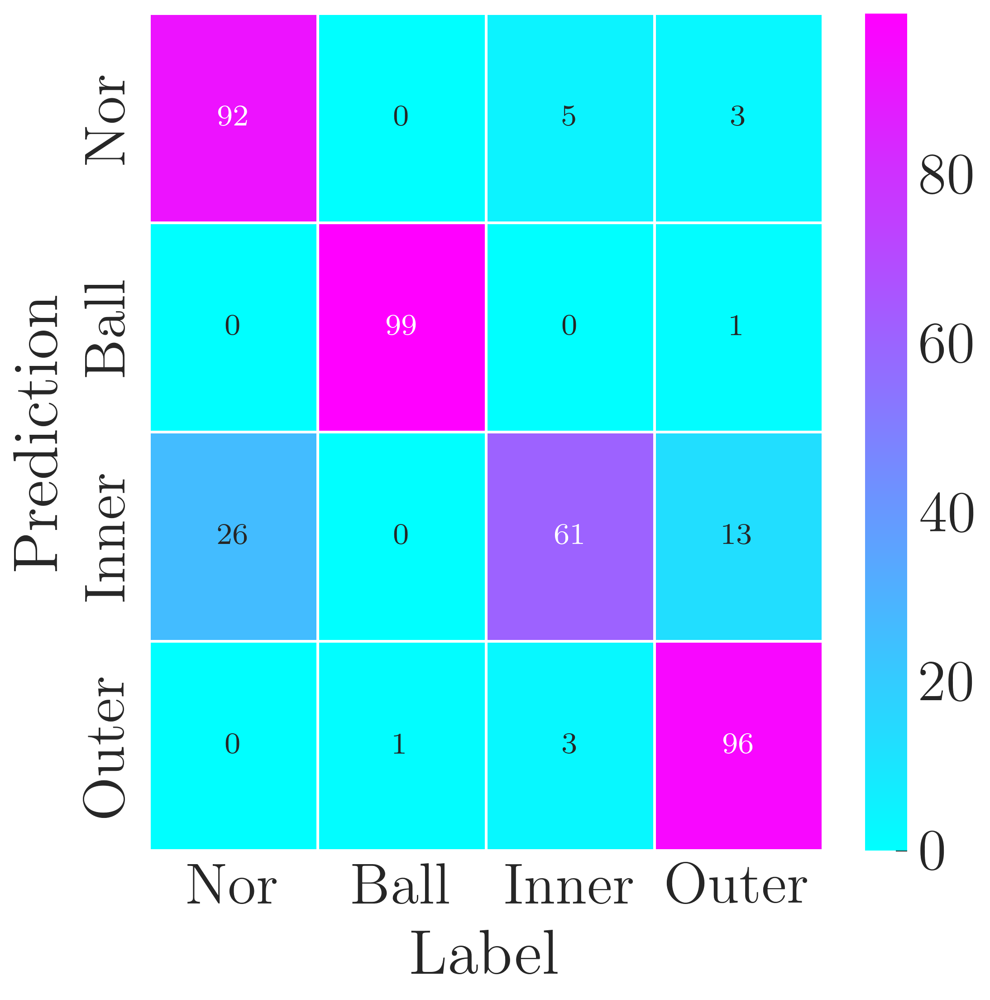

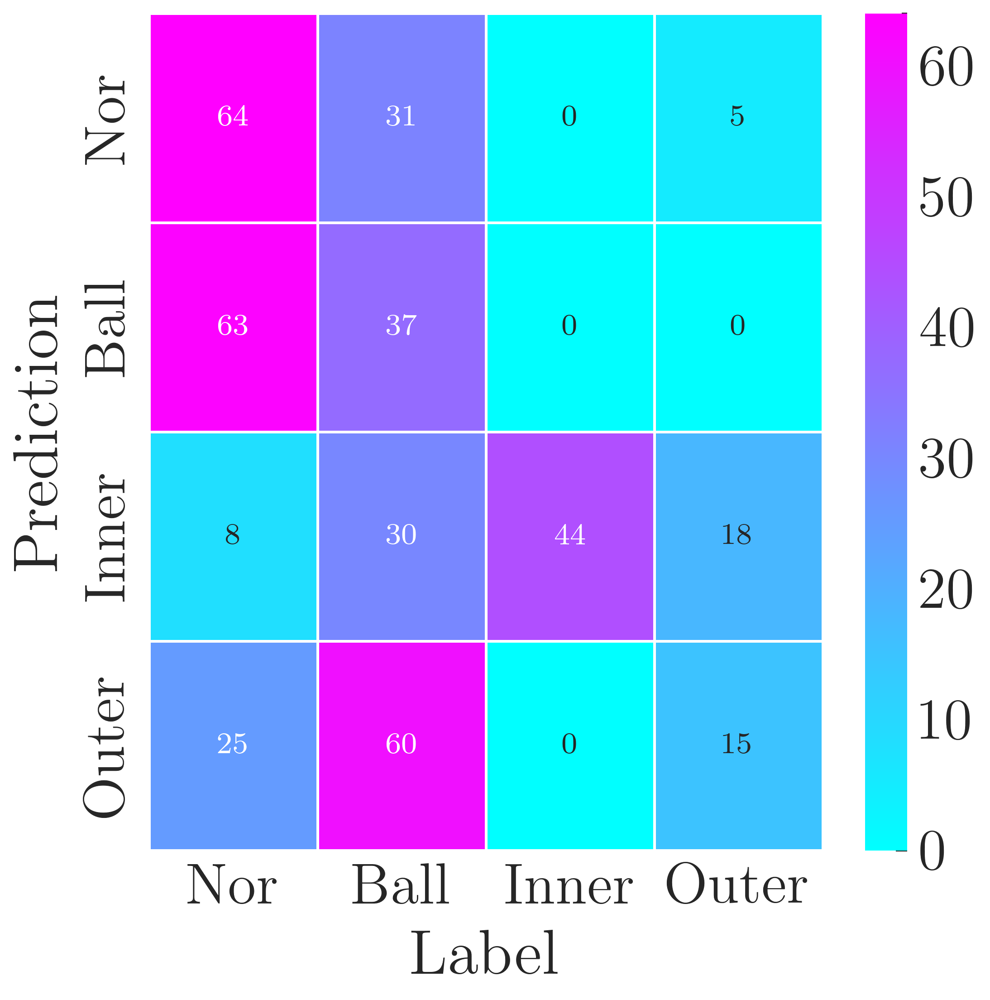

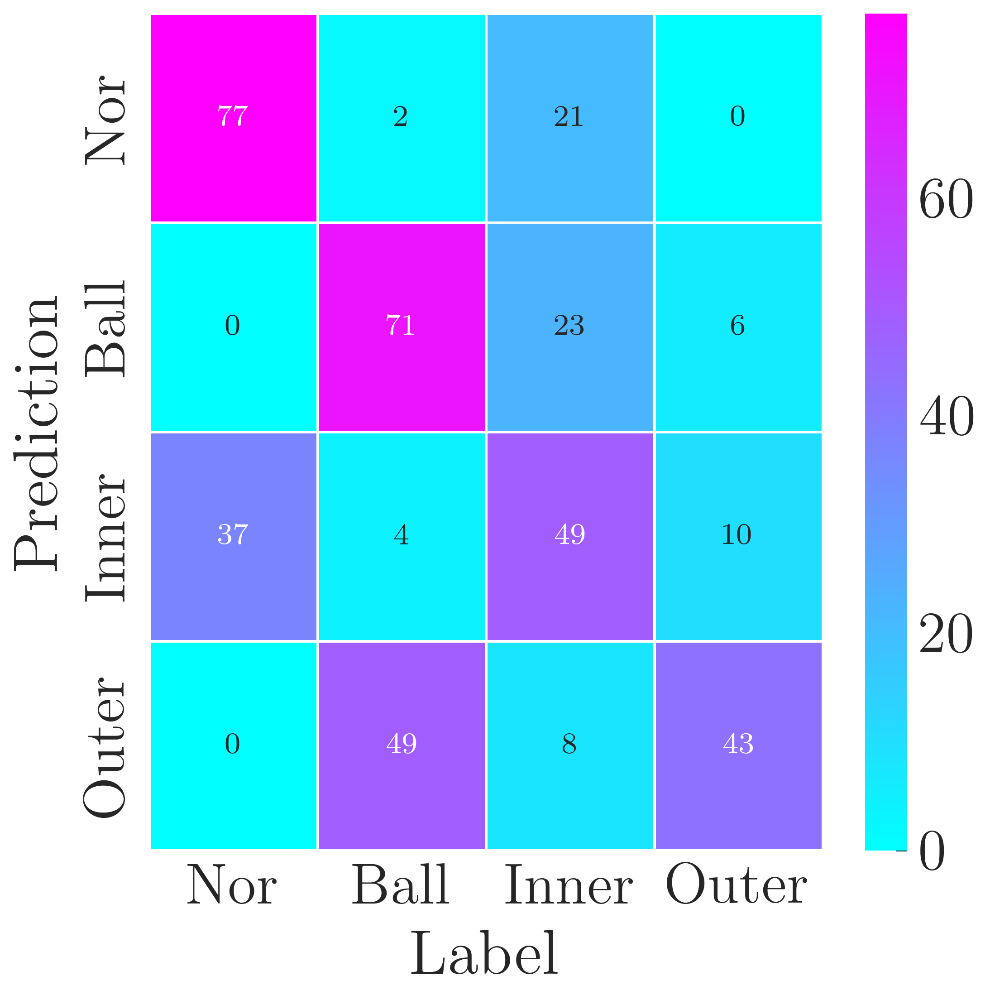

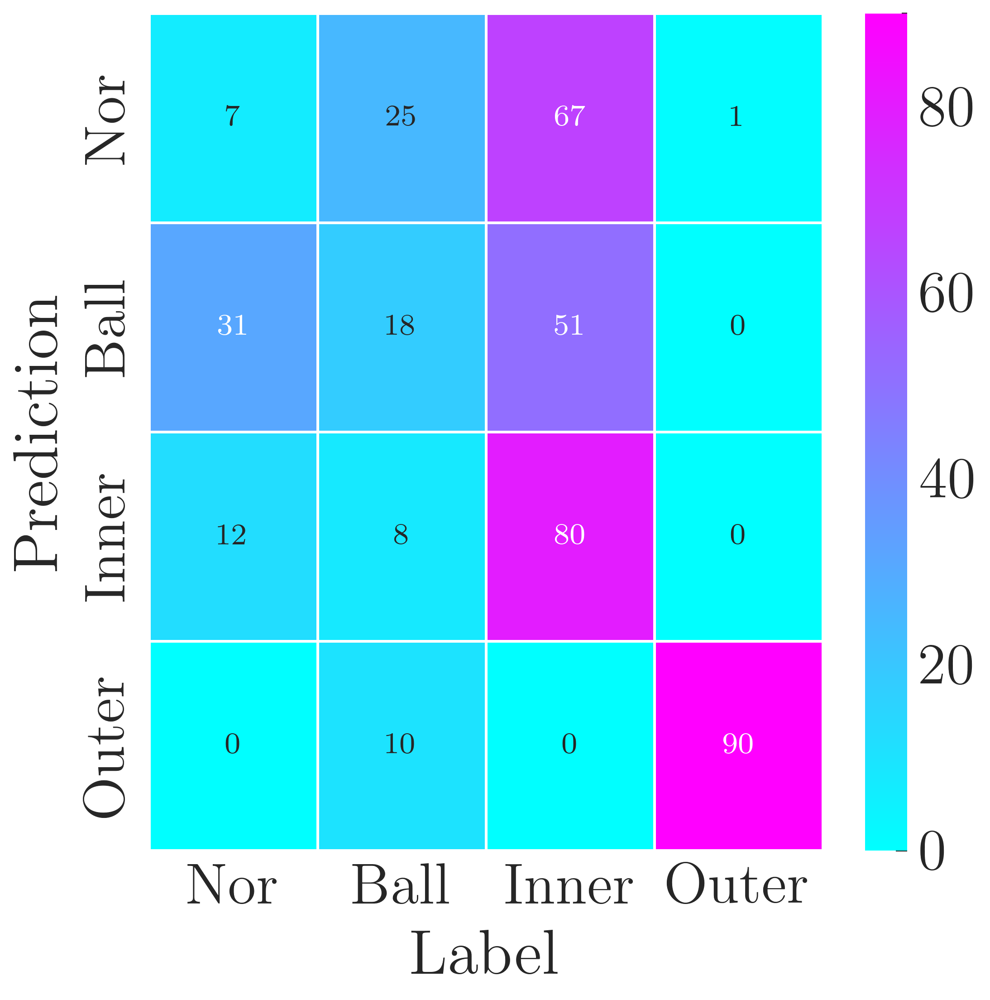

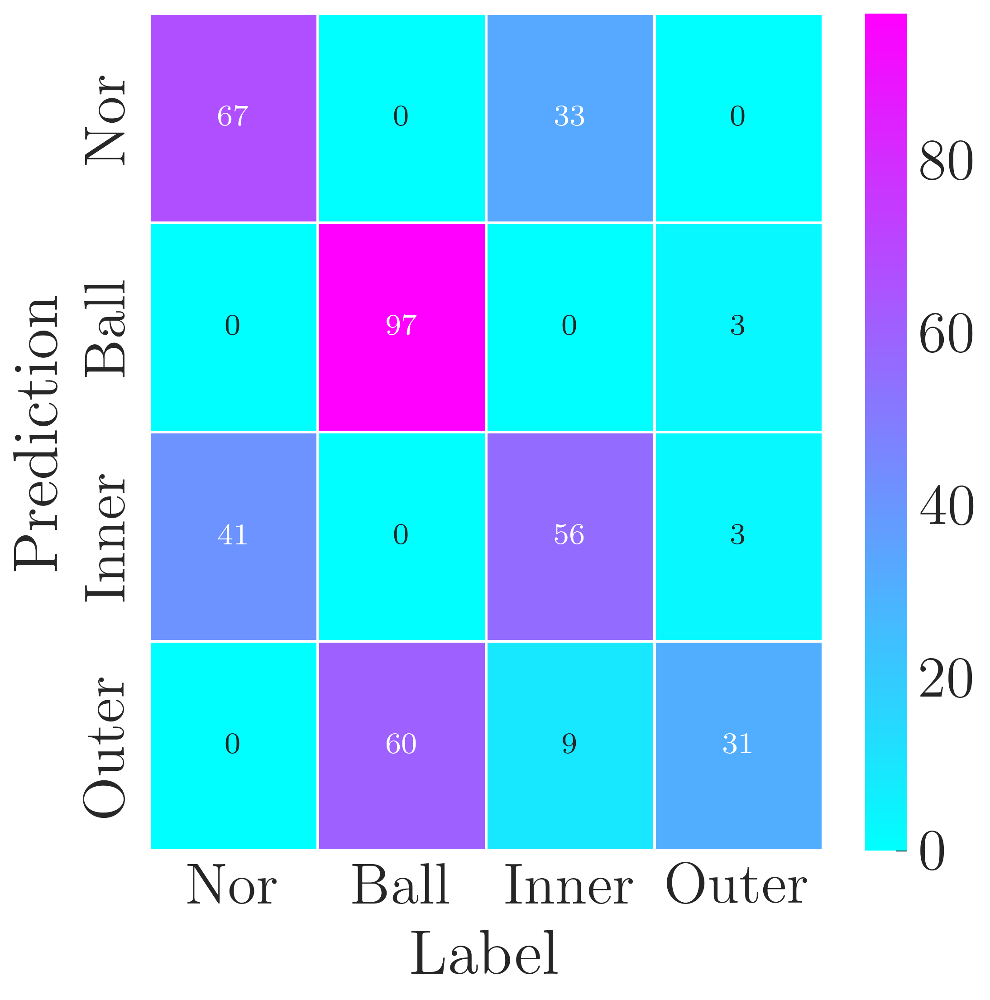

In [25]:
heatmap_confusion(AFN_confusion_matrix.cpu(),
                  x_labels = ['Nor','Ball','Inner','Outer'],
                  y_labels= ['Nor','Ball','Inner','Outer'],
                  name = 'AFN',
                  cmap = 'cool')
heatmap_confusion(ELM_confusion_matrix.cpu(),
                    x_labels = ['Nor','Ball','Inner','Outer'],
                    y_labels= ['Nor','Ball','Inner','Outer'],
                    name = 'ELM',
                    cmap = 'cool')
heatmap_confusion(WKN_confusion_matrix.cpu(),
                    x_labels = ['Nor','Ball','Inner','Outer'],
                    y_labels= ['Nor','Ball','Inner','Outer'],
                    name = 'WKN',
                    cmap = 'cool')
heatmap_confusion(Resnet_confusion_matrix.cpu(),
                    x_labels = ['Nor','Ball','Inner','Outer'],
                    y_labels= ['Nor','Ball','Inner','Outer'],
                    name = 'Resnet',
                    cmap = 'cool')
heatmap_confusion(MWA_CNN_confusion_matrix.cpu(),
                    x_labels = ['Nor','Ball','Inner','Outer'],
                    y_labels= ['Nor','Ball','Inner','Outer'],
                    name = 'MWA_CNN',
                    cmap = 'cool')

#### 2.3 小修的sincnet

In [5]:



args.model = 'Sincnet' # wave_resnet 'resnet', Huan_net, Dong_net

# args.setting = 

exp = exp_model_dic[args.exp](args)


train_loader, test_loader, val_loader = exp.get_data()
# Huan_dict = torch.load('/home/richie_thu/_Richie_project/Deep symbolic net/rul prediction/save_dir/THU10_wave_4test_lr0.001_Huan_net/checkpoint.pth')
sinc_dict = torch.load('/home/richie_thu/_Richie_project/Deep symbolic net/rul prediction/save_dir/THU10_sinc_net_4test_lr0.001_Sincnet/checkpoint.pth')
# Huan_dict = torch.load('/home/richie_thu/_Richie_project/Deep symbolic net/rul prediction/save_dir/THU10_Huan_net_4test_lr0.001_Huan_net/checkpoint.pth')
exp.net.load_state_dict(sinc_dict)

train_loader, test_loader, val_loader = exp.get_data()
testx,testy = test_loader.dataset.x,test_loader.dataset.y
aa = exp.net(testx.cuda())


metric = ConfusionMatrix(num_classes = args.num_class).to(args.device)
confusion_matrix = metric(aa.argmax(dim=1),testy.argmax(dim=1).to(args.device))
print(confusion_matrix)

noise_dblist = [-5,-4,-3,-2,-1,0,1,2,3,4,5,6,7,8,9,10,11]
list = []
for noise in  noise_dblist:
    testx_noise = testx.cuda() + wgn2(testx,noise)
    pred = exp.net(testx_noise.cuda())
    acc = (pred.argmax(dim=1) == testy.argmax(dim=1).to(args.device)).sum().item()/len(testy)
    list.append(acc)
print(list)

exp THU10_sinc_net_4test_lr0.001_Sincnet begin
tensor([[64,  2, 25,  9],
        [ 0, 99,  0,  1],
        [40,  1, 58,  1],
        [ 0,  1, 63, 36]], device='cuda:0')
[0.5, 0.505, 0.4775, 0.5025, 0.4825, 0.48, 0.45, 0.4575, 0.455, 0.475, 0.4875, 0.455, 0.4975, 0.4925, 0.4925, 0.57, 0.56]


混淆矩阵

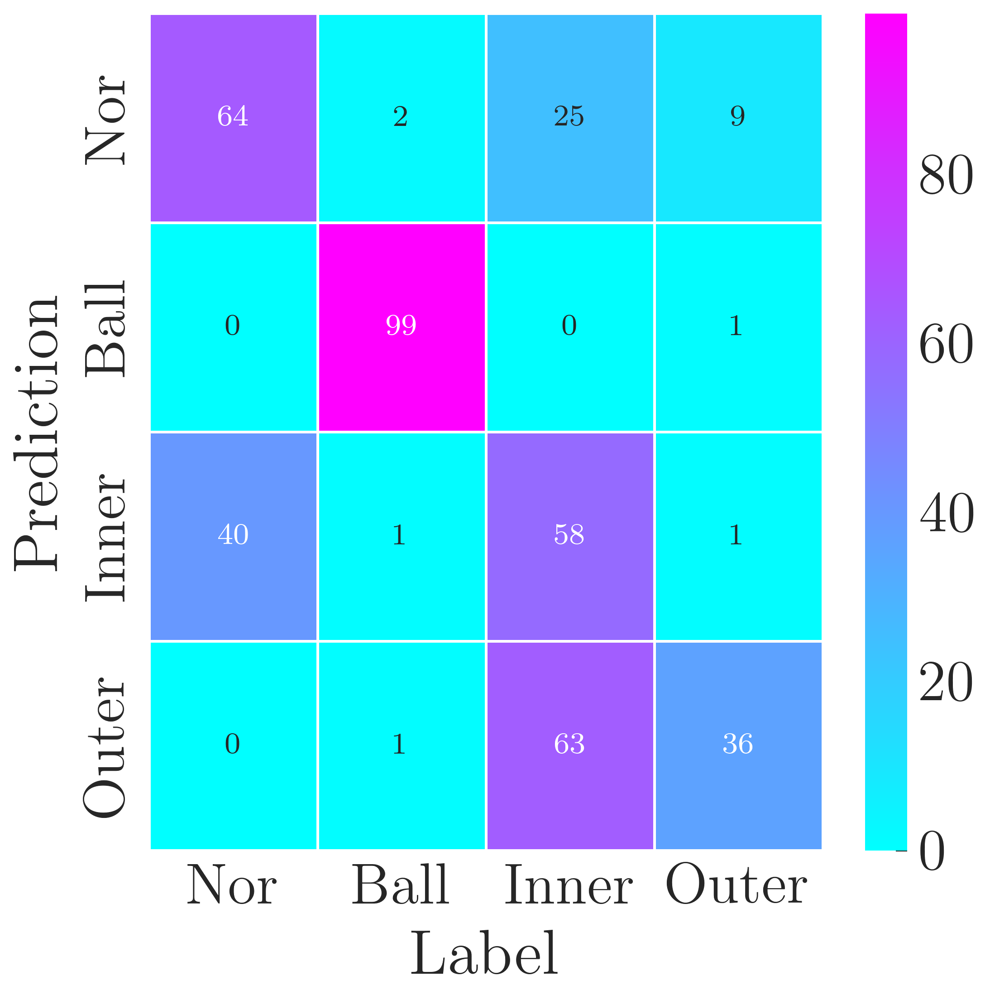

In [10]:
heatmap_confusion(confusion_matrix.cpu(),
                    x_labels = ['Nor','Ball','Inner','Outer'],
                    y_labels= ['Nor','Ball','Inner','Outer'],
                    name = 'SincNet',
                    cmap = 'cool')

在10Hz测试抗噪音能力

In [4]:
exp.args.data_dir = '/home/richie_thu/_Richie_project/dataset/Thu1_down.mat'
train_loader, test_loader, val_loader = exp.get_data()
testx,testy = test_loader.dataset.x,test_loader.dataset.y
aa = exp.net(testx.cuda())


metric = ConfusionMatrix(num_classes = args.num_class).to(args.device)
confusion_matrix = metric(aa.argmax(dim=1),testy.argmax(dim=1).to(args.device))
print(confusion_matrix)

noise_dblist = [-5,-4,-3,-2,-1,0,1,2,3,4,5,6,7,8,9,10,11]
list = []
for noise in  noise_dblist:
    testx_noise = testx.cuda() + wgn2(testx,noise)
    pred = exp.net(testx_noise.cuda())
    acc = (pred.argmax(dim=1) == testy.argmax(dim=1).to(args.device)).sum().item()/len(testy)
    list.append(acc)
print(list)

NameError: name 'exp' is not defined

绘制抗噪声

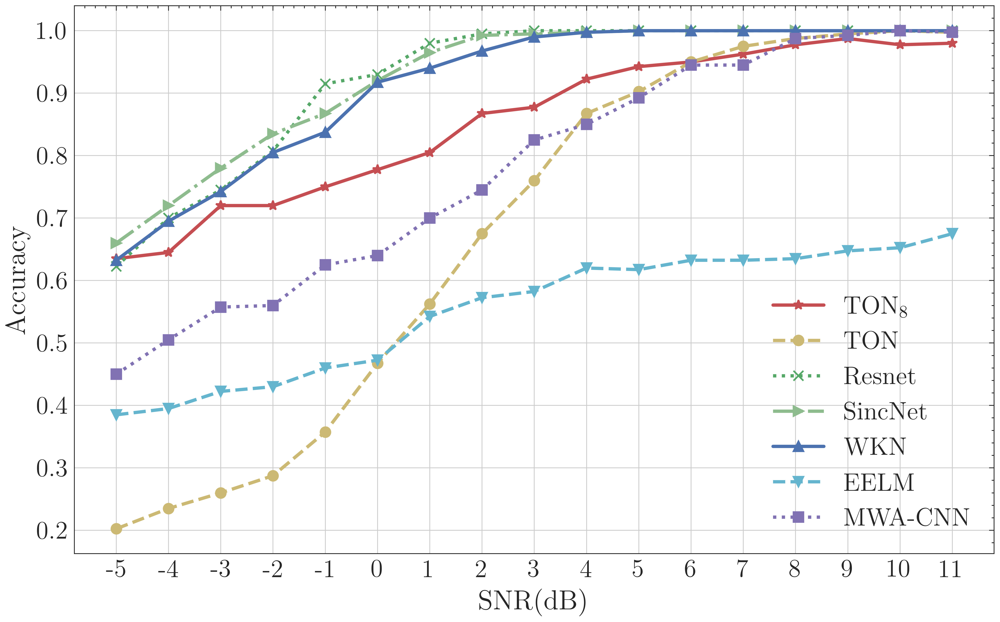

In [14]:
import matplotlib.pyplot as plt

# 数据整理
# TON = [0.2025, 0.235, 0.26, 0.2875, 0.3575, 0.4675, 0.5625, 0.675, 0.76, 0.8675, 0.9025, 0.95, 0.975, 0.9875, 0.995, 1.0, 0.9975]
# resnet = [0.3875, 0.4375, 0.415, 0.475, 0.535, 0.5475, 0.5725, 0.6375, 0.6575, 0.6825, 0.7025, 0.6975, 0.71, 0.6925, 0.675, 0.6275, 0.6525]
# dong = [0.385, 0.395, 0.4225, 0.43, 0.46, 0.4725, 0.5425, 0.5725, 0.5825, 0.62, 0.6175, 0.6325, 0.6325, 0.635, 0.6475, 0.6525, 0.675]
# wave = [0.3925, 0.4225, 0.4725, 0.53, 0.5575, 0.5575, 0.6325, 0.6375, 0.6675, 0.66, 0.6725, 0.67, 0.705, 0.695, 0.6925, 0.7075, 0.7325]
# huan = [0.515, 0.5775, 0.68, 0.7275, 0.7825, 0.8675, 0.89, 0.9175, 0.9475, 0.935, 0.9375, 0.9675, 0.945, 0.985, 0.9475, 0.965, 0.96]

# x = [-5,-4,-3,-2,-1,0,1,2,3,4,5,6,7,8,9,10,11]

# left = 5
# right = 14
# ton_acc = np.array(TON)[left:right]
# resnet_acc = np.array(resnet)[left:right]
# dong_acc = np.array(dong)[left:right]
# wave_acc = np.array(wave)[left:right]
# huan_acc = np.array(huan)[left:right]
# resnet = [i/0.75 for i in resnet]
# dong = [i/0.75 for i in dong]
# wave = [i/0.75 for i in wave]

import numpy as np

TON2 = np.array([0.635, 0.645, 0.72, 0.72, 0.75, 0.7775, 0.805, 0.8675, 0.8775, 0.9225, 0.9425, 0.95, 0.9625, 0.9775, 0.9875, 0.9775, 0.98])
huan = np.array([0.45, 0.505, 0.5575, 0.56, 0.625, 0.64, 0.7, 0.745, 0.825, 0.85, 0.8925, 0.945, 0.945, 0.9875, 0.9925, 1.0, 0.9975])
TON = np.array([0.2025, 0.235, 0.26, 0.2875, 0.3575, 0.4675, 0.5625, 0.675, 0.76, 0.8675, 0.9025, 0.95, 0.975, 0.9875, 0.995, 1.0, 0.9975])
wave = np.array([0.6325, 0.695, 0.7425, 0.805, 0.8375, 0.9175, 0.94, 0.9675, 0.99, 0.9975, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0])
ELM = np.array([0.385, 0.395, 0.4225, 0.43, 0.46, 0.4725, 0.5425, 0.5725, 0.5825, 0.62, 0.6175, 0.6325, 0.6325, 0.635, 0.6475, 0.6525, 0.675])
resnet = np.array([0.6225, 0.7, 0.745, 0.8075, 0.915, 0.93, 0.98, 0.995, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0])
sincnet = np.array([0.66, 0.72, 0.78, 0.835, 0.8675, 0.92, 0.965, 0.9925, 0.995, 0.9975, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0])
x = [-5,-4,-3,-2,-1,0,1,2,3,4,5,6,7,8,9,10,11]

left = 0
right = 14
ton_acc = np.array(TON)
resnet_acc = np.array(resnet)
ELM_acc = np.array(ELM)
wave_acc = np.array(wave)
MWA_CNN_acc = np.array(huan)
ton_2acc = np.array(TON2)
sincnet_acc = np.array(sincnet)

# 绘制折线图colors = ['r','y', 'g','c' , 'b', 'm'] markers = ['*','o', 'x', 'v', '^', 's']
plt.figure(figsize=(10, 6))
plt.plot(ton_2acc, label='$\\text{TON}_8$',c = 'r',marker = '*',linewidth = 2)
plt.plot(ton_acc, label='TON',c = 'y',marker = 'o',linewidth = 2)
plt.plot(resnet_acc, label='Resnet',c = 'g',marker = 'x',linewidth = 2)
plt.plot(sincnet_acc, label='SincNet',c = 'darkseagreen',marker = '>',linewidth = 2)
plt.plot(wave_acc, label='WKN',c = 'b',marker = '^',linewidth = 2)
plt.plot(ELM_acc, label='EELM',c = 'c',marker = 'v',linewidth = 2)

plt.plot(MWA_CNN_acc, label='MWA-CNN',c = 'm',marker = 's',linewidth = 2)

plt.xticks(np.arange(len(x)), x)
plt.grid()
plt.xlabel('SNR(dB)')
plt.ylabel('Accuracy')
plt.legend()
plt.savefig(f'{path}SNR10_minor_revision.pdf', transparent=True, dpi=512)

plt.show()

## 3 权重

模型读取

期间更换过正常样本

In [3]:
config_dir = '/home/richie_thu/_Richie_project/Deep symbolic net/rul prediction/code/experiment/THU.yaml'


exp_model_dic = {'default':experiment_DFN,
                    'THU_FD':experiment_DFN,
                    'THU_COM':experiment_COM

                    }
args = setup_config(config_dir)




args.model = 'AFN' # wave_resnet 'resnet', Huan_net, Dong_net

# args.setting = 

exp = exp_model_dic[args.exp](args)


train_loader, test_loader, val_loader = exp.get_data()
# AFN_dict = torch.load('/home/richie_thu/_Richie_project/Deep symbolic net/rul prediction/save_dir/【1】THU10_wave_4test_lr0.001/checkpoint.pth')
# AFN_dict = torch.load('/home/richie_thu/_Richie_project/Deep symbolic net/rul prediction/save_dir/THU10_wave_4test_lr0.001_AFN/checkpoint.pth')
# AFN_dict = torch.load('/home/richie_thu/_Richie_project/Deep symbolic net/rul prediction/save_dir/THU10_wave_revision_AFN/checkpoint.pth') # 重新训练

AFN_dict = torch.load('/home/richie_thu/_Richie_project/Deep symbolic net/rul prediction/save_dir/THU10_wave_revisionbig_AFN/checkpoint.pth') # 重新训练
exp.net.load_state_dict(AFN_dict)

train_loader, test_loader, val_loader = exp.get_data()
testx,testy = test_loader.dataset.x,test_loader.dataset.y
aa = exp.net(testx.cuda())

acc = (aa.argmax(dim=1) == testy.argmax(dim=1).to(args.device)).sum().item()/len(testy)

print(acc)


metric = ConfusionMatrix(num_classes = args.num_class).to(args.device)
AFN_confusion_matrix = metric(aa.argmax(dim=1),testy.argmax(dim=1).to(args.device))
print(AFN_confusion_matrix)

# noise_dblist = [-5,-4,-3,-2,-1,0,1,2,3,4,5,6,7,8,9,10,11]
# acc_list = []
# for noise in  noise_dblist:
#     testx_noise = testx.cuda() + wgn2(testx,noise)
#     pred = exp.net(testx_noise.cuda())
#     acc = (pred.argmax(dim=1) == testy.argmax(dim=1).to(args.device)).sum().item()/len(testy)
#     acc_list.append(acc)
# print(acc_list)


# pred = exp.net(testx.cuda())
# acc = (pred.argmax(dim=1) == testy.argmax(dim=1).to(args.device)).sum().item()/len(testy)
# acc_list.append(acc)
# print(acc_list)

exp THU10_wave_revisionbig_downsample_AFN begin


RuntimeError: Error(s) in loading state_dict for DFN:
	Unexpected key(s) in state_dict: "symbolic_transform_layer.3.learnable_param_0f_c", "symbolic_transform_layer.3.learnable_param_0f_b", "symbolic_transform_layer.3.learnable_param_1f_c", "symbolic_transform_layer.3.learnable_param_1f_b", "symbolic_transform_layer.3.learnable_param_2f_c", "symbolic_transform_layer.3.learnable_param_2f_b", "symbolic_transform_layer.3.learnable_param_3f_c", "symbolic_transform_layer.3.learnable_param_3f_b", "symbolic_transform_layer.3.learnable_param_4f_c", "symbolic_transform_layer.3.learnable_param_4f_b", "symbolic_transform_layer.3.learnable_param_5f_c", "symbolic_transform_layer.3.learnable_param_5f_b", "symbolic_transform_layer.3.learnable_param_6f_c", "symbolic_transform_layer.3.learnable_param_6f_b", "symbolic_transform_layer.3.learnable_param_7f_c", "symbolic_transform_layer.3.learnable_param_7f_b", "symbolic_transform_layer.3.learnable_param_8f_c", "symbolic_transform_layer.3.learnable_param_8f_b", "symbolic_transform_layer.3.learnable_param_9f_c", "symbolic_transform_layer.3.learnable_param_9f_b", "symbolic_transform_layer.3.learnable_param_10f_c", "symbolic_transform_layer.3.learnable_param_10f_b", "symbolic_transform_layer.3.learnable_param_11f_c", "symbolic_transform_layer.3.learnable_param_11f_b", "symbolic_transform_layer.3.learnable_param_12f_c", "symbolic_transform_layer.3.learnable_param_12f_b", "symbolic_transform_layer.3.learnable_param_13f_c", "symbolic_transform_layer.3.learnable_param_13f_b", "symbolic_transform_layer.3.learnable_param_14f_c", "symbolic_transform_layer.3.learnable_param_14f_b", "symbolic_transform_layer.3.learnable_param_15f_c", "symbolic_transform_layer.3.learnable_param_15f_b", "symbolic_transform_layer.3.learnable_param.0.f_c", "symbolic_transform_layer.3.learnable_param.0.f_b", "symbolic_transform_layer.3.learnable_param.0.learnable_param_f_c", "symbolic_transform_layer.3.learnable_param.0.learnable_param_f_b", "symbolic_transform_layer.3.learnable_param.1.f_c", "symbolic_transform_layer.3.learnable_param.1.f_b", "symbolic_transform_layer.3.learnable_param.1.learnable_param_f_c", "symbolic_transform_layer.3.learnable_param.1.learnable_param_f_b", "symbolic_transform_layer.3.learnable_param.2.f_c", "symbolic_transform_layer.3.learnable_param.2.f_b", "symbolic_transform_layer.3.learnable_param.2.learnable_param_f_c", "symbolic_transform_layer.3.learnable_param.2.learnable_param_f_b", "symbolic_transform_layer.3.learnable_param.3.f_c", "symbolic_transform_layer.3.learnable_param.3.f_b", "symbolic_transform_layer.3.learnable_param.3.learnable_param_f_c", "symbolic_transform_layer.3.learnable_param.3.learnable_param_f_b", "symbolic_transform_layer.3.learnable_param.4.f_c", "symbolic_transform_layer.3.learnable_param.4.f_b", "symbolic_transform_layer.3.learnable_param.4.learnable_param_f_c", "symbolic_transform_layer.3.learnable_param.4.learnable_param_f_b", "symbolic_transform_layer.3.learnable_param.5.f_c", "symbolic_transform_layer.3.learnable_param.5.f_b", "symbolic_transform_layer.3.learnable_param.5.learnable_param_f_c", "symbolic_transform_layer.3.learnable_param.5.learnable_param_f_b", "symbolic_transform_layer.3.learnable_param.6.f_c", "symbolic_transform_layer.3.learnable_param.6.f_b", "symbolic_transform_layer.3.learnable_param.6.learnable_param_f_c", "symbolic_transform_layer.3.learnable_param.6.learnable_param_f_b", "symbolic_transform_layer.3.learnable_param.7.f_c", "symbolic_transform_layer.3.learnable_param.7.f_b", "symbolic_transform_layer.3.learnable_param.7.learnable_param_f_c", "symbolic_transform_layer.3.learnable_param.7.learnable_param_f_b", "symbolic_transform_layer.3.learnable_param.8.f_c", "symbolic_transform_layer.3.learnable_param.8.f_b", "symbolic_transform_layer.3.learnable_param.8.learnable_param_f_c", "symbolic_transform_layer.3.learnable_param.8.learnable_param_f_b", "symbolic_transform_layer.3.learnable_param.9.f_c", "symbolic_transform_layer.3.learnable_param.9.f_b", "symbolic_transform_layer.3.learnable_param.9.learnable_param_f_c", "symbolic_transform_layer.3.learnable_param.9.learnable_param_f_b", "symbolic_transform_layer.3.learnable_param.10.f_c", "symbolic_transform_layer.3.learnable_param.10.f_b", "symbolic_transform_layer.3.learnable_param.10.learnable_param_f_c", "symbolic_transform_layer.3.learnable_param.10.learnable_param_f_b", "symbolic_transform_layer.3.learnable_param.11.f_c", "symbolic_transform_layer.3.learnable_param.11.f_b", "symbolic_transform_layer.3.learnable_param.11.learnable_param_f_c", "symbolic_transform_layer.3.learnable_param.11.learnable_param_f_b", "symbolic_transform_layer.3.learnable_param.12.f_c", "symbolic_transform_layer.3.learnable_param.12.f_b", "symbolic_transform_layer.3.learnable_param.12.learnable_param_f_c", "symbolic_transform_layer.3.learnable_param.12.learnable_param_f_b", "symbolic_transform_layer.3.learnable_param.13.f_c", "symbolic_transform_layer.3.learnable_param.13.f_b", "symbolic_transform_layer.3.learnable_param.13.learnable_param_f_c", "symbolic_transform_layer.3.learnable_param.13.learnable_param_f_b", "symbolic_transform_layer.3.learnable_param.14.f_c", "symbolic_transform_layer.3.learnable_param.14.f_b", "symbolic_transform_layer.3.learnable_param.14.learnable_param_f_c", "symbolic_transform_layer.3.learnable_param.14.learnable_param_f_b", "symbolic_transform_layer.3.learnable_param.15.f_c", "symbolic_transform_layer.3.learnable_param.15.f_b", "symbolic_transform_layer.3.learnable_param.15.learnable_param_f_c", "symbolic_transform_layer.3.learnable_param.15.learnable_param_f_b", "symbolic_transform_layer.3.filter_op.f_c", "symbolic_transform_layer.3.filter_op.f_b", "symbolic_transform_layer.3.filter_op.learnable_param_f_c", "symbolic_transform_layer.3.filter_op.learnable_param_f_b", "symbolic_transform_layer.3.channel_conv.weight", "symbolic_transform_layer.3.down_conv.weight", "symbolic_transform_layer.4.learnable_param_0f_c", "symbolic_transform_layer.4.learnable_param_0f_b", "symbolic_transform_layer.4.learnable_param_1f_c", "symbolic_transform_layer.4.learnable_param_1f_b", "symbolic_transform_layer.4.learnable_param_2f_c", "symbolic_transform_layer.4.learnable_param_2f_b", "symbolic_transform_layer.4.learnable_param_3f_c", "symbolic_transform_layer.4.learnable_param_3f_b", "symbolic_transform_layer.4.learnable_param_4f_c", "symbolic_transform_layer.4.learnable_param_4f_b", "symbolic_transform_layer.4.learnable_param_5f_c", "symbolic_transform_layer.4.learnable_param_5f_b", "symbolic_transform_layer.4.learnable_param_6f_c", "symbolic_transform_layer.4.learnable_param_6f_b", "symbolic_transform_layer.4.learnable_param_7f_c", "symbolic_transform_layer.4.learnable_param_7f_b", "symbolic_transform_layer.4.learnable_param_8f_c", "symbolic_transform_layer.4.learnable_param_8f_b", "symbolic_transform_layer.4.learnable_param_9f_c", "symbolic_transform_layer.4.learnable_param_9f_b", "symbolic_transform_layer.4.learnable_param_10f_c", "symbolic_transform_layer.4.learnable_param_10f_b", "symbolic_transform_layer.4.learnable_param_11f_c", "symbolic_transform_layer.4.learnable_param_11f_b", "symbolic_transform_layer.4.learnable_param_12f_c", "symbolic_transform_layer.4.learnable_param_12f_b", "symbolic_transform_layer.4.learnable_param_13f_c", "symbolic_transform_layer.4.learnable_param_13f_b", "symbolic_transform_layer.4.learnable_param_14f_c", "symbolic_transform_layer.4.learnable_param_14f_b", "symbolic_transform_layer.4.learnable_param_15f_c", "symbolic_transform_layer.4.learnable_param_15f_b", "symbolic_transform_layer.4.learnable_param.0.f_c", "symbolic_transform_layer.4.learnable_param.0.f_b", "symbolic_transform_layer.4.learnable_param.0.learnable_param_f_c", "symbolic_transform_layer.4.learnable_param.0.learnable_param_f_b", "symbolic_transform_layer.4.learnable_param.1.f_c", "symbolic_transform_layer.4.learnable_param.1.f_b", "symbolic_transform_layer.4.learnable_param.1.learnable_param_f_c", "symbolic_transform_layer.4.learnable_param.1.learnable_param_f_b", "symbolic_transform_layer.4.learnable_param.2.f_c", "symbolic_transform_layer.4.learnable_param.2.f_b", "symbolic_transform_layer.4.learnable_param.2.learnable_param_f_c", "symbolic_transform_layer.4.learnable_param.2.learnable_param_f_b", "symbolic_transform_layer.4.learnable_param.3.f_c", "symbolic_transform_layer.4.learnable_param.3.f_b", "symbolic_transform_layer.4.learnable_param.3.learnable_param_f_c", "symbolic_transform_layer.4.learnable_param.3.learnable_param_f_b", "symbolic_transform_layer.4.learnable_param.4.f_c", "symbolic_transform_layer.4.learnable_param.4.f_b", "symbolic_transform_layer.4.learnable_param.4.learnable_param_f_c", "symbolic_transform_layer.4.learnable_param.4.learnable_param_f_b", "symbolic_transform_layer.4.learnable_param.5.f_c", "symbolic_transform_layer.4.learnable_param.5.f_b", "symbolic_transform_layer.4.learnable_param.5.learnable_param_f_c", "symbolic_transform_layer.4.learnable_param.5.learnable_param_f_b", "symbolic_transform_layer.4.learnable_param.6.f_c", "symbolic_transform_layer.4.learnable_param.6.f_b", "symbolic_transform_layer.4.learnable_param.6.learnable_param_f_c", "symbolic_transform_layer.4.learnable_param.6.learnable_param_f_b", "symbolic_transform_layer.4.learnable_param.7.f_c", "symbolic_transform_layer.4.learnable_param.7.f_b", "symbolic_transform_layer.4.learnable_param.7.learnable_param_f_c", "symbolic_transform_layer.4.learnable_param.7.learnable_param_f_b", "symbolic_transform_layer.4.learnable_param.8.f_c", "symbolic_transform_layer.4.learnable_param.8.f_b", "symbolic_transform_layer.4.learnable_param.8.learnable_param_f_c", "symbolic_transform_layer.4.learnable_param.8.learnable_param_f_b", "symbolic_transform_layer.4.learnable_param.9.f_c", "symbolic_transform_layer.4.learnable_param.9.f_b", "symbolic_transform_layer.4.learnable_param.9.learnable_param_f_c", "symbolic_transform_layer.4.learnable_param.9.learnable_param_f_b", "symbolic_transform_layer.4.learnable_param.10.f_c", "symbolic_transform_layer.4.learnable_param.10.f_b", "symbolic_transform_layer.4.learnable_param.10.learnable_param_f_c", "symbolic_transform_layer.4.learnable_param.10.learnable_param_f_b", "symbolic_transform_layer.4.learnable_param.11.f_c", "symbolic_transform_layer.4.learnable_param.11.f_b", "symbolic_transform_layer.4.learnable_param.11.learnable_param_f_c", "symbolic_transform_layer.4.learnable_param.11.learnable_param_f_b", "symbolic_transform_layer.4.learnable_param.12.f_c", "symbolic_transform_layer.4.learnable_param.12.f_b", "symbolic_transform_layer.4.learnable_param.12.learnable_param_f_c", "symbolic_transform_layer.4.learnable_param.12.learnable_param_f_b", "symbolic_transform_layer.4.learnable_param.13.f_c", "symbolic_transform_layer.4.learnable_param.13.f_b", "symbolic_transform_layer.4.learnable_param.13.learnable_param_f_c", "symbolic_transform_layer.4.learnable_param.13.learnable_param_f_b", "symbolic_transform_layer.4.learnable_param.14.f_c", "symbolic_transform_layer.4.learnable_param.14.f_b", "symbolic_transform_layer.4.learnable_param.14.learnable_param_f_c", "symbolic_transform_layer.4.learnable_param.14.learnable_param_f_b", "symbolic_transform_layer.4.learnable_param.15.f_c", "symbolic_transform_layer.4.learnable_param.15.f_b", "symbolic_transform_layer.4.learnable_param.15.learnable_param_f_c", "symbolic_transform_layer.4.learnable_param.15.learnable_param_f_b", "symbolic_transform_layer.4.filter_op.f_c", "symbolic_transform_layer.4.filter_op.f_b", "symbolic_transform_layer.4.filter_op.learnable_param_f_c", "symbolic_transform_layer.4.filter_op.learnable_param_f_b", "symbolic_transform_layer.4.channel_conv.weight", "symbolic_transform_layer.4.down_conv.weight", "symbolic_transform_layer.5.learnable_param_0f_c", "symbolic_transform_layer.5.learnable_param_0f_b", "symbolic_transform_layer.5.learnable_param_1f_c", "symbolic_transform_layer.5.learnable_param_1f_b", "symbolic_transform_layer.5.learnable_param_2f_c", "symbolic_transform_layer.5.learnable_param_2f_b", "symbolic_transform_layer.5.learnable_param_3f_c", "symbolic_transform_layer.5.learnable_param_3f_b", "symbolic_transform_layer.5.learnable_param_4f_c", "symbolic_transform_layer.5.learnable_param_4f_b", "symbolic_transform_layer.5.learnable_param_5f_c", "symbolic_transform_layer.5.learnable_param_5f_b", "symbolic_transform_layer.5.learnable_param_6f_c", "symbolic_transform_layer.5.learnable_param_6f_b", "symbolic_transform_layer.5.learnable_param_7f_c", "symbolic_transform_layer.5.learnable_param_7f_b", "symbolic_transform_layer.5.learnable_param_8f_c", "symbolic_transform_layer.5.learnable_param_8f_b", "symbolic_transform_layer.5.learnable_param_9f_c", "symbolic_transform_layer.5.learnable_param_9f_b", "symbolic_transform_layer.5.learnable_param_10f_c", "symbolic_transform_layer.5.learnable_param_10f_b", "symbolic_transform_layer.5.learnable_param_11f_c", "symbolic_transform_layer.5.learnable_param_11f_b", "symbolic_transform_layer.5.learnable_param_12f_c", "symbolic_transform_layer.5.learnable_param_12f_b", "symbolic_transform_layer.5.learnable_param_13f_c", "symbolic_transform_layer.5.learnable_param_13f_b", "symbolic_transform_layer.5.learnable_param_14f_c", "symbolic_transform_layer.5.learnable_param_14f_b", "symbolic_transform_layer.5.learnable_param_15f_c", "symbolic_transform_layer.5.learnable_param_15f_b", "symbolic_transform_layer.5.learnable_param.0.f_c", "symbolic_transform_layer.5.learnable_param.0.f_b", "symbolic_transform_layer.5.learnable_param.0.learnable_param_f_c", "symbolic_transform_layer.5.learnable_param.0.learnable_param_f_b", "symbolic_transform_layer.5.learnable_param.1.f_c", "symbolic_transform_layer.5.learnable_param.1.f_b", "symbolic_transform_layer.5.learnable_param.1.learnable_param_f_c", "symbolic_transform_layer.5.learnable_param.1.learnable_param_f_b", "symbolic_transform_layer.5.learnable_param.2.f_c", "symbolic_transform_layer.5.learnable_param.2.f_b", "symbolic_transform_layer.5.learnable_param.2.learnable_param_f_c", "symbolic_transform_layer.5.learnable_param.2.learnable_param_f_b", "symbolic_transform_layer.5.learnable_param.3.f_c", "symbolic_transform_layer.5.learnable_param.3.f_b", "symbolic_transform_layer.5.learnable_param.3.learnable_param_f_c", "symbolic_transform_layer.5.learnable_param.3.learnable_param_f_b", "symbolic_transform_layer.5.learnable_param.4.f_c", "symbolic_transform_layer.5.learnable_param.4.f_b", "symbolic_transform_layer.5.learnable_param.4.learnable_param_f_c", "symbolic_transform_layer.5.learnable_param.4.learnable_param_f_b", "symbolic_transform_layer.5.learnable_param.5.f_c", "symbolic_transform_layer.5.learnable_param.5.f_b", "symbolic_transform_layer.5.learnable_param.5.learnable_param_f_c", "symbolic_transform_layer.5.learnable_param.5.learnable_param_f_b", "symbolic_transform_layer.5.learnable_param.6.f_c", "symbolic_transform_layer.5.learnable_param.6.f_b", "symbolic_transform_layer.5.learnable_param.6.learnable_param_f_c", "symbolic_transform_layer.5.learnable_param.6.learnable_param_f_b", "symbolic_transform_layer.5.learnable_param.7.f_c", "symbolic_transform_layer.5.learnable_param.7.f_b", "symbolic_transform_layer.5.learnable_param.7.learnable_param_f_c", "symbolic_transform_layer.5.learnable_param.7.learnable_param_f_b", "symbolic_transform_layer.5.learnable_param.8.f_c", "symbolic_transform_layer.5.learnable_param.8.f_b", "symbolic_transform_layer.5.learnable_param.8.learnable_param_f_c", "symbolic_transform_layer.5.learnable_param.8.learnable_param_f_b", "symbolic_transform_layer.5.learnable_param.9.f_c", "symbolic_transform_layer.5.learnable_param.9.f_b", "symbolic_transform_layer.5.learnable_param.9.learnable_param_f_c", "symbolic_transform_layer.5.learnable_param.9.learnable_param_f_b", "symbolic_transform_layer.5.learnable_param.10.f_c", "symbolic_transform_layer.5.learnable_param.10.f_b", "symbolic_transform_layer.5.learnable_param.10.learnable_param_f_c", "symbolic_transform_layer.5.learnable_param.10.learnable_param_f_b", "symbolic_transform_layer.5.learnable_param.11.f_c", "symbolic_transform_layer.5.learnable_param.11.f_b", "symbolic_transform_layer.5.learnable_param.11.learnable_param_f_c", "symbolic_transform_layer.5.learnable_param.11.learnable_param_f_b", "symbolic_transform_layer.5.learnable_param.12.f_c", "symbolic_transform_layer.5.learnable_param.12.f_b", "symbolic_transform_layer.5.learnable_param.12.learnable_param_f_c", "symbolic_transform_layer.5.learnable_param.12.learnable_param_f_b", "symbolic_transform_layer.5.learnable_param.13.f_c", "symbolic_transform_layer.5.learnable_param.13.f_b", "symbolic_transform_layer.5.learnable_param.13.learnable_param_f_c", "symbolic_transform_layer.5.learnable_param.13.learnable_param_f_b", "symbolic_transform_layer.5.learnable_param.14.f_c", "symbolic_transform_layer.5.learnable_param.14.f_b", "symbolic_transform_layer.5.learnable_param.14.learnable_param_f_c", "symbolic_transform_layer.5.learnable_param.14.learnable_param_f_b", "symbolic_transform_layer.5.learnable_param.15.f_c", "symbolic_transform_layer.5.learnable_param.15.f_b", "symbolic_transform_layer.5.learnable_param.15.learnable_param_f_c", "symbolic_transform_layer.5.learnable_param.15.learnable_param_f_b", "symbolic_transform_layer.5.filter_op.f_c", "symbolic_transform_layer.5.filter_op.f_b", "symbolic_transform_layer.5.filter_op.learnable_param_f_c", "symbolic_transform_layer.5.filter_op.learnable_param_f_b", "symbolic_transform_layer.5.channel_conv.weight", "symbolic_transform_layer.5.down_conv.weight", "symbolic_transform_layer.6.learnable_param_0f_c", "symbolic_transform_layer.6.learnable_param_0f_b", "symbolic_transform_layer.6.learnable_param_1f_c", "symbolic_transform_layer.6.learnable_param_1f_b", "symbolic_transform_layer.6.learnable_param_2f_c", "symbolic_transform_layer.6.learnable_param_2f_b", "symbolic_transform_layer.6.learnable_param_3f_c", "symbolic_transform_layer.6.learnable_param_3f_b", "symbolic_transform_layer.6.learnable_param_4f_c", "symbolic_transform_layer.6.learnable_param_4f_b", "symbolic_transform_layer.6.learnable_param_5f_c", "symbolic_transform_layer.6.learnable_param_5f_b", "symbolic_transform_layer.6.learnable_param_6f_c", "symbolic_transform_layer.6.learnable_param_6f_b", "symbolic_transform_layer.6.learnable_param_7f_c", "symbolic_transform_layer.6.learnable_param_7f_b", "symbolic_transform_layer.6.learnable_param_8f_c", "symbolic_transform_layer.6.learnable_param_8f_b", "symbolic_transform_layer.6.learnable_param_9f_c", "symbolic_transform_layer.6.learnable_param_9f_b", "symbolic_transform_layer.6.learnable_param_10f_c", "symbolic_transform_layer.6.learnable_param_10f_b", "symbolic_transform_layer.6.learnable_param_11f_c", "symbolic_transform_layer.6.learnable_param_11f_b", "symbolic_transform_layer.6.learnable_param_12f_c", "symbolic_transform_layer.6.learnable_param_12f_b", "symbolic_transform_layer.6.learnable_param_13f_c", "symbolic_transform_layer.6.learnable_param_13f_b", "symbolic_transform_layer.6.learnable_param_14f_c", "symbolic_transform_layer.6.learnable_param_14f_b", "symbolic_transform_layer.6.learnable_param_15f_c", "symbolic_transform_layer.6.learnable_param_15f_b", "symbolic_transform_layer.6.learnable_param.0.f_c", "symbolic_transform_layer.6.learnable_param.0.f_b", "symbolic_transform_layer.6.learnable_param.0.learnable_param_f_c", "symbolic_transform_layer.6.learnable_param.0.learnable_param_f_b", "symbolic_transform_layer.6.learnable_param.1.f_c", "symbolic_transform_layer.6.learnable_param.1.f_b", "symbolic_transform_layer.6.learnable_param.1.learnable_param_f_c", "symbolic_transform_layer.6.learnable_param.1.learnable_param_f_b", "symbolic_transform_layer.6.learnable_param.2.f_c", "symbolic_transform_layer.6.learnable_param.2.f_b", "symbolic_transform_layer.6.learnable_param.2.learnable_param_f_c", "symbolic_transform_layer.6.learnable_param.2.learnable_param_f_b", "symbolic_transform_layer.6.learnable_param.3.f_c", "symbolic_transform_layer.6.learnable_param.3.f_b", "symbolic_transform_layer.6.learnable_param.3.learnable_param_f_c", "symbolic_transform_layer.6.learnable_param.3.learnable_param_f_b", "symbolic_transform_layer.6.learnable_param.4.f_c", "symbolic_transform_layer.6.learnable_param.4.f_b", "symbolic_transform_layer.6.learnable_param.4.learnable_param_f_c", "symbolic_transform_layer.6.learnable_param.4.learnable_param_f_b", "symbolic_transform_layer.6.learnable_param.5.f_c", "symbolic_transform_layer.6.learnable_param.5.f_b", "symbolic_transform_layer.6.learnable_param.5.learnable_param_f_c", "symbolic_transform_layer.6.learnable_param.5.learnable_param_f_b", "symbolic_transform_layer.6.learnable_param.6.f_c", "symbolic_transform_layer.6.learnable_param.6.f_b", "symbolic_transform_layer.6.learnable_param.6.learnable_param_f_c", "symbolic_transform_layer.6.learnable_param.6.learnable_param_f_b", "symbolic_transform_layer.6.learnable_param.7.f_c", "symbolic_transform_layer.6.learnable_param.7.f_b", "symbolic_transform_layer.6.learnable_param.7.learnable_param_f_c", "symbolic_transform_layer.6.learnable_param.7.learnable_param_f_b", "symbolic_transform_layer.6.learnable_param.8.f_c", "symbolic_transform_layer.6.learnable_param.8.f_b", "symbolic_transform_layer.6.learnable_param.8.learnable_param_f_c", "symbolic_transform_layer.6.learnable_param.8.learnable_param_f_b", "symbolic_transform_layer.6.learnable_param.9.f_c", "symbolic_transform_layer.6.learnable_param.9.f_b", "symbolic_transform_layer.6.learnable_param.9.learnable_param_f_c", "symbolic_transform_layer.6.learnable_param.9.learnable_param_f_b", "symbolic_transform_layer.6.learnable_param.10.f_c", "symbolic_transform_layer.6.learnable_param.10.f_b", "symbolic_transform_layer.6.learnable_param.10.learnable_param_f_c", "symbolic_transform_layer.6.learnable_param.10.learnable_param_f_b", "symbolic_transform_layer.6.learnable_param.11.f_c", "symbolic_transform_layer.6.learnable_param.11.f_b", "symbolic_transform_layer.6.learnable_param.11.learnable_param_f_c", "symbolic_transform_layer.6.learnable_param.11.learnable_param_f_b", "symbolic_transform_layer.6.learnable_param.12.f_c", "symbolic_transform_layer.6.learnable_param.12.f_b", "symbolic_transform_layer.6.learnable_param.12.learnable_param_f_c", "symbolic_transform_layer.6.learnable_param.12.learnable_param_f_b", "symbolic_transform_layer.6.learnable_param.13.f_c", "symbolic_transform_layer.6.learnable_param.13.f_b", "symbolic_transform_layer.6.learnable_param.13.learnable_param_f_c", "symbolic_transform_layer.6.learnable_param.13.learnable_param_f_b", "symbolic_transform_layer.6.learnable_param.14.f_c", "symbolic_transform_layer.6.learnable_param.14.f_b", "symbolic_transform_layer.6.learnable_param.14.learnable_param_f_c", "symbolic_transform_layer.6.learnable_param.14.learnable_param_f_b", "symbolic_transform_layer.6.learnable_param.15.f_c", "symbolic_transform_layer.6.learnable_param.15.f_b", "symbolic_transform_layer.6.learnable_param.15.learnable_param_f_c", "symbolic_transform_layer.6.learnable_param.15.learnable_param_f_b", "symbolic_transform_layer.6.filter_op.f_c", "symbolic_transform_layer.6.filter_op.f_b", "symbolic_transform_layer.6.filter_op.learnable_param_f_c", "symbolic_transform_layer.6.filter_op.learnable_param_f_b", "symbolic_transform_layer.6.channel_conv.weight", "symbolic_transform_layer.6.down_conv.weight", "symbolic_transform_layer.7.learnable_param_0f_c", "symbolic_transform_layer.7.learnable_param_0f_b", "symbolic_transform_layer.7.learnable_param_1f_c", "symbolic_transform_layer.7.learnable_param_1f_b", "symbolic_transform_layer.7.learnable_param_2f_c", "symbolic_transform_layer.7.learnable_param_2f_b", "symbolic_transform_layer.7.learnable_param_3f_c", "symbolic_transform_layer.7.learnable_param_3f_b", "symbolic_transform_layer.7.learnable_param_4f_c", "symbolic_transform_layer.7.learnable_param_4f_b", "symbolic_transform_layer.7.learnable_param_5f_c", "symbolic_transform_layer.7.learnable_param_5f_b", "symbolic_transform_layer.7.learnable_param_6f_c", "symbolic_transform_layer.7.learnable_param_6f_b", "symbolic_transform_layer.7.learnable_param_7f_c", "symbolic_transform_layer.7.learnable_param_7f_b", "symbolic_transform_layer.7.learnable_param_8f_c", "symbolic_transform_layer.7.learnable_param_8f_b", "symbolic_transform_layer.7.learnable_param_9f_c", "symbolic_transform_layer.7.learnable_param_9f_b", "symbolic_transform_layer.7.learnable_param_10f_c", "symbolic_transform_layer.7.learnable_param_10f_b", "symbolic_transform_layer.7.learnable_param_11f_c", "symbolic_transform_layer.7.learnable_param_11f_b", "symbolic_transform_layer.7.learnable_param_12f_c", "symbolic_transform_layer.7.learnable_param_12f_b", "symbolic_transform_layer.7.learnable_param_13f_c", "symbolic_transform_layer.7.learnable_param_13f_b", "symbolic_transform_layer.7.learnable_param_14f_c", "symbolic_transform_layer.7.learnable_param_14f_b", "symbolic_transform_layer.7.learnable_param_15f_c", "symbolic_transform_layer.7.learnable_param_15f_b", "symbolic_transform_layer.7.learnable_param.0.f_c", "symbolic_transform_layer.7.learnable_param.0.f_b", "symbolic_transform_layer.7.learnable_param.0.learnable_param_f_c", "symbolic_transform_layer.7.learnable_param.0.learnable_param_f_b", "symbolic_transform_layer.7.learnable_param.1.f_c", "symbolic_transform_layer.7.learnable_param.1.f_b", "symbolic_transform_layer.7.learnable_param.1.learnable_param_f_c", "symbolic_transform_layer.7.learnable_param.1.learnable_param_f_b", "symbolic_transform_layer.7.learnable_param.2.f_c", "symbolic_transform_layer.7.learnable_param.2.f_b", "symbolic_transform_layer.7.learnable_param.2.learnable_param_f_c", "symbolic_transform_layer.7.learnable_param.2.learnable_param_f_b", "symbolic_transform_layer.7.learnable_param.3.f_c", "symbolic_transform_layer.7.learnable_param.3.f_b", "symbolic_transform_layer.7.learnable_param.3.learnable_param_f_c", "symbolic_transform_layer.7.learnable_param.3.learnable_param_f_b", "symbolic_transform_layer.7.learnable_param.4.f_c", "symbolic_transform_layer.7.learnable_param.4.f_b", "symbolic_transform_layer.7.learnable_param.4.learnable_param_f_c", "symbolic_transform_layer.7.learnable_param.4.learnable_param_f_b", "symbolic_transform_layer.7.learnable_param.5.f_c", "symbolic_transform_layer.7.learnable_param.5.f_b", "symbolic_transform_layer.7.learnable_param.5.learnable_param_f_c", "symbolic_transform_layer.7.learnable_param.5.learnable_param_f_b", "symbolic_transform_layer.7.learnable_param.6.f_c", "symbolic_transform_layer.7.learnable_param.6.f_b", "symbolic_transform_layer.7.learnable_param.6.learnable_param_f_c", "symbolic_transform_layer.7.learnable_param.6.learnable_param_f_b", "symbolic_transform_layer.7.learnable_param.7.f_c", "symbolic_transform_layer.7.learnable_param.7.f_b", "symbolic_transform_layer.7.learnable_param.7.learnable_param_f_c", "symbolic_transform_layer.7.learnable_param.7.learnable_param_f_b", "symbolic_transform_layer.7.learnable_param.8.f_c", "symbolic_transform_layer.7.learnable_param.8.f_b", "symbolic_transform_layer.7.learnable_param.8.learnable_param_f_c", "symbolic_transform_layer.7.learnable_param.8.learnable_param_f_b", "symbolic_transform_layer.7.learnable_param.9.f_c", "symbolic_transform_layer.7.learnable_param.9.f_b", "symbolic_transform_layer.7.learnable_param.9.learnable_param_f_c", "symbolic_transform_layer.7.learnable_param.9.learnable_param_f_b", "symbolic_transform_layer.7.learnable_param.10.f_c", "symbolic_transform_layer.7.learnable_param.10.f_b", "symbolic_transform_layer.7.learnable_param.10.learnable_param_f_c", "symbolic_transform_layer.7.learnable_param.10.learnable_param_f_b", "symbolic_transform_layer.7.learnable_param.11.f_c", "symbolic_transform_layer.7.learnable_param.11.f_b", "symbolic_transform_layer.7.learnable_param.11.learnable_param_f_c", "symbolic_transform_layer.7.learnable_param.11.learnable_param_f_b", "symbolic_transform_layer.7.learnable_param.12.f_c", "symbolic_transform_layer.7.learnable_param.12.f_b", "symbolic_transform_layer.7.learnable_param.12.learnable_param_f_c", "symbolic_transform_layer.7.learnable_param.12.learnable_param_f_b", "symbolic_transform_layer.7.learnable_param.13.f_c", "symbolic_transform_layer.7.learnable_param.13.f_b", "symbolic_transform_layer.7.learnable_param.13.learnable_param_f_c", "symbolic_transform_layer.7.learnable_param.13.learnable_param_f_b", "symbolic_transform_layer.7.learnable_param.14.f_c", "symbolic_transform_layer.7.learnable_param.14.f_b", "symbolic_transform_layer.7.learnable_param.14.learnable_param_f_c", "symbolic_transform_layer.7.learnable_param.14.learnable_param_f_b", "symbolic_transform_layer.7.learnable_param.15.f_c", "symbolic_transform_layer.7.learnable_param.15.f_b", "symbolic_transform_layer.7.learnable_param.15.learnable_param_f_c", "symbolic_transform_layer.7.learnable_param.15.learnable_param_f_b", "symbolic_transform_layer.7.filter_op.f_c", "symbolic_transform_layer.7.filter_op.f_b", "symbolic_transform_layer.7.filter_op.learnable_param_f_c", "symbolic_transform_layer.7.filter_op.learnable_param_f_b", "symbolic_transform_layer.7.channel_conv.weight", "symbolic_transform_layer.7.down_conv.weight", "symbolic_transform_layer.0.learnable_param_4f_c", "symbolic_transform_layer.0.learnable_param_4f_b", "symbolic_transform_layer.0.learnable_param_5f_c", "symbolic_transform_layer.0.learnable_param_5f_b", "symbolic_transform_layer.0.learnable_param_6f_c", "symbolic_transform_layer.0.learnable_param_6f_b", "symbolic_transform_layer.0.learnable_param_7f_c", "symbolic_transform_layer.0.learnable_param_7f_b", "symbolic_transform_layer.0.learnable_param_8f_c", "symbolic_transform_layer.0.learnable_param_8f_b", "symbolic_transform_layer.0.learnable_param_9f_c", "symbolic_transform_layer.0.learnable_param_9f_b", "symbolic_transform_layer.0.learnable_param_10f_c", "symbolic_transform_layer.0.learnable_param_10f_b", "symbolic_transform_layer.0.learnable_param_11f_c", "symbolic_transform_layer.0.learnable_param_11f_b", "symbolic_transform_layer.0.learnable_param_12f_c", "symbolic_transform_layer.0.learnable_param_12f_b", "symbolic_transform_layer.0.learnable_param_13f_c", "symbolic_transform_layer.0.learnable_param_13f_b", "symbolic_transform_layer.0.learnable_param_14f_c", "symbolic_transform_layer.0.learnable_param_14f_b", "symbolic_transform_layer.0.learnable_param_15f_c", "symbolic_transform_layer.0.learnable_param_15f_b", "symbolic_transform_layer.0.learnable_param.4.f_c", "symbolic_transform_layer.0.learnable_param.4.f_b", "symbolic_transform_layer.0.learnable_param.4.learnable_param_f_c", "symbolic_transform_layer.0.learnable_param.4.learnable_param_f_b", "symbolic_transform_layer.0.learnable_param.5.f_c", "symbolic_transform_layer.0.learnable_param.5.f_b", "symbolic_transform_layer.0.learnable_param.5.learnable_param_f_c", "symbolic_transform_layer.0.learnable_param.5.learnable_param_f_b", "symbolic_transform_layer.0.learnable_param.6.f_c", "symbolic_transform_layer.0.learnable_param.6.f_b", "symbolic_transform_layer.0.learnable_param.6.learnable_param_f_c", "symbolic_transform_layer.0.learnable_param.6.learnable_param_f_b", "symbolic_transform_layer.0.learnable_param.7.f_c", "symbolic_transform_layer.0.learnable_param.7.f_b", "symbolic_transform_layer.0.learnable_param.7.learnable_param_f_c", "symbolic_transform_layer.0.learnable_param.7.learnable_param_f_b", "symbolic_transform_layer.0.learnable_param.8.f_c", "symbolic_transform_layer.0.learnable_param.8.f_b", "symbolic_transform_layer.0.learnable_param.8.learnable_param_f_c", "symbolic_transform_layer.0.learnable_param.8.learnable_param_f_b", "symbolic_transform_layer.0.learnable_param.9.f_c", "symbolic_transform_layer.0.learnable_param.9.f_b", "symbolic_transform_layer.0.learnable_param.9.learnable_param_f_c", "symbolic_transform_layer.0.learnable_param.9.learnable_param_f_b", "symbolic_transform_layer.0.learnable_param.10.f_c", "symbolic_transform_layer.0.learnable_param.10.f_b", "symbolic_transform_layer.0.learnable_param.10.learnable_param_f_c", "symbolic_transform_layer.0.learnable_param.10.learnable_param_f_b", "symbolic_transform_layer.0.learnable_param.11.f_c", "symbolic_transform_layer.0.learnable_param.11.f_b", "symbolic_transform_layer.0.learnable_param.11.learnable_param_f_c", "symbolic_transform_layer.0.learnable_param.11.learnable_param_f_b", "symbolic_transform_layer.0.learnable_param.12.f_c", "symbolic_transform_layer.0.learnable_param.12.f_b", "symbolic_transform_layer.0.learnable_param.12.learnable_param_f_c", "symbolic_transform_layer.0.learnable_param.12.learnable_param_f_b", "symbolic_transform_layer.0.learnable_param.13.f_c", "symbolic_transform_layer.0.learnable_param.13.f_b", "symbolic_transform_layer.0.learnable_param.13.learnable_param_f_c", "symbolic_transform_layer.0.learnable_param.13.learnable_param_f_b", "symbolic_transform_layer.0.learnable_param.14.f_c", "symbolic_transform_layer.0.learnable_param.14.f_b", "symbolic_transform_layer.0.learnable_param.14.learnable_param_f_c", "symbolic_transform_layer.0.learnable_param.14.learnable_param_f_b", "symbolic_transform_layer.0.learnable_param.15.f_c", "symbolic_transform_layer.0.learnable_param.15.f_b", "symbolic_transform_layer.0.learnable_param.15.learnable_param_f_c", "symbolic_transform_layer.0.learnable_param.15.learnable_param_f_b", "symbolic_transform_layer.1.learnable_param_4f_c", "symbolic_transform_layer.1.learnable_param_4f_b", "symbolic_transform_layer.1.learnable_param_5f_c", "symbolic_transform_layer.1.learnable_param_5f_b", "symbolic_transform_layer.1.learnable_param_6f_c", "symbolic_transform_layer.1.learnable_param_6f_b", "symbolic_transform_layer.1.learnable_param_7f_c", "symbolic_transform_layer.1.learnable_param_7f_b", "symbolic_transform_layer.1.learnable_param_8f_c", "symbolic_transform_layer.1.learnable_param_8f_b", "symbolic_transform_layer.1.learnable_param_9f_c", "symbolic_transform_layer.1.learnable_param_9f_b", "symbolic_transform_layer.1.learnable_param_10f_c", "symbolic_transform_layer.1.learnable_param_10f_b", "symbolic_transform_layer.1.learnable_param_11f_c", "symbolic_transform_layer.1.learnable_param_11f_b", "symbolic_transform_layer.1.learnable_param_12f_c", "symbolic_transform_layer.1.learnable_param_12f_b", "symbolic_transform_layer.1.learnable_param_13f_c", "symbolic_transform_layer.1.learnable_param_13f_b", "symbolic_transform_layer.1.learnable_param_14f_c", "symbolic_transform_layer.1.learnable_param_14f_b", "symbolic_transform_layer.1.learnable_param_15f_c", "symbolic_transform_layer.1.learnable_param_15f_b", "symbolic_transform_layer.1.learnable_param.4.f_c", "symbolic_transform_layer.1.learnable_param.4.f_b", "symbolic_transform_layer.1.learnable_param.4.learnable_param_f_c", "symbolic_transform_layer.1.learnable_param.4.learnable_param_f_b", "symbolic_transform_layer.1.learnable_param.5.f_c", "symbolic_transform_layer.1.learnable_param.5.f_b", "symbolic_transform_layer.1.learnable_param.5.learnable_param_f_c", "symbolic_transform_layer.1.learnable_param.5.learnable_param_f_b", "symbolic_transform_layer.1.learnable_param.6.f_c", "symbolic_transform_layer.1.learnable_param.6.f_b", "symbolic_transform_layer.1.learnable_param.6.learnable_param_f_c", "symbolic_transform_layer.1.learnable_param.6.learnable_param_f_b", "symbolic_transform_layer.1.learnable_param.7.f_c", "symbolic_transform_layer.1.learnable_param.7.f_b", "symbolic_transform_layer.1.learnable_param.7.learnable_param_f_c", "symbolic_transform_layer.1.learnable_param.7.learnable_param_f_b", "symbolic_transform_layer.1.learnable_param.8.f_c", "symbolic_transform_layer.1.learnable_param.8.f_b", "symbolic_transform_layer.1.learnable_param.8.learnable_param_f_c", "symbolic_transform_layer.1.learnable_param.8.learnable_param_f_b", "symbolic_transform_layer.1.learnable_param.9.f_c", "symbolic_transform_layer.1.learnable_param.9.f_b", "symbolic_transform_layer.1.learnable_param.9.learnable_param_f_c", "symbolic_transform_layer.1.learnable_param.9.learnable_param_f_b", "symbolic_transform_layer.1.learnable_param.10.f_c", "symbolic_transform_layer.1.learnable_param.10.f_b", "symbolic_transform_layer.1.learnable_param.10.learnable_param_f_c", "symbolic_transform_layer.1.learnable_param.10.learnable_param_f_b", "symbolic_transform_layer.1.learnable_param.11.f_c", "symbolic_transform_layer.1.learnable_param.11.f_b", "symbolic_transform_layer.1.learnable_param.11.learnable_param_f_c", "symbolic_transform_layer.1.learnable_param.11.learnable_param_f_b", "symbolic_transform_layer.1.learnable_param.12.f_c", "symbolic_transform_layer.1.learnable_param.12.f_b", "symbolic_transform_layer.1.learnable_param.12.learnable_param_f_c", "symbolic_transform_layer.1.learnable_param.12.learnable_param_f_b", "symbolic_transform_layer.1.learnable_param.13.f_c", "symbolic_transform_layer.1.learnable_param.13.f_b", "symbolic_transform_layer.1.learnable_param.13.learnable_param_f_c", "symbolic_transform_layer.1.learnable_param.13.learnable_param_f_b", "symbolic_transform_layer.1.learnable_param.14.f_c", "symbolic_transform_layer.1.learnable_param.14.f_b", "symbolic_transform_layer.1.learnable_param.14.learnable_param_f_c", "symbolic_transform_layer.1.learnable_param.14.learnable_param_f_b", "symbolic_transform_layer.1.learnable_param.15.f_c", "symbolic_transform_layer.1.learnable_param.15.f_b", "symbolic_transform_layer.1.learnable_param.15.learnable_param_f_c", "symbolic_transform_layer.1.learnable_param.15.learnable_param_f_b", "symbolic_transform_layer.2.learnable_param_4f_c", "symbolic_transform_layer.2.learnable_param_4f_b", "symbolic_transform_layer.2.learnable_param_5f_c", "symbolic_transform_layer.2.learnable_param_5f_b", "symbolic_transform_layer.2.learnable_param_6f_c", "symbolic_transform_layer.2.learnable_param_6f_b", "symbolic_transform_layer.2.learnable_param_7f_c", "symbolic_transform_layer.2.learnable_param_7f_b", "symbolic_transform_layer.2.learnable_param_8f_c", "symbolic_transform_layer.2.learnable_param_8f_b", "symbolic_transform_layer.2.learnable_param_9f_c", "symbolic_transform_layer.2.learnable_param_9f_b", "symbolic_transform_layer.2.learnable_param_10f_c", "symbolic_transform_layer.2.learnable_param_10f_b", "symbolic_transform_layer.2.learnable_param_11f_c", "symbolic_transform_layer.2.learnable_param_11f_b", "symbolic_transform_layer.2.learnable_param_12f_c", "symbolic_transform_layer.2.learnable_param_12f_b", "symbolic_transform_layer.2.learnable_param_13f_c", "symbolic_transform_layer.2.learnable_param_13f_b", "symbolic_transform_layer.2.learnable_param_14f_c", "symbolic_transform_layer.2.learnable_param_14f_b", "symbolic_transform_layer.2.learnable_param_15f_c", "symbolic_transform_layer.2.learnable_param_15f_b", "symbolic_transform_layer.2.learnable_param.4.f_c", "symbolic_transform_layer.2.learnable_param.4.f_b", "symbolic_transform_layer.2.learnable_param.4.learnable_param_f_c", "symbolic_transform_layer.2.learnable_param.4.learnable_param_f_b", "symbolic_transform_layer.2.learnable_param.5.f_c", "symbolic_transform_layer.2.learnable_param.5.f_b", "symbolic_transform_layer.2.learnable_param.5.learnable_param_f_c", "symbolic_transform_layer.2.learnable_param.5.learnable_param_f_b", "symbolic_transform_layer.2.learnable_param.6.f_c", "symbolic_transform_layer.2.learnable_param.6.f_b", "symbolic_transform_layer.2.learnable_param.6.learnable_param_f_c", "symbolic_transform_layer.2.learnable_param.6.learnable_param_f_b", "symbolic_transform_layer.2.learnable_param.7.f_c", "symbolic_transform_layer.2.learnable_param.7.f_b", "symbolic_transform_layer.2.learnable_param.7.learnable_param_f_c", "symbolic_transform_layer.2.learnable_param.7.learnable_param_f_b", "symbolic_transform_layer.2.learnable_param.8.f_c", "symbolic_transform_layer.2.learnable_param.8.f_b", "symbolic_transform_layer.2.learnable_param.8.learnable_param_f_c", "symbolic_transform_layer.2.learnable_param.8.learnable_param_f_b", "symbolic_transform_layer.2.learnable_param.9.f_c", "symbolic_transform_layer.2.learnable_param.9.f_b", "symbolic_transform_layer.2.learnable_param.9.learnable_param_f_c", "symbolic_transform_layer.2.learnable_param.9.learnable_param_f_b", "symbolic_transform_layer.2.learnable_param.10.f_c", "symbolic_transform_layer.2.learnable_param.10.f_b", "symbolic_transform_layer.2.learnable_param.10.learnable_param_f_c", "symbolic_transform_layer.2.learnable_param.10.learnable_param_f_b", "symbolic_transform_layer.2.learnable_param.11.f_c", "symbolic_transform_layer.2.learnable_param.11.f_b", "symbolic_transform_layer.2.learnable_param.11.learnable_param_f_c", "symbolic_transform_layer.2.learnable_param.11.learnable_param_f_b", "symbolic_transform_layer.2.learnable_param.12.f_c", "symbolic_transform_layer.2.learnable_param.12.f_b", "symbolic_transform_layer.2.learnable_param.12.learnable_param_f_c", "symbolic_transform_layer.2.learnable_param.12.learnable_param_f_b", "symbolic_transform_layer.2.learnable_param.13.f_c", "symbolic_transform_layer.2.learnable_param.13.f_b", "symbolic_transform_layer.2.learnable_param.13.learnable_param_f_c", "symbolic_transform_layer.2.learnable_param.13.learnable_param_f_b", "symbolic_transform_layer.2.learnable_param.14.f_c", "symbolic_transform_layer.2.learnable_param.14.f_b", "symbolic_transform_layer.2.learnable_param.14.learnable_param_f_c", "symbolic_transform_layer.2.learnable_param.14.learnable_param_f_b", "symbolic_transform_layer.2.learnable_param.15.f_c", "symbolic_transform_layer.2.learnable_param.15.f_b", "symbolic_transform_layer.2.learnable_param.15.learnable_param_f_c", "symbolic_transform_layer.2.learnable_param.15.learnable_param_f_b". 
	size mismatch for symbolic_transform_layer.0.channel_conv.weight: copying a param with shape torch.Size([16, 1, 1]) from checkpoint, the shape in current model is torch.Size([4, 1, 1]).
	size mismatch for symbolic_transform_layer.0.down_conv.weight: copying a param with shape torch.Size([16, 1, 1]) from checkpoint, the shape in current model is torch.Size([4, 1, 1]).
	size mismatch for symbolic_transform_layer.1.channel_conv.weight: copying a param with shape torch.Size([16, 16, 1]) from checkpoint, the shape in current model is torch.Size([4, 4, 1]).
	size mismatch for symbolic_transform_layer.1.down_conv.weight: copying a param with shape torch.Size([16, 16, 1]) from checkpoint, the shape in current model is torch.Size([4, 4, 1]).
	size mismatch for symbolic_transform_layer.2.channel_conv.weight: copying a param with shape torch.Size([16, 16, 1]) from checkpoint, the shape in current model is torch.Size([4, 4, 1]).
	size mismatch for symbolic_transform_layer.2.down_conv.weight: copying a param with shape torch.Size([16, 16, 1]) from checkpoint, the shape in current model is torch.Size([4, 4, 1]).
	size mismatch for symbolic_feature_layer.0.channel_conv.weight: copying a param with shape torch.Size([48, 16, 1]) from checkpoint, the shape in current model is torch.Size([12, 4, 1]).
	size mismatch for symbolic_feature_layer.0.down_conv.weight: copying a param with shape torch.Size([48, 16, 1]) from checkpoint, the shape in current model is torch.Size([12, 4, 1]).
	size mismatch for symbolic_regression_layer.0.channel_conv.weight: copying a param with shape torch.Size([16, 48, 1]) from checkpoint, the shape in current model is torch.Size([4, 12, 1]).
	size mismatch for symbolic_regression_layer.0.down_conv.weight: copying a param with shape torch.Size([16, 48, 1]) from checkpoint, the shape in current model is torch.Size([4, 12, 1]).
	size mismatch for regression_layer.weight: copying a param with shape torch.Size([4, 16]) from checkpoint, the shape in current model is torch.Size([4, 4]).

In [7]:
testx.shape

torch.Size([400, 1, 2560])

In [10]:
AFN_dict = torch.load('/home/richie_thu/_Richie_project/Deep symbolic net/rul prediction/save_dir/THU10_wave_revisionbig_downsample_AFN/checkpoint.pth') # 重新训练
exp.net.load_state_dict(AFN_dict)

downsamplerate = [2,4,8,16,32,64,128,256]
acc_list_down = []
for down in  downsamplerate:
    # testx_noise = testx.cuda() # + wgn2(testx,noise)
    testx_down = testx[:,:,::down]
    pred = exp.net(testx_down.cuda())
    acc = (pred.argmax(dim=1) == testy.argmax(dim=1).to(args.device)).sum().item()/len(testy)
    acc_list_down.append(acc)
print(acc_list_down)

[0.9975, 1.0, 0.9975, 0.9975, 0.8975, 0.295, 0.395, 0.2325]


In [81]:
## 鲁棒性还不好

plt.figure(figsize=(6, 3))
plt.plot(noise_dblist, dong_list, label='Dong', linewidth=2)
plt.plot(noise_dblist, wave_list, label='Wave', linewidth=2)
plt.plot(noise_dblist, huan_list, label='Huan', linewidth=2)
plt.plot(noise_dblist, res_list, label='Res', linewidth=2)
plt.plot(noise_dblist, acc_list, label='AFN', linewidth=2)
plt.legend()
plt.title('Accuracy Comparison')
plt.xlabel('SNR')
plt.ylabel('Accuracy')
plt.show()

NameError: name 'dong_list' is not defined

<Figure size 3600x1800 with 0 Axes>

遍历

symbolic_transform_layer.0.channel_conv.weight torch.Size([4, 1, 1])
symbolic_transform_layer.0.down_conv.weight torch.Size([4, 1, 1])
symbolic_transform_layer.1.channel_conv.weight torch.Size([4, 4, 1])
symbolic_transform_layer.1.down_conv.weight torch.Size([4, 4, 1])
symbolic_transform_layer.2.channel_conv.weight torch.Size([4, 4, 1])
symbolic_transform_layer.2.down_conv.weight torch.Size([4, 4, 1])
symbolic_feature_layer.0.channel_conv.weight torch.Size([12, 4, 1])
symbolic_feature_layer.0.down_conv.weight torch.Size([12, 4, 1])
symbolic_regression_layer.0.channel_conv.weight torch.Size([4, 12, 1])
symbolic_regression_layer.0.down_conv.weight torch.Size([4, 12, 1])
regression_layer.weight torch.Size([4, 4])


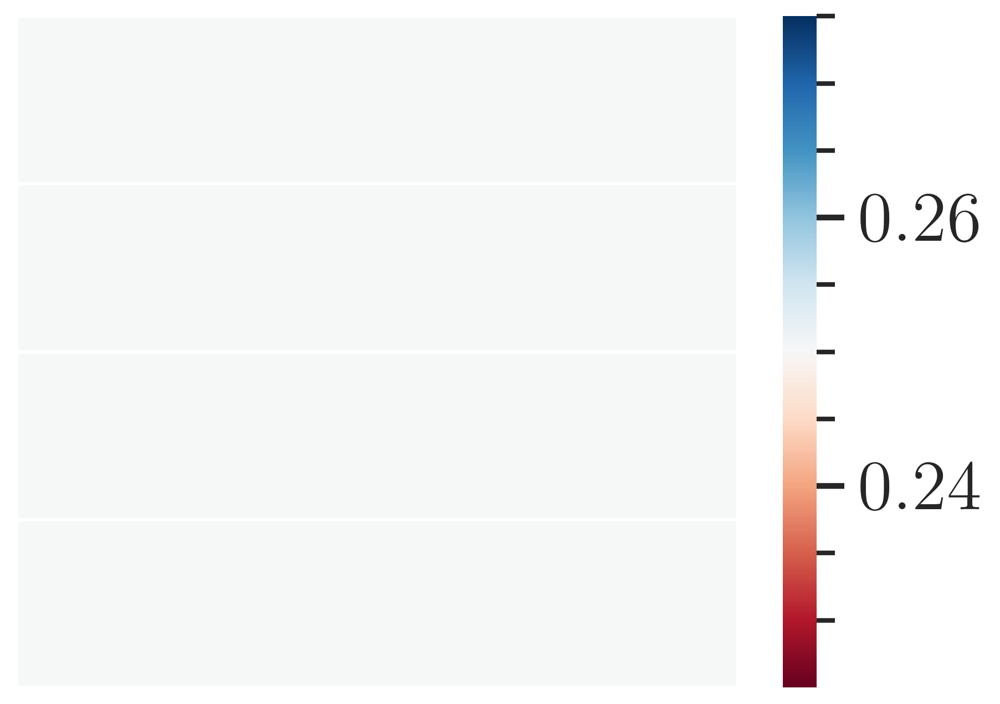

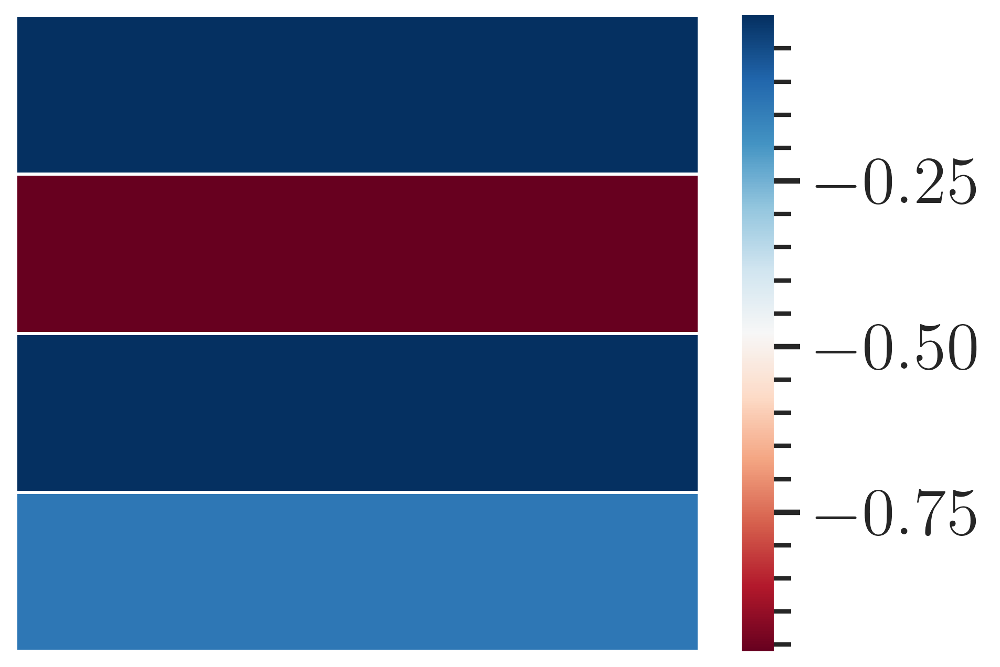

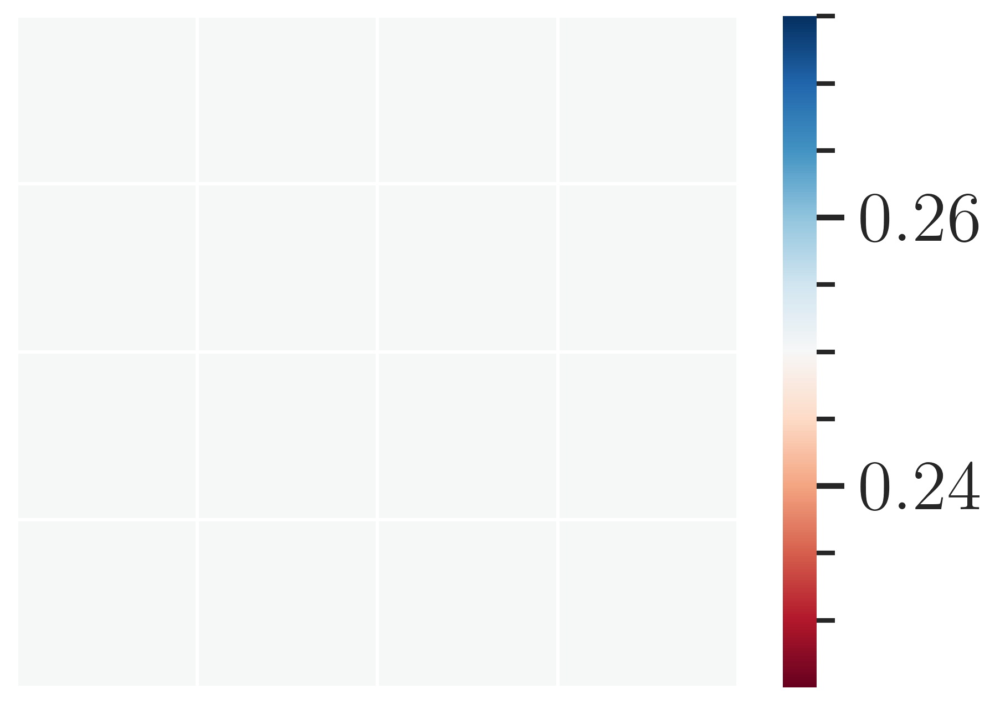

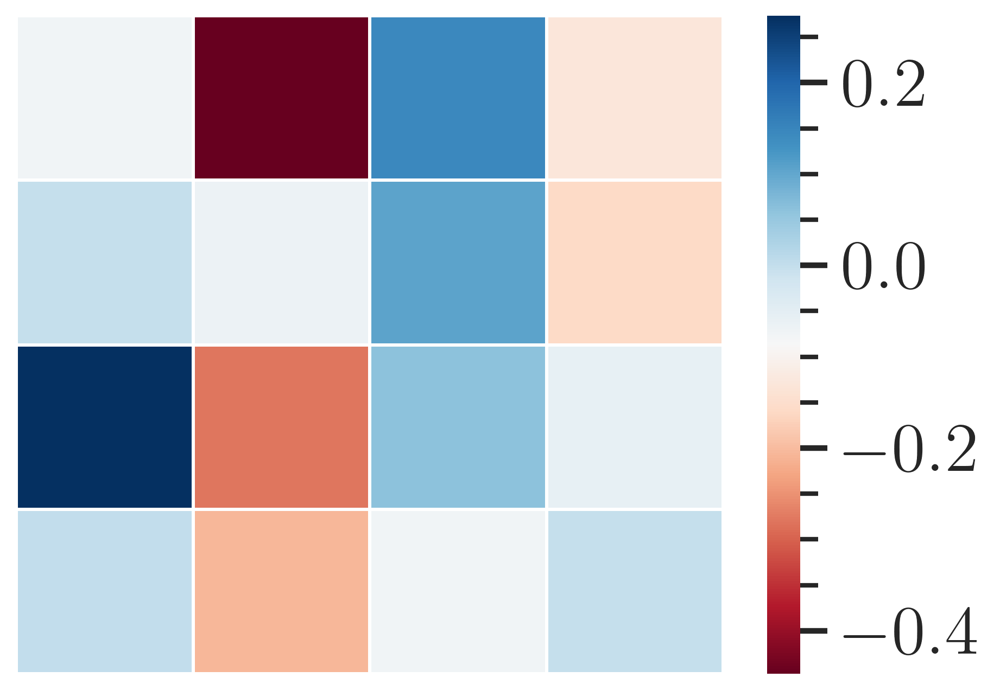

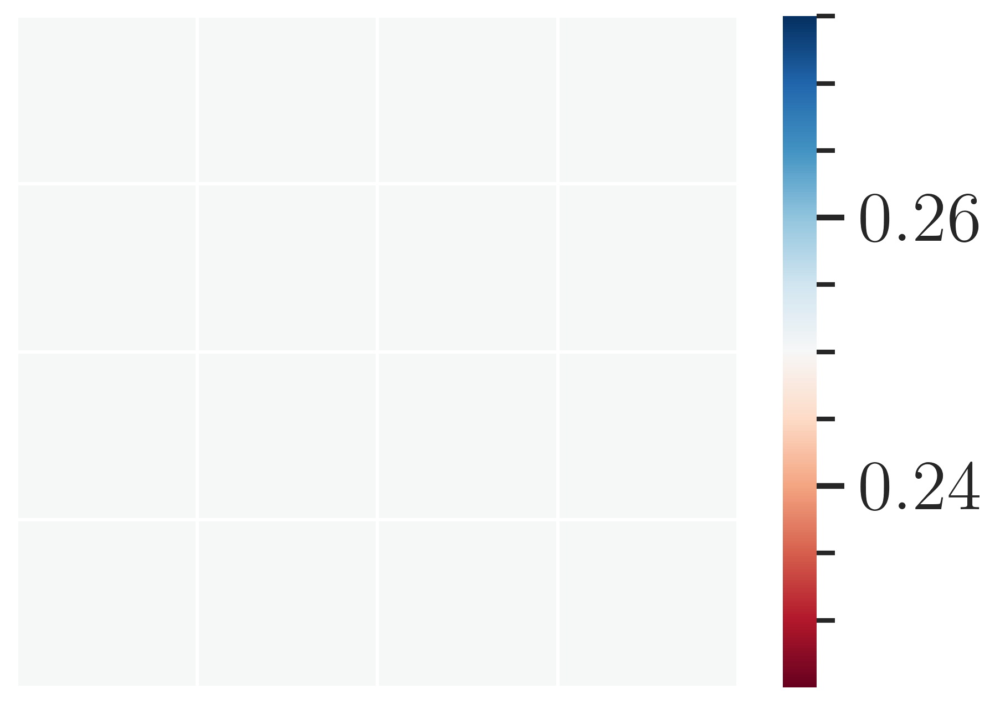

...

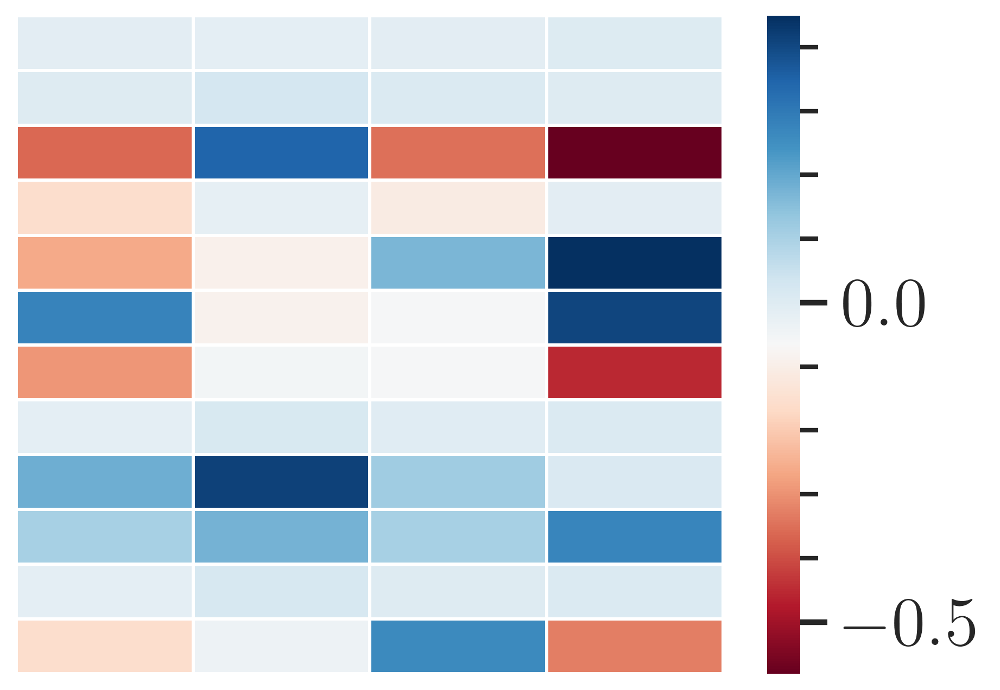

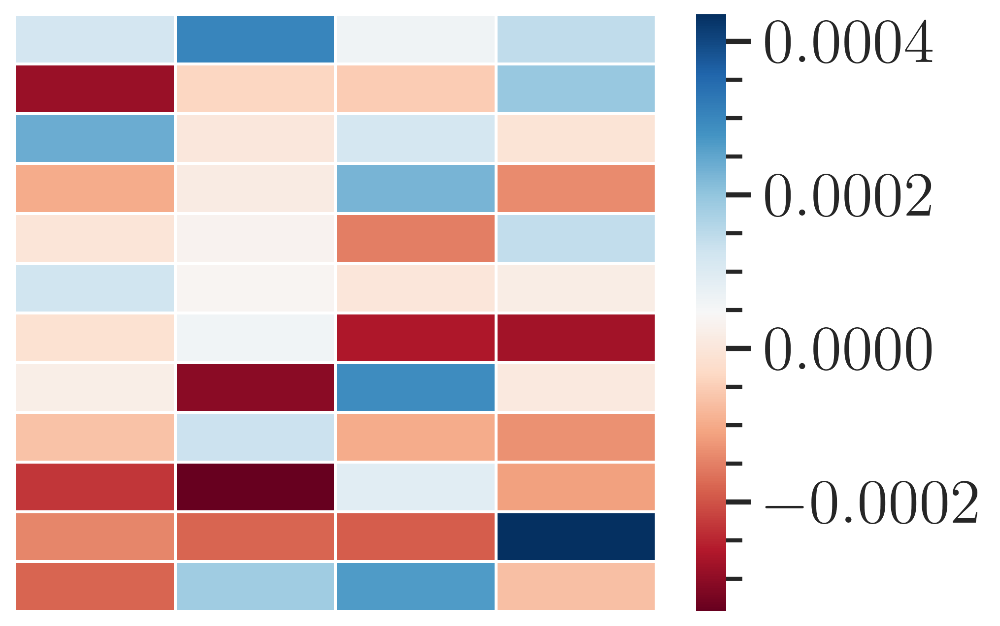

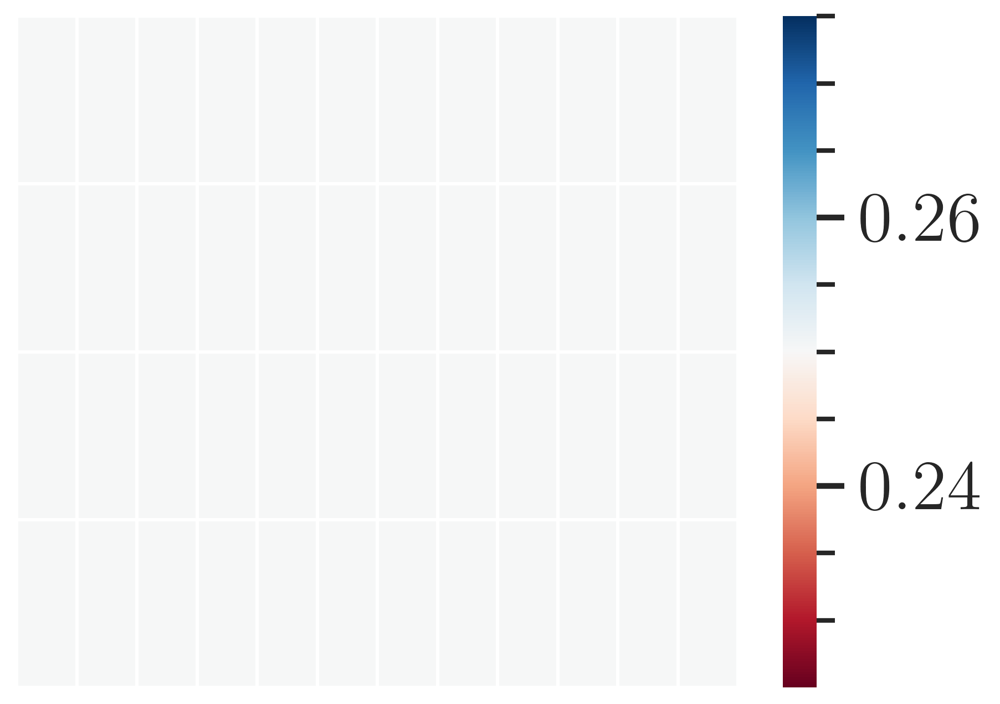

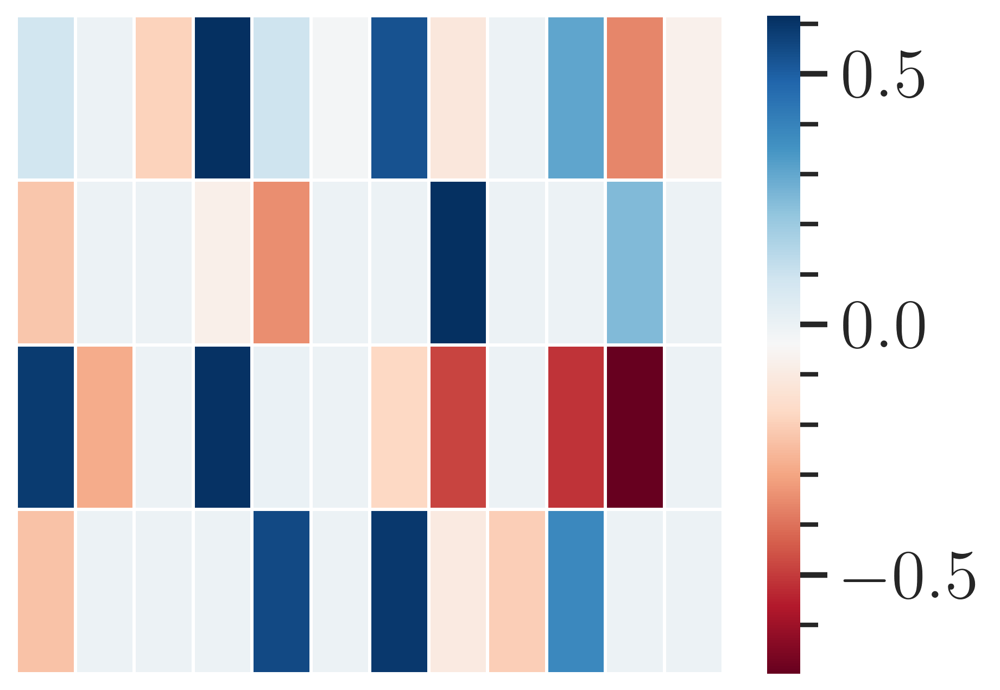

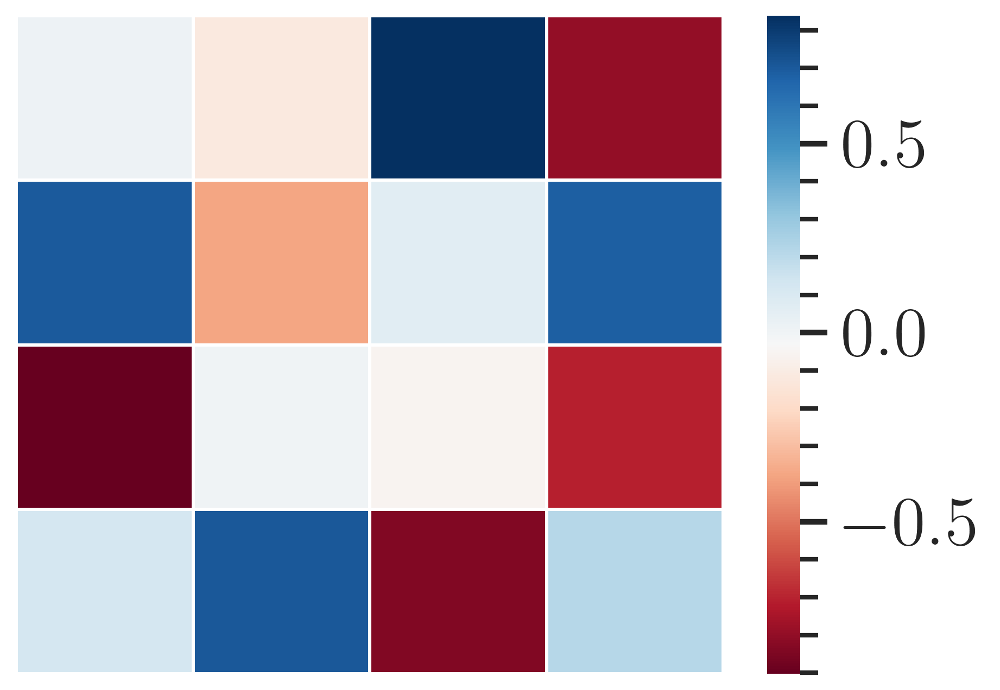

In [82]:
for i, (name,param) in enumerate(exp.net.named_parameters()):
    if 'learnable_param' not in name:
        print(name,param.shape)
for i, (name,param) in enumerate(exp.net.named_parameters()):
    if 'learnable_param' not in name:
            sns.heatmap(param.data.squeeze(dim=-1).cpu().numpy(), cmap ='RdBu', annot=False, fmt="f",
                linewidths=.5, xticklabels = '', yticklabels = '') # vmin=0.1, vmax=-0.1,
            plt.savefig(path + f'./{name}.pdf',dpi=256)
            # plt.savefig(f'./layer{i}+epoch{j}.png',dpi=256)  
            plt.show()

## 4滤波器可视化 , 需要读取模型（已经在训练时保存滤波器的迭代了）

3. 读取数据

reload parameters

~ 先pruning！！！！！！！！~

3. 提取滤波器

## 5信号可视化

4. 设置hook 提取x 

In [26]:
from typing import Dict, Iterable, Callable
from torch import nn, Tensor
class FeatureExtractor(nn.Module):
    def __init__(self, model: nn.Module, layers: Iterable[str]):
        super().__init__()
        self.model = model
        self.layers = layers
        self._features = {layer: torch.empty(0) for layer in layers}

        for layer_id in layers:
            layer = dict([*self.model.named_modules()])[layer_id]
            layer.register_forward_hook(self.save_outputs_hook(layer_id))

    def save_outputs_hook(self, layer_id: str) -> Callable:
        def fn(_, __, output):
            self._features[layer_id] = output
        return fn

    def forward(self, x: Tensor) -> Dict[str, Tensor]:
        _ = self.model(x)
        return self._features

resnet_features = FeatureExtractor(exp.net, layers=["symbolic_transform_layer.0",
                                                    "symbolic_transform_layer.1",
                                                    "symbolic_transform_layer.2",
                                                    ])

In [4]:
exp.net.state_dict

<bound method Module.state_dict of DFN(
  (symbolic_transform_layer): ModuleList(
    (0): neural_symbolc_base(
      (learnable_param): ModuleList(
        (0): wave_filters()
        (1): wave_filters()
        (2): wave_filters()
        (3): wave_filters()
      )
      (filter_op): wave_filters()
      (In): InstanceNorm1d(1, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
      (channel_conv): Conv1d(1, 4, kernel_size=(1,), stride=(1,), bias=False)
      (down_conv): Conv1d(1, 4, kernel_size=(1,), stride=(1,), bias=False)
    )
    (1): neural_symbolc_base(
      (learnable_param): ModuleList(
        (0): wave_filters()
        (1): wave_filters()
        (2): wave_filters()
        (3): wave_filters()
      )
      (filter_op): wave_filters()
      (In): InstanceNorm1d(4, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
      (channel_conv): Conv1d(4, 4, kernel_size=(1,), stride=(1,), bias=False)
      (down_conv): Conv1d(4, 4, kernel_size=(1,

In [7]:
features['symbolic_transform_layer.0'].shape

NameError: name 'features' is not defined

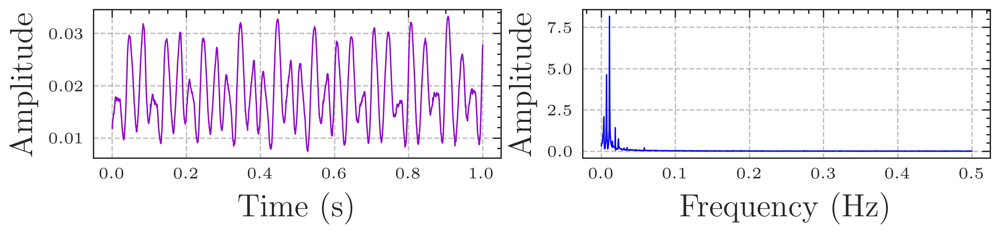

In [16]:
resnet_features = FeatureExtractor(exp.net, layers=["symbolic_transform_layer.0",
                                                    "symbolic_transform_layer.1",
                                                    "symbolic_transform_layer.2",
                                                    ])

with_stick = True
shift = 2
num =21 # 21, 321, 421, 521
x0 = testx[num-1:num].cuda()
features = resnet_features(x0)
features.values()

###### original signal  #######


fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(6, 1))
time_signal = x0.cpu().detach().numpy().squeeze()
length = len(time_signal)
fre_signal = np.fft.fft(time_signal)[:length//2]
fre_signal = np.abs(fre_signal)

t = np.linspace(0, 1, length)
w = np.linspace(0, 0.5, length//2-shift)
axs[0].plot(t,time_signal,linewidth=0.5,color='darkviolet')
axs[1].plot(w,fre_signal[shift:],linewidth=0.5,color='blue') # [:100]
axs[0].grid(True, linestyle='--', linewidth=0.5, color='gray', alpha=0.5)
axs[1].grid(True, linestyle='--', linewidth=0.5, color='gray', alpha=0.5)

axs[0].xaxis.set_tick_params(labelsize=6)
axs[0].yaxis.set_tick_params(labelsize=6)  
axs[1].xaxis.set_tick_params(labelsize=6)
axs[1].yaxis.set_tick_params(labelsize=6)  
      
# plt.savefig(path + f'signal{num}.png', transparent=True,dpi=512)
if with_stick:
    axs[0].set_xlabel('Time (s)',fontsize=12)
    axs[0].set_ylabel('Amplitude',fontsize=12)
    axs[1].set_xlabel('Frequency (Hz)',fontsize=12)
    axs[1].set_ylabel('Amplitude',fontsize=12)

else:
    axs[0].set_xlabel('time (s)',fontsize=12)
    axs[0].set_ylabel('Amplitude',fontsize=12)
    axs[1].set_xlabel('Frequency (Hz)',fontsize=12)
    axs[1].set_ylabel('Amplitude',fontsize=12)
    axs[0].set_xticks([])
    axs[0].set_yticks([]) 
    axs[1].set_xticks([])
    axs[1].set_yticks([])
    
plt.savefig(path + f'signal{num}{with_stick}.pdf', transparent=True,dpi=512)     
plt.show()



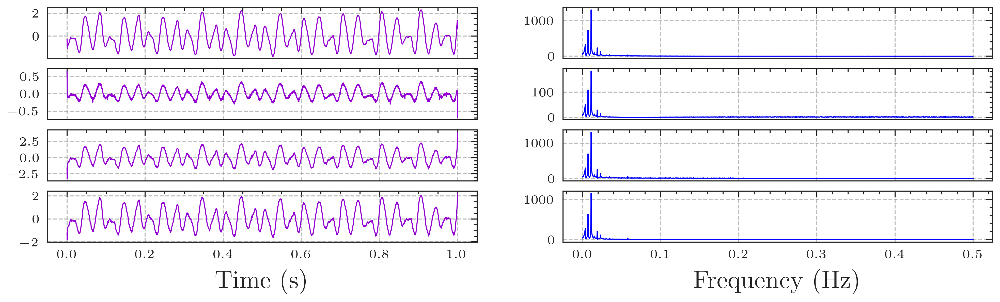

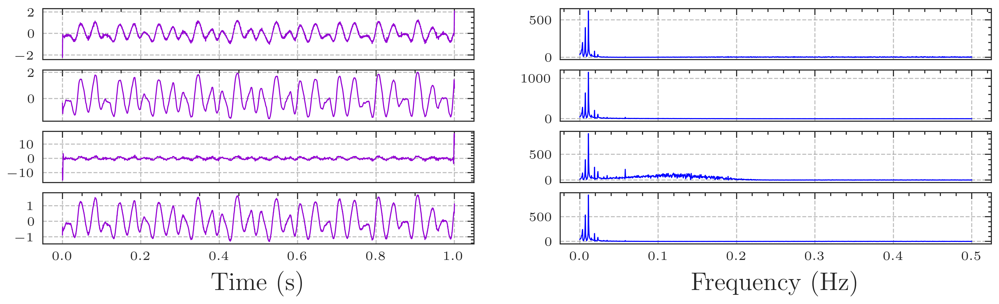

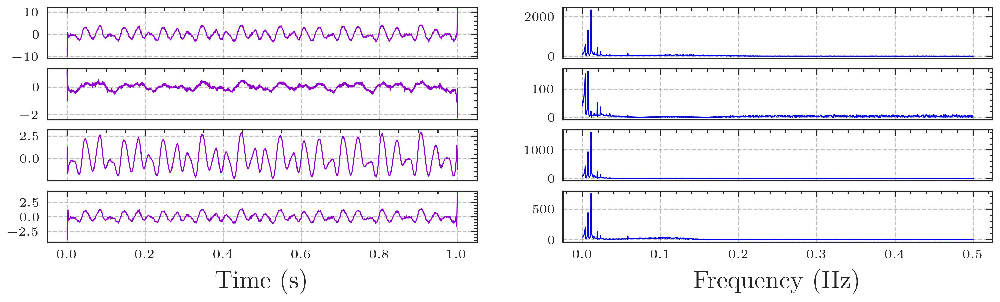

In [27]:


for name, output in features.items():
# for layer in range(layers):
    scales = output.shape[1]    
    fig, axs = plt.subplots(nrows=scales, ncols=2, figsize=(scales*2, 2))
    

    
    for scale in range(scales):
        axs[scale,0].grid(True, linestyle='--', linewidth=0.5, color='gray', alpha=0.5)
        axs[scale,1].grid(True, linestyle='--', linewidth=0.5, color='gray', alpha=0.5)
        axs[scale,0].xaxis.set_tick_params(labelsize=6)
        axs[scale,0].yaxis.set_tick_params(labelsize=6)  
        axs[scale,1].xaxis.set_tick_params(labelsize=6)
        axs[scale,1].yaxis.set_tick_params(labelsize=6)
        
                  
        time_signal = output[0,scale,:].cpu().detach().numpy().squeeze()
        length = len(time_signal)
        fre_signal = np.fft.fft(time_signal)[:length//2]
        fre_signal = np.abs(fre_signal)
        axs[scale,0].plot(t,time_signal,linewidth=0.5,color='darkviolet')
        axs[scale,1].plot(w,fre_signal[shift:],linewidth=0.5,color='blue') # [:100]
        
        if with_stick and scale == scales-1:
            axs[scale,0].set_xlabel('Time (s)',fontsize=12)
            # axs[scale,0].set_ylabel('Amplitude',fontsize=12)
            axs[scale,1].set_xlabel('Frequency (Hz)',fontsize=12)
            # axs[scale,1].set_ylabel('Amplitude',fontsize=12)

        else:
            axs[scale,0].set_xticklabels([], fontsize=12)
            # axs[scale,0].set_yticklabels([], fontsize=12)
            axs[scale,1].set_xticklabels([], fontsize=12)
            # axs[scale,1].set_yticklabels([], fontsize=12)
            # axs[scale,0].set_xlabel('time (s)',fontsize=12)
            # axs[scale,0].set_ylabel('Amplitude',fontsize=12)
            # axs[scale,1].set_xlabel('Frequency (Hz)',fontsize=12)
            # axs[scale,1].set_ylabel('Amplitude',fontsize=12)
            # axs[scale,0].set_xticks([])
            # axs[scale,0].set_yticks([]) 
            # axs[scale,1].set_xticks([])
            # axs[scale,1].set_yticks([])
            
    plt.savefig(path +f'x{name}signal{num}{with_stick}.pdf', transparent=True,dpi=512)
    # plt.savefig(path +f'x{name}signal{num}{with_stick}.svg', transparent=True,dpi=512)     
    plt.show()


冲击成分增益

In [ ]:
resnet_features = FeatureExtractor(exp.net, layers=["symbolic_transform_layer.0",
                                                    "symbolic_transform_layer.1",
                                                    "symbolic_transform_layer.2",
                                                    ])


num =12 # 21, 321, 421, 521
x0 = testx[num-1:num].cuda()
features = resnet_features(x0)
features.values()

for name, output in features.items():
# for layer in range(layers):
        time_signal = output[0,scale,:].cpu().detach().numpy().squeeze()

轨迹

torch.Size([1, 4, 2560])
torch.Size([1, 4, 2560])
torch.Size([1, 4, 2560])


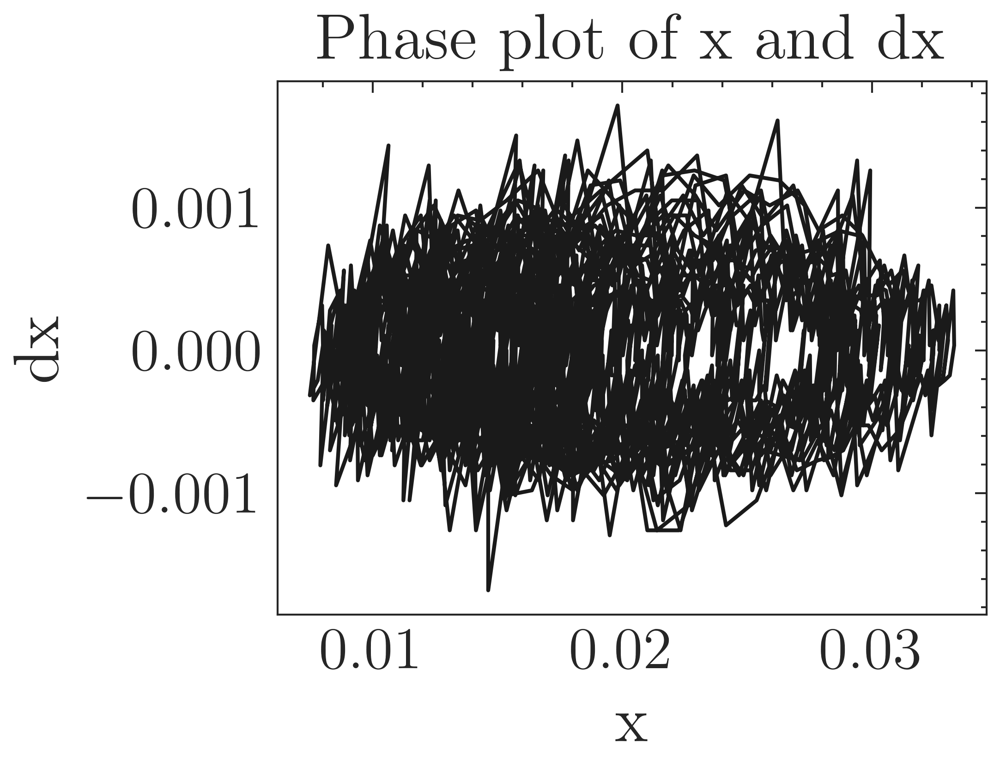

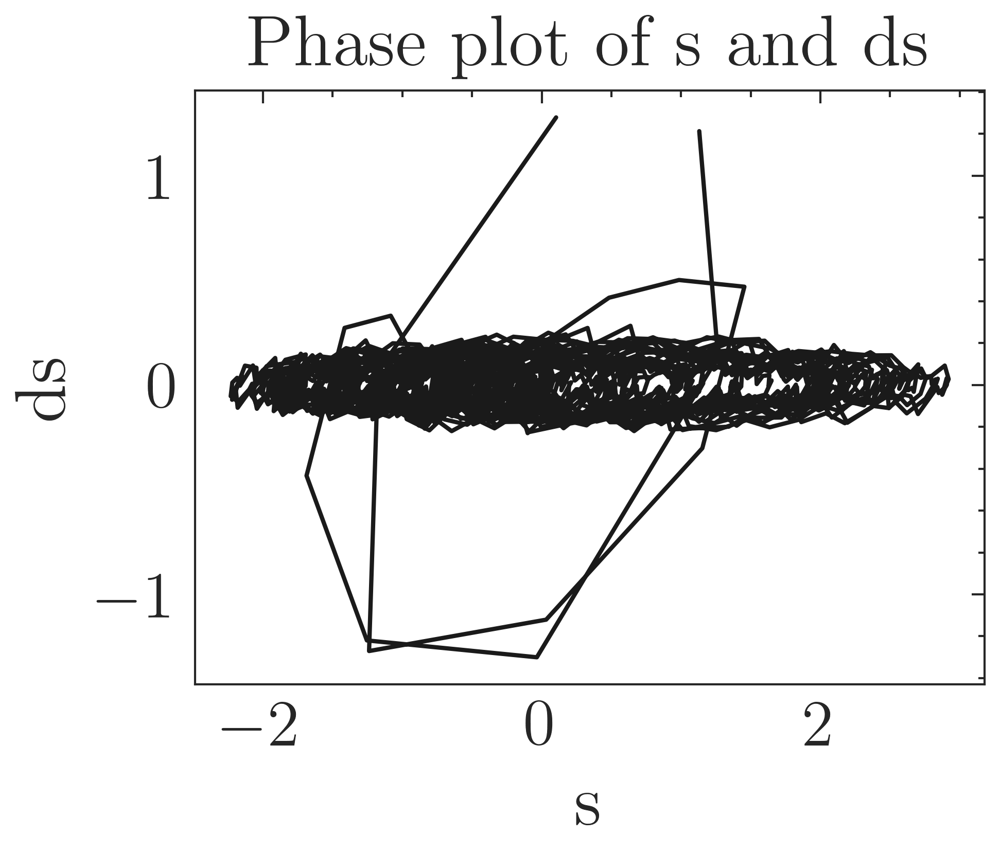

In [43]:
# import numpy as np
# import matplotlib.pyplot as plt

# x = x0.detach().cpu().numpy().squeeze()
# for name, output in features.items():
#     print(output.shape)
#     s =  output
# s = s[0,2,:].detach().cpu().numpy().squeeze()

# # 计算差分
# dx = np.diff(x)
# ds = np.diff(s)

# # 为了保持点数一致，我们可以在差分后的数组前面添加一个元素
# # dx = np.insert(dx, 0, 0)
# # ds = np.insert(ds, 0, 0)

# # 绘制 x 和 dx 的相图
# plt.figure()
# plt.plot(x[1:], dx)
# plt.xlabel('x')
# plt.ylabel('dx')
# plt.title('Phase plot of x and dx')
# plt.show()

# # 绘制 s 和 ds 的相图
# plt.figure()
# plt.plot(s[1:], ds)
# plt.xlabel('s')
# plt.ylabel('ds')
# plt.title('Phase plot of s and ds')
# plt.show()

In [36]:
features['symbolic_transform_layer.0'].shape

torch.Size([1, 12, 2560])

In [46]:
weight = state_dict['symbolic_transform_layer.1.channel_conv.weight']
maxvalue = torch.max(weight)


In [138]:
# for k, v in state_dict.items():
#     print(k)
#     print(v.shape)
#     print('###################')


symbolic_transform_layer.0.channel_conv.weight_orig
torch.Size([48, 1, 1])
###################
symbolic_transform_layer.0.channel_conv.weight_mask
torch.Size([48, 1, 1])
###################
symbolic_transform_layer.0.down_conv.weight_orig
torch.Size([48, 1, 1])
###################
symbolic_transform_layer.0.down_conv.weight_mask
torch.Size([48, 1, 1])
###################
symbolic_transform_layer.1.channel_conv.weight_orig
torch.Size([48, 48, 1])
###################
symbolic_transform_layer.1.channel_conv.weight_mask
torch.Size([48, 48, 1])
###################
symbolic_transform_layer.1.down_conv.weight_orig
torch.Size([48, 48, 1])
###################
symbolic_transform_layer.1.down_conv.weight_mask
torch.Size([48, 48, 1])
###################
symbolic_transform_layer.2.channel_conv.weight_orig
torch.Size([48, 48, 1])
###################
symbolic_transform_layer.2.channel_conv.weight_mask
torch.Size([48, 48, 1])
###################
symbolic_transform_layer.2.down_conv.weight_orig
torch.S

In [116]:
import os
os.getcwd()

'/home/richie_thu/_Richie_project/Deep symbolic net/rul prediction/save_dir'

## 6 特征可视化

In [84]:
exp.net

DFN(
  (symbolic_transform_layer): ModuleList(
    (0): neural_symbolc_base(
      (learnable_param): ModuleList(
        (0): wave_filters()
        (1): wave_filters()
        (2): wave_filters()
        (3): wave_filters()
      )
      (filter_op): wave_filters()
      (In): InstanceNorm1d(1, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
      (channel_conv): Conv1d(1, 4, kernel_size=(1,), stride=(1,), bias=False)
      (down_conv): Conv1d(1, 4, kernel_size=(1,), stride=(1,), bias=False)
    )
    (1): neural_symbolc_base(
      (learnable_param): ModuleList(
        (0): wave_filters()
        (1): wave_filters()
        (2): wave_filters()
        (3): wave_filters()
      )
      (filter_op): wave_filters()
      (In): InstanceNorm1d(4, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
      (channel_conv): Conv1d(4, 4, kernel_size=(1,), stride=(1,), bias=False)
      (down_conv): Conv1d(4, 4, kernel_size=(1,), stride=(1,), bias=False)
    )
 

In [85]:
a_x = exp.net(testx.cuda())
features = exp.net.feature
# T-SNE 四個模型的特徵T-SNE
np.save('feature.npy',features.cpu().detach().numpy(),allow_pickle=True)


## 7 特徵聯合分佈+ 邊緣核密度估计

In [64]:
feature = np.load('feature.npy',allow_pickle=True)
ELM_feature = np.load('6_feature/dong.npy',allow_pickle=True)
WKN_feature = np.load('6_feature/wkn.npy',allow_pickle=True)
Resnet_feature = np.load('6_feature/res.npy',allow_pickle=True)
MWA_CNN_feature = np.load('6_feature/huan.npy',allow_pickle=True)

In [65]:
num = feature.shape[0]

AFN_feature = feature.reshape(num,-1)
ELM_feature = ELM_feature.reshape(num,-1)
WKN_feature = WKN_feature.reshape(num,-1)
Resnet_feature = Resnet_feature.reshape(num,-1)
MWA_CNN_feature = MWA_CNN_feature.reshape(num,-1)



In [88]:
sample_stick = np.linspace(1, num, num)



### afn 联合谱

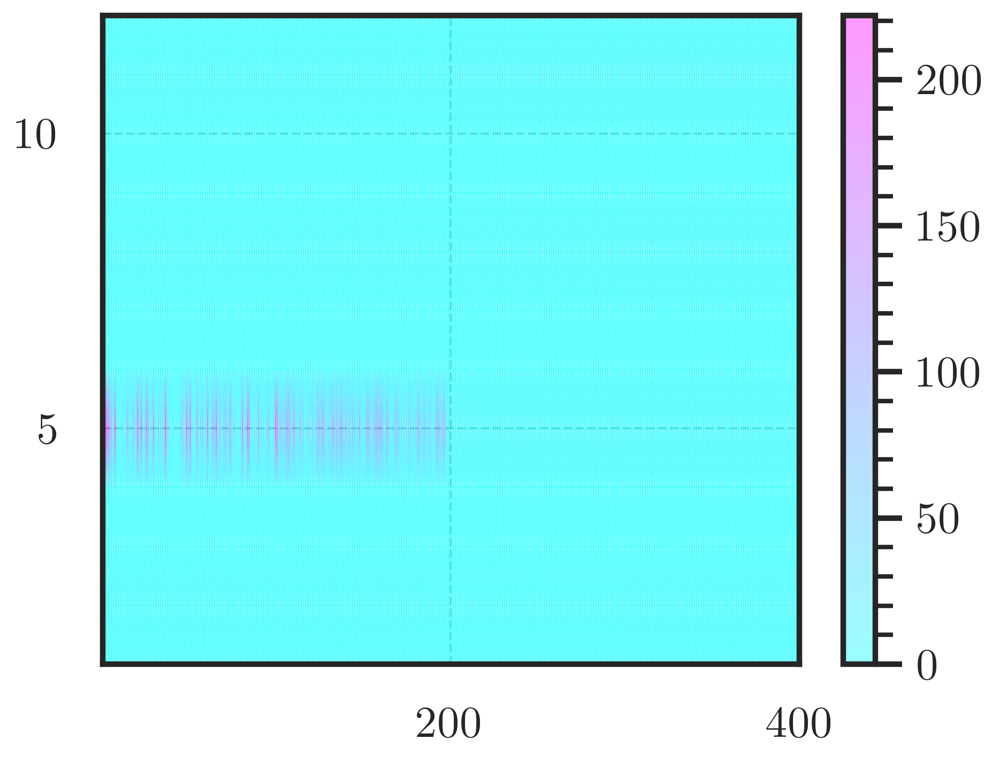

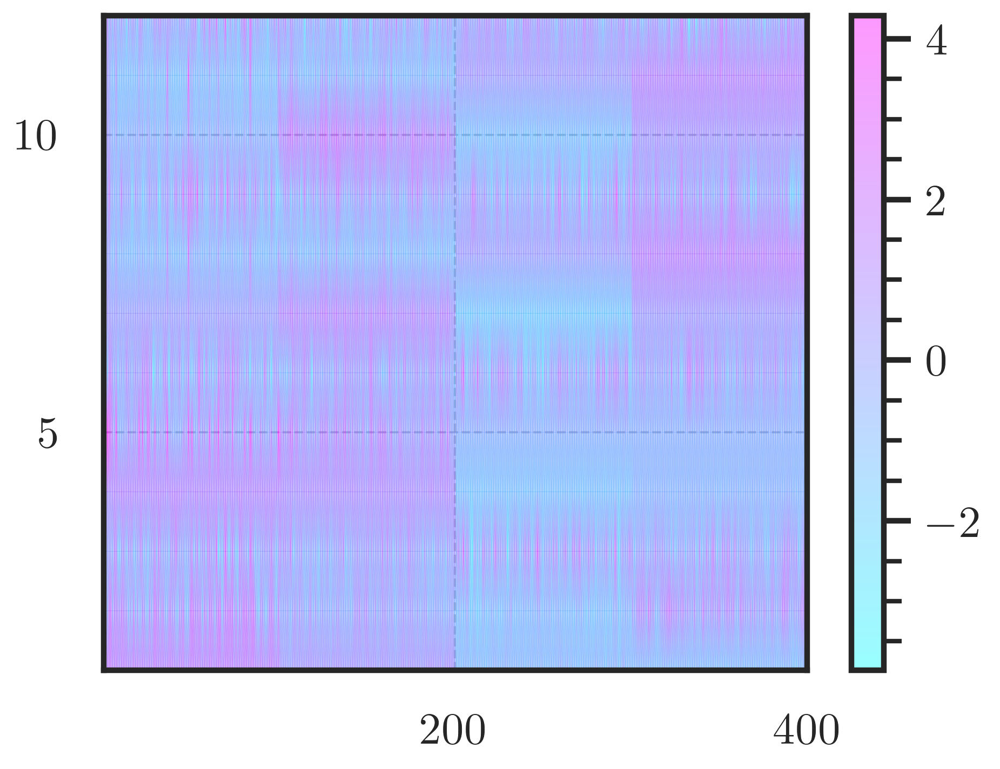

In [69]:
feature_num = AFN_feature.shape[1]
sample_stick = np.arange(1, num+1, 1)
feature_stick = np.arange(1, feature_num+1, 1) 
sample_stick

plt.pcolormesh(sample_stick, feature_stick, AFN_feature.T,alpha = 0.4, shading='gouraud',cmap = 'cool')
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.colorbar().ax.tick_params(labelsize=10)
plt.grid(True, linestyle='--', linewidth=0.5, color='gray', alpha=0.5)
plt.savefig(path + f'feature_before_norm.pdf', transparent=True,dpi=512)
plt.show()

norm_feature = (AFN_feature-np.mean(AFN_feature,axis=0,keepdims= True))/np.std(AFN_feature,axis=0,keepdims= True)
plt.pcolormesh(sample_stick, feature_stick, norm_feature.T,alpha = 0.4, shading='gouraud',cmap = 'cool')
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.colorbar().ax.tick_params(labelsize=10)
plt.grid(True, linestyle='--', linewidth=0.5, color='gray', alpha=0.5)
plt.savefig(path + f'AFN_feature_after_norm.pdf', transparent=True,dpi=512)
plt.show()




sample_margin

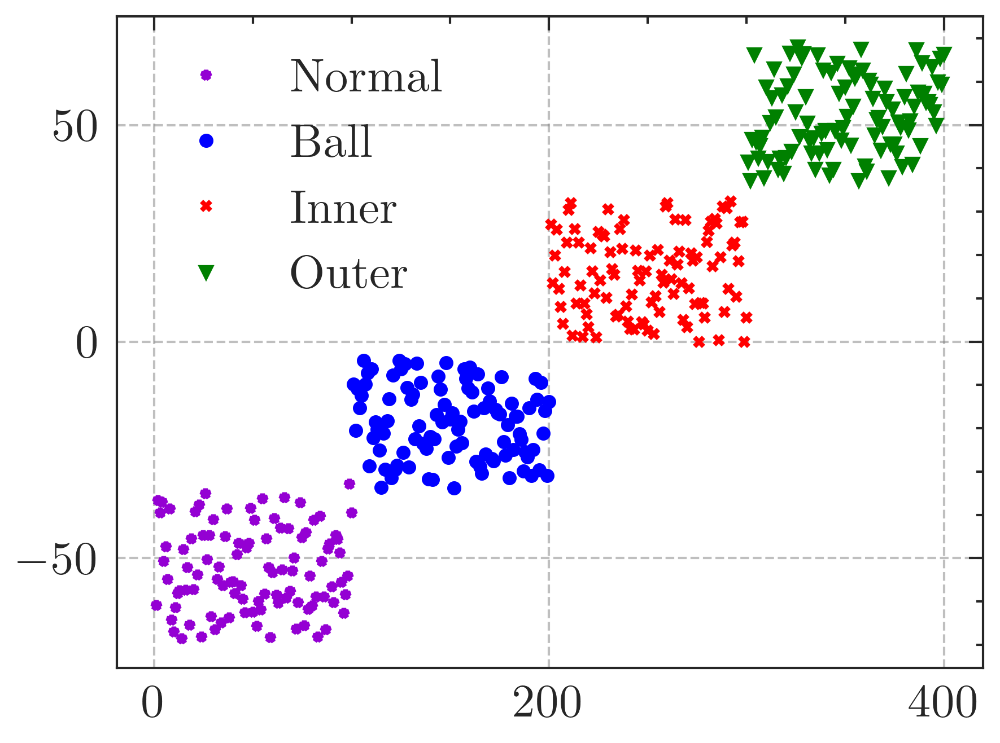

In [76]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
# 对数据进行 t-SNE 降维
tsne = TSNE(n_components=1, random_state=0,perplexity=10)
tsne_feature = tsne.fit_transform(norm_feature)

# 绘制散点图
x = np.arange(1, num+1, 1)
plt.plot(x[:100],tsne_feature[:100, 0], markers[0], markersize=2,color = 'darkviolet',label = 'Normal')
plt.plot(x[100:200],tsne_feature[100:200, 0], markers[1], markersize=2,color = 'blue',label = 'Ball')
plt.plot(x[200:300],tsne_feature[200:300, 0], markers[2], markersize=2,color = 'red',label = 'Inner')
plt.plot(x[300:],tsne_feature[300:, 0], markers[3], markersize=2,color = 'green',label = 'Outer')
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.grid(True, linestyle='--', linewidth=0.5, color='gray', alpha=0.5)
plt.legend(fontsize=10)
plt.savefig(path + f'AFN_feature_tsne.pdf', transparent=True,dpi=512)
# 显示图像
plt.show()

# 创建包含四个子图的图像
# fig, axs = plt.subplots(4, 1, figsize=(16, 12))

# 在每个子图中绘制一个 Violin plot
# sns.violinplot(data=norm_feature[:100], ax=axs[0])
# # axs[0].grid(True, linestyle='--', linewidth=0.5, color='gray', alpha=0.5)
# sns.violinplot(data=norm_feature[100:200], ax=axs[1])
# # axs[1].grid(True, linestyle='--', linewidth=0.5, color='gray', alpha=0.5)
# sns.violinplot(data=norm_feature[200:300], ax=axs[2])
# # axs[2].grid(True, linestyle='--', linewidth=0.5, color='gray', alpha=0.5)
# sns.violinplot(data=norm_feature[300:], ax=axs[3])
# # axs[3].grid(True, linestyle='--', linewidth=0.5, color='gray', alpha=0.5)



计算CC

In [79]:


ton_list = signal_extractor(torch.tensor(tsne_feature))
print(f'## original_CC{calculate_differences(ton_list,correlation_coefficient)}')


## original_CC(array([ 0.08509041,  0.08997691, -0.01228222,  0.17042951, -0.10623816,
        0.01974154], dtype=float32), 0.04111966)


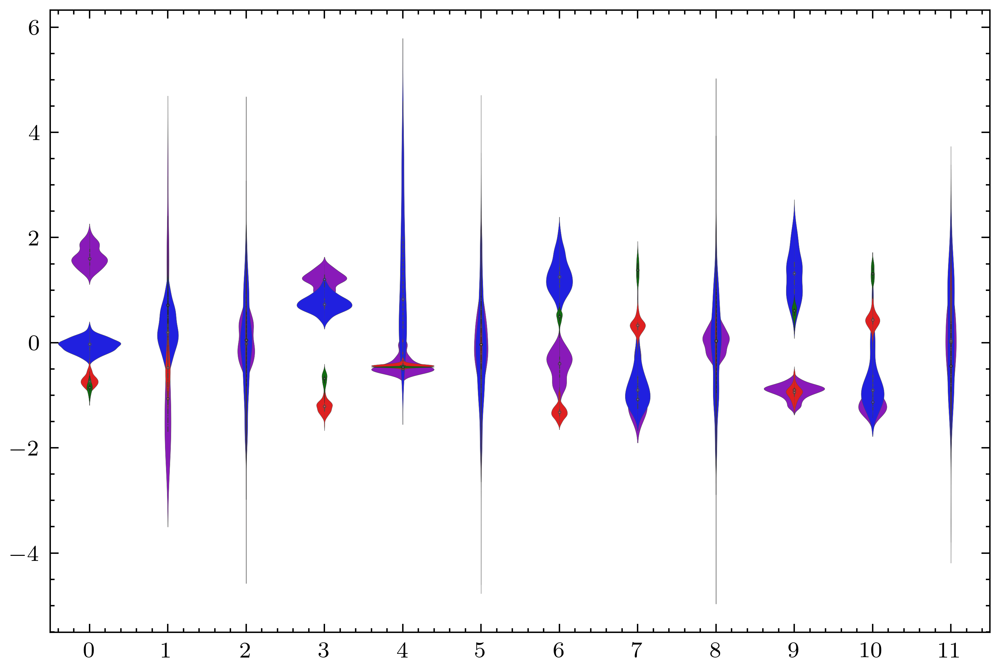

In [25]:
fig, axs = plt.subplots(1, 1, figsize=(6, 4))
sns.violinplot(data=norm_feature[:100], color='darkviolet', label='Normal', linewidth=0.1,alpha = 0.5)
sns.violinplot(data=norm_feature[100:200], color='blue', label='Ball', linewidth=0.1,alpha = 0.5)
sns.violinplot(data=norm_feature[200:300], color='red', label='Inner', linewidth=0.1,alpha = 0.5)
sns.violinplot(data=norm_feature[300:], color='green', label='Outer', linewidth=0.1,alpha = 0.5)
plt.savefig(path + f'AFN_feature_violin.pdf', transparent=True,dpi=512)
artists, labels = axs.get_legend_handles_labels()
plt.legend(artists, labels, fontsize=10)
# 显示图像
plt.show()

### selection feature

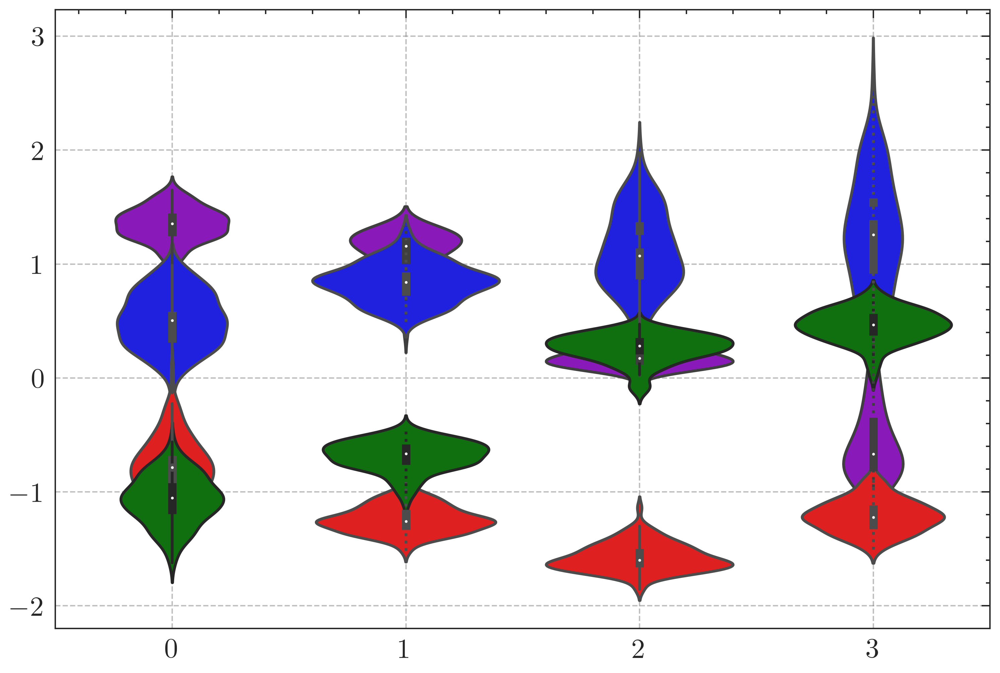

In [112]:
fig, axs = plt.subplots(1, 1, figsize=(6, 4))
selected_feature = norm_feature[:,[0,3,6,9]]
sns.violinplot(data=selected_feature[:100], color='darkviolet', label='Normal', linewidth=1,alpha = 0.5)
sns.violinplot(data=selected_feature[100:200], color='blue', label='Ball', linewidth=1,alpha = 0.5)
sns.violinplot(data=selected_feature[200:300], color='red', label='Inner', linewidth=1,alpha = 0.5)
sns.violinplot(data=selected_feature[300:], color='green', label='Outer', linewidth=1,alpha = 0.5)

plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.grid(True, linestyle='--', linewidth=0.5, color='gray', alpha=0.5)
plt.savefig(path + f'AFN_feature_violin_4.pdf', transparent=True,dpi=512)
artists, labels = axs.get_legend_handles_labels()
plt.legend(artists, labels, fontsize=10)
# 显示图像
plt.show()

[0 1 2 3]


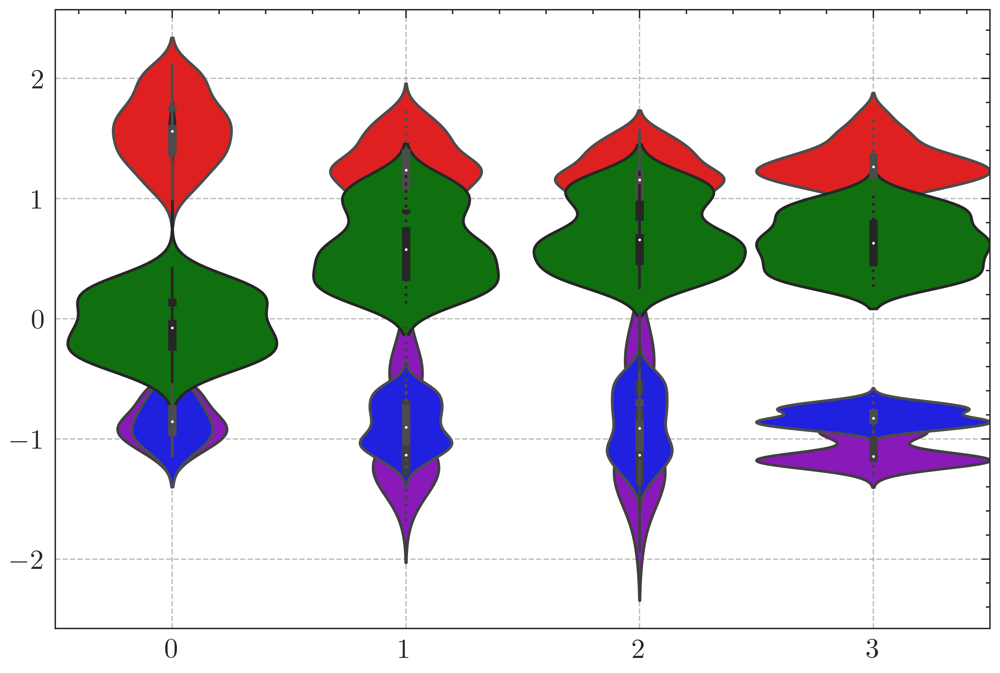

[479 120  67  21]


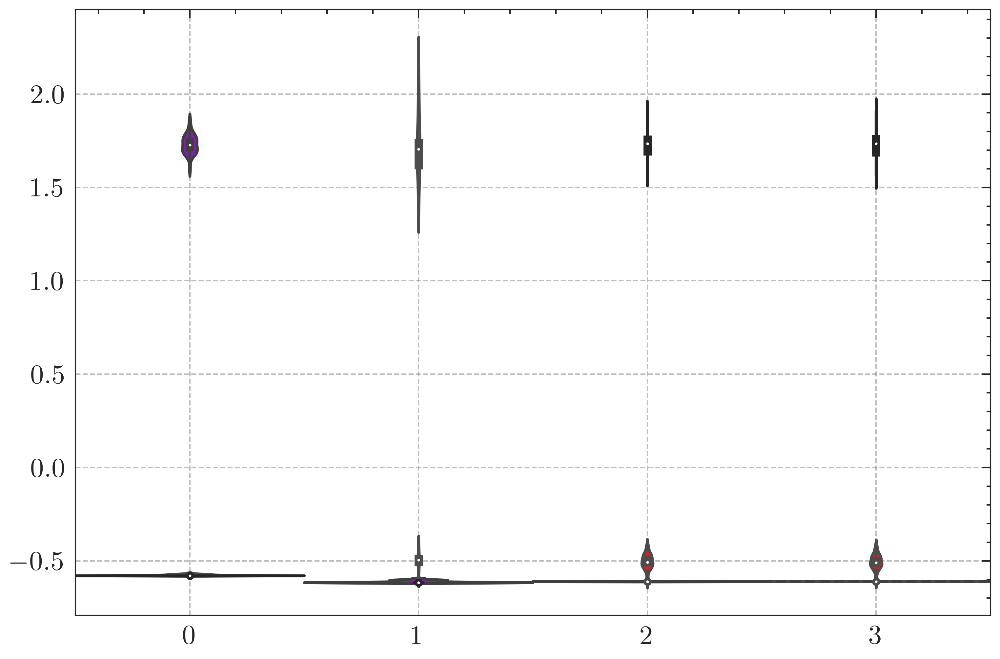

[153 156 316 334]


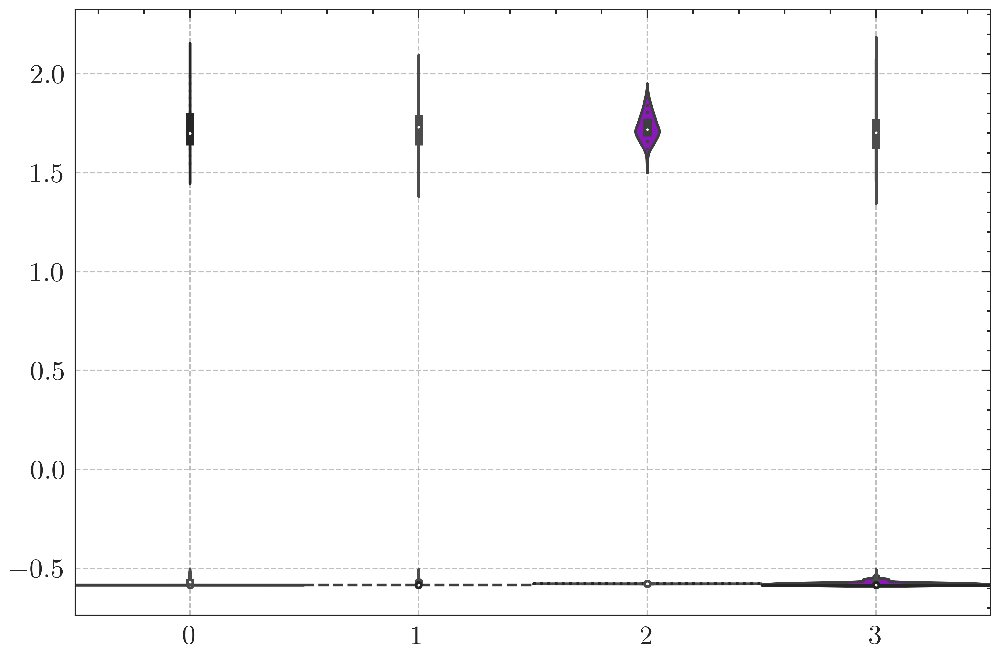

[75 30 45 94]


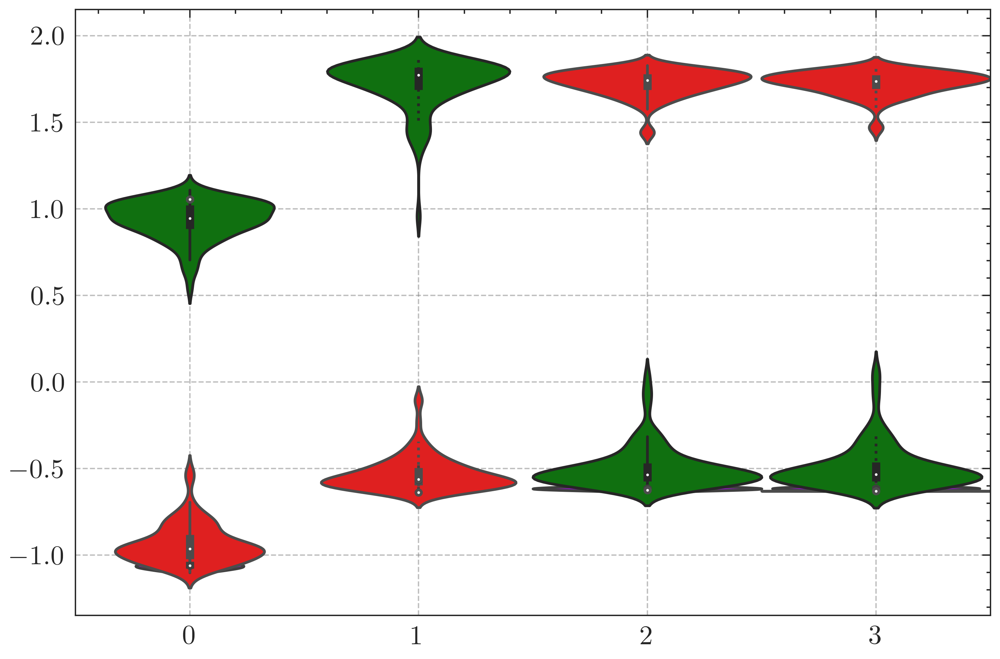

In [114]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE


# AFN_feature = feature.reshape(num,-1)
# ELM_feature = ELM_feature.reshape(num,-1)
# WKN_feature = WKN_feature.reshape(num,-1)
# Resnet_feature = Resnet_feature.reshape(num,-1)
# MWA_CNN_feature = MWA_CNN_feature.reshape(num,-1)

def plot_feature(feature, save_name):
    
    # 联合

    feature_num = feature.shape[1]
    sample_stick = np.arange(1, num+1, 1)
    feature_stick = np.arange(1, feature_num+1, 1) 
    sample_stick

    # plt.pcolormesh(sample_stick, feature_stick, feature.T,alpha = 0.4, shading='gouraud',cmap = 'cool')
    # plt.xticks(fontsize=10)
    # plt.yticks(fontsize=10)
    # plt.colorbar().ax.tick_params(labelsize=10)
    # plt.grid(True, linestyle='--', linewidth=0.5, color='gray', alpha=0.5)
    # # plt.savefig(save_name + f'_before_norm.pdf', transparent=True,dpi=512)
    # plt.savefig(save_name + f'_before_norm.pdf', transparent=True,dpi=128)
    # # plt.savefig(save_name + f'_before_norm.eps', transparent=True,dpi=512)
    # plt.show()

    # norm_feature = (feature-np.mean(feature,axis=0,keepdims= True))/np.std(feature,axis=0,keepdims= True)
    # plt.pcolormesh(sample_stick, feature_stick, norm_feature.T,alpha = 0.4, shading='gouraud',cmap = 'cool')
    # plt.xticks(fontsize=10)
    # plt.yticks(fontsize=10)
    # plt.colorbar().ax.tick_params(labelsize=10)
    # plt.grid(True, linestyle='--', linewidth=0.5, color='gray', alpha=0.5)
    # plt.savefig(save_name + f'_after_norm.pdf', transparent=True,dpi=512)
    # plt.show()
    # # 对数据进行 t-SNE 降维
    
    
    # tsne = TSNE(n_components=1, random_state=0)
    # tsne_feature = tsne.fit_transform(feature)

    # # 绘制散点图
    # x = np.arange(1, num+1, 1)
    # plt.plot(x[:100],tsne_feature[:100, 0], markers[0], markersize=2,color = 'darkviolet',label = 'Normal')
    # plt.plot(x[100:200],tsne_feature[100:200, 0], markers[1], markersize=2,color = 'blue',label = 'Ball')
    # plt.plot(x[200:300],tsne_feature[200:300, 0], markers[2], markersize=2,color = 'red',label = 'Inner')
    # plt.plot(x[300:],tsne_feature[300:, 0], markers[3], markersize=2,color = 'green',label = 'Outer')
    # plt.xticks(fontsize=10)
    # plt.yticks(fontsize=10)
    # plt.grid(True, linestyle='--', linewidth=0.5, color='gray', alpha=0.5)
    # plt.legend(fontsize=10)
    # plt.savefig(save_name + f'_tsne.pdf', transparent=True,dpi=512)
    # # 显示图像
    # plt.show()    
    # # violin plot
    
    
    fig, axs = plt.subplots(1, 1, figsize=(6, 4))
    
    if 'WKN' or 'Resnet' or 'MWA' in save_name:
        # 选择方差最大的 topk 列
        k = 4
        variances = np.var(feature, axis=0).reshape(-1)
        sorted_indices = np.argsort(variances)[::-1]
        topk_indices = sorted_indices[:k]
        print(topk_indices)
        norm_feature = feature[:, topk_indices]
        
    norm_feature = (norm_feature-np.mean(norm_feature,axis=0,keepdims= True))/np.std(norm_feature,axis=0,keepdims= True)
    
    sns.violinplot(data=norm_feature[:100], color='darkviolet', label='Normal', linewidth=1,alpha = 0.1, edgecolor='darkviolet',width=1)
    sns.violinplot(data=norm_feature[100:200], color='blue', label='Ball', linewidth=1,alpha = 0.1, edgecolor='blue',width=1)
    sns.violinplot(data=norm_feature[200:300], color='red', label='Inner', linewidth=1,alpha = 0.1, edgecolor='red',width=1)
    sns.violinplot(data=norm_feature[300:], color='green', label='Outer', linewidth=1,alpha = 0.1, edgecolor='green',width=1)

    artists, labels = axs.get_legend_handles_labels()
    
    plt.xticks(fontsize=10)
    plt.yticks(fontsize=10)
    plt.grid(True, linestyle='--', linewidth=0.5, color='gray', alpha=0.5)
    
    plt.legend(artists, labels, fontsize=10)
    # 显示图像  
    plt.savefig(save_name + '_violin.pdf', transparent=True, dpi=512)
    plt.show()
plot_feature(ELM_feature, path + 'ELM_feature')
plot_feature(WKN_feature, path + 'WKN_feature7')
plot_feature(Resnet_feature, path + 'Resnet_feature7')
plot_feature(MWA_CNN_feature, path + 'MWA_CNN_feature7')

In [80]:


elm_list = signal_extractor(torch.tensor(ELM_feature))
print(f'## elm_CC{calculate_differences(elm_list,correlation_coefficient)}')

wkn_list = signal_extractor(torch.tensor(WKN_feature))
print(f'## WKN_CC{calculate_differences(ton_list,correlation_coefficient)}')

res_list = signal_extractor(torch.tensor(Resnet_feature))
print(f'## res_CC{calculate_differences(res_list,correlation_coefficient)}')

mwa_list = signal_extractor(torch.tensor(MWA_CNN_feature))
print(f'## mwa_CC{calculate_differences(mwa_list,correlation_coefficient)}')
    


mwa_list = signal_extractor(torch.tensor(MWA_CNN_feature))
print(f'## mwa_CC{calculate_differences(mwa_list,correlation_coefficient)}')
print(f'## feature_CC{calculate_differences(huan_feature_list,correlation_coefficient)}')


## elm_CC(array([0.9047374 , 0.9532418 , 0.937905  , 0.9362442 , 0.92651266,
       0.97865844], dtype=float32), 0.9395499)
## WKN_CC(array([ 0.08509041,  0.08997691, -0.01228222,  0.17042951, -0.10623816,
        0.01974154], dtype=float32), 0.04111966)
## res_CC(array([ 0.00138523, -0.0019932 , -0.00203461,  0.01296295, -0.00200916,
        0.007884  ], dtype=float32), 0.0026992012)
## mwa_CC(array([0.01621767, 0.2238455 , 0.02443381, 0.01968304, 0.38087955,
       0.07200848], dtype=float32), 0.12284467)


 top 12 的 kde

0


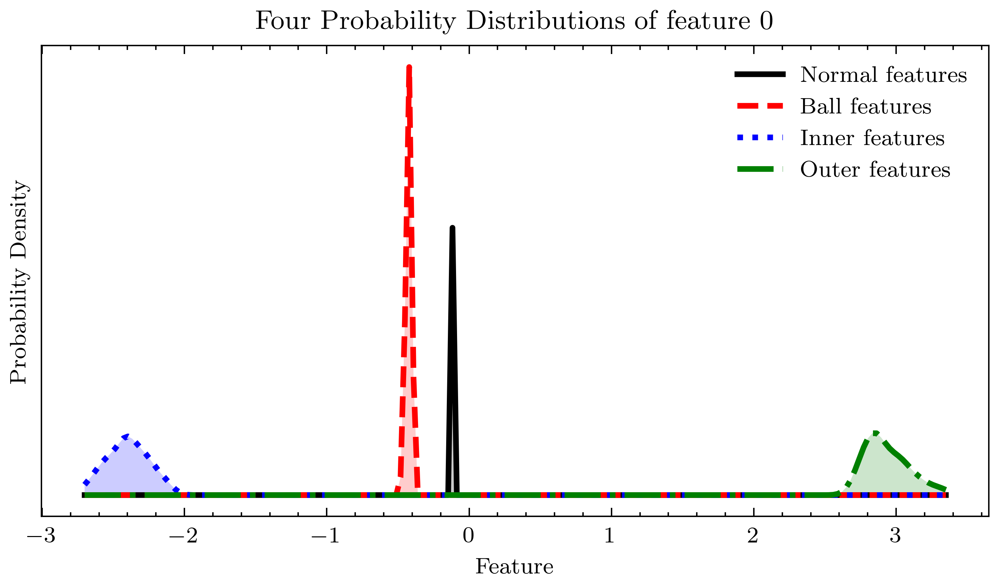

1


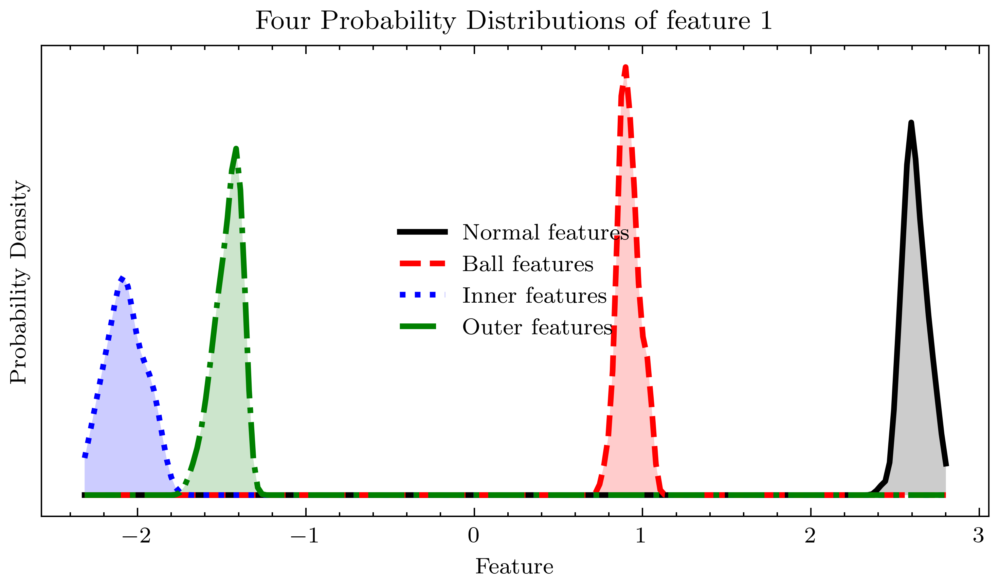

2


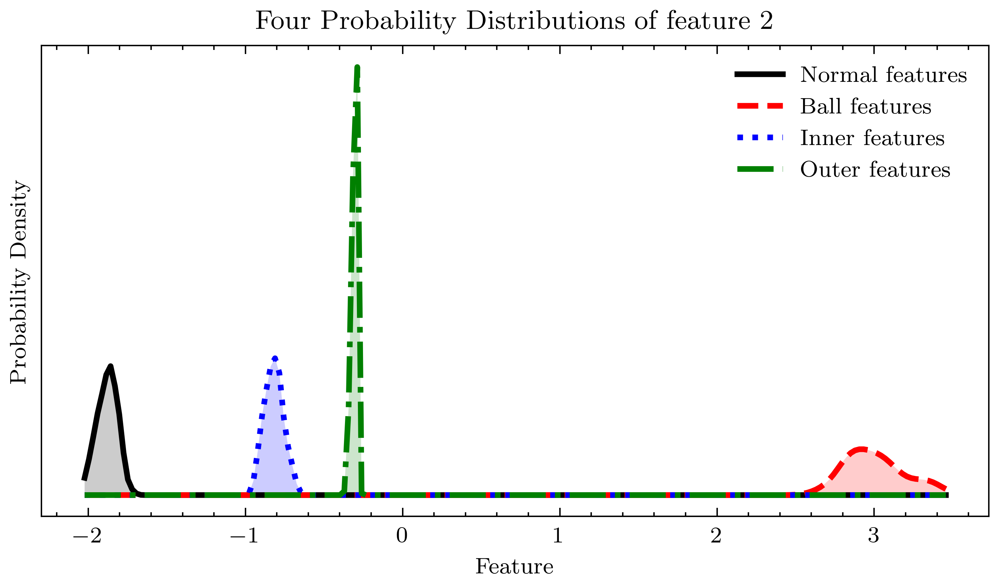

3


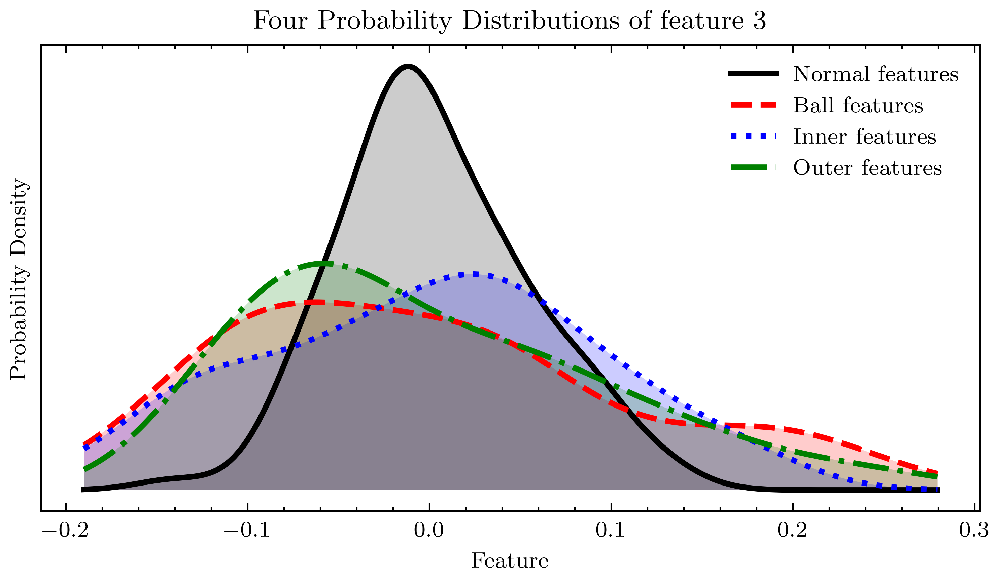

4


IndexError: index 4 is out of bounds for axis 1 with size 4

In [83]:
from scipy.stats import gaussian_kde
from sklearn.decomposition import PCA



pca = PCA(n_components=4)
feature = pca.fit_transform(Resnet_feature)


# feature = AFN_feature

normal_features = feature[:100]
ball_features = feature[100:200]
inner_features = feature[200:300]
outer_features = feature[300:400]






for i in range(feature_num):
# 计算四组数据的核密度估计
    print(i)
    kde1 = gaussian_kde(normal_features[:,i])
    kde2 = gaussian_kde(ball_features[:,i])
    kde3 = gaussian_kde(inner_features[:,i])
    kde4 = gaussian_kde(outer_features[:,i])

    # 生成横坐标
    xmin = min(normal_features[:,i].min(), ball_features[:,i].min(), inner_features[:,i].min(), outer_features[:,i].min())
    xmax = max(normal_features[:,i].max(), ball_features[:,i].max(), inner_features[:,i].max(), outer_features[:,i].max())
    
    x = np.linspace(xmin, xmax, 200)

    # 画图
    plt.figure(figsize=(6, 3))
    plt.plot(x, kde1(x), label='Normal features', linewidth=2)
    plt.plot(x, kde2(x), label='Ball features', linewidth=2)
    plt.plot(x, kde3(x), label='Inner features', linewidth=2)
    plt.plot(x, kde4(x), label='Outer features', linewidth=2)
    plt.legend()
    plt.title(f'Four Probability Distributions of feature {i}')
    plt.xlabel('Feature')
    plt.ylabel('Probability Density')
    
    # plt.xticks([])
    plt.yticks([]) 

    plt.fill_between(x, kde1(x), alpha=0.2)
    plt.fill_between(x, kde2(x), alpha=0.2)
    plt.fill_between(x, kde3(x), alpha=0.2)
    plt.fill_between(x, kde4(x), alpha=0.2)
    # plt.savefig(f'feature{i}.png', transparent=True,dpi=512)
    # plt.savefig(f'feature{i}.svg', transparent=True,dpi=512)
    plt.show()
    


对数据进行 PCA 降维


TypeError: 'numpy.float32' object is not iterable

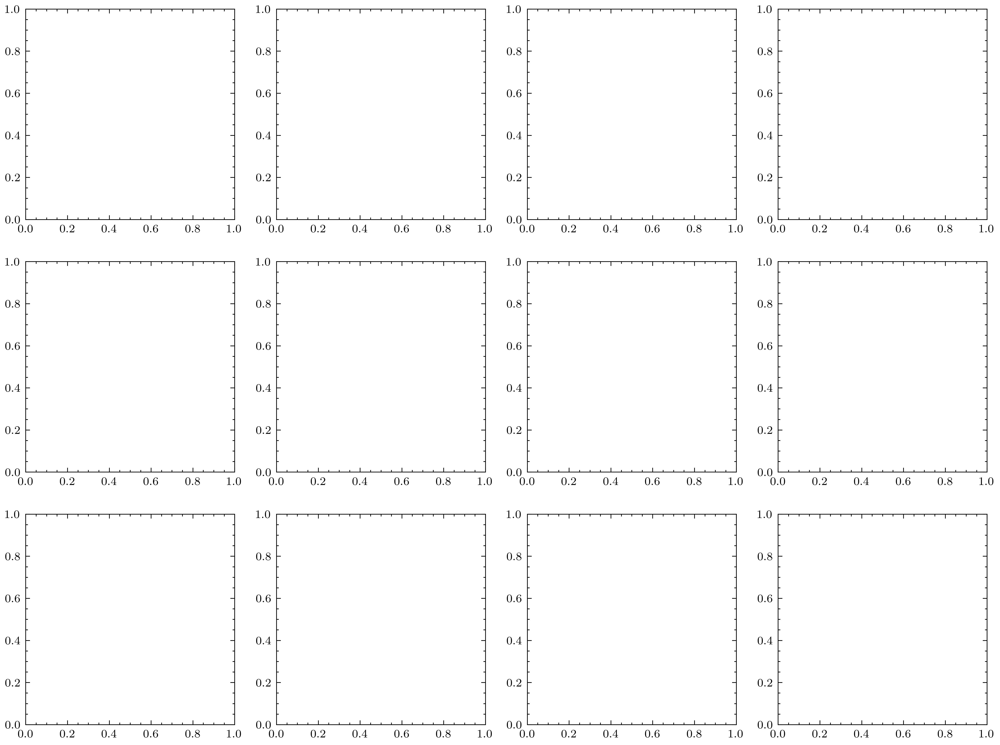

In [74]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA



def plot_kde(feature, save_name):
    # 获取特征数量
    
    # 对数据进行 PCA 降维
    print('对数据进行 PCA 降维')
    pca= PCA(n_components=12) # 0.95
    feature = pca.fit_transform(feature)

    
    # 绘制子图
    fig, axs = plt.subplots(3, 4, figsize=(12, 9))
    axs = axs.flatten()
    # 绘制每个特征的核密度估计
    for i in range(feature_num):
        # 计算四组数据的核密度估计
        kde1 = gaussian_kde(feature[:100, i])
        kde2 = gaussian_kde(feature[100:200, i])
        kde3 = gaussian_kde(feature[200:300, i])
        kde4 = gaussian_kde(feature[300:, i])

        # 生成横坐标
        xmin = min(feature[:, i].min())
        xmax = max(feature[:, i].max())
        x = np.linspace(xmin, xmax, 200)

        # 画图
        axs[i].plot(x, kde1(x), label='Normal features', linewidth=2)
        axs[i].plot(x, kde2(x), label='Ball features', linewidth=2)
        axs[i].plot(x, kde3(x), label='Inner features', linewidth=2)
        axs[i].plot(x, kde4(x), label='Outer features', linewidth=2)
        axs[i].legend()
        axs[i].set_title(f'Feature {i}')
        axs[i].set_xlabel('Feature')
        axs[i].set_ylabel('Probability Density')
        axs[i].set_yticks([])

        axs[i].fill_between(x, kde1(x), alpha=0.2)
        axs[i].fill_between(x, kde2(x), alpha=0.2)
        axs[i].fill_between(x, kde3(x), alpha=0.2)
        axs[i].fill_between(x, kde4(x), alpha=0.2)

    # 调整子图间距和边距
    fig.tight_layout(pad=3.0, w_pad=0.5, h_pad=1.0)

    # 保存图像
    plt.savefig(save_name + '.pdf', transparent=True, dpi=512)

    # 显示图像
    plt.show()
plot_kde(Resnet_feature, path + 'Resnet_feature_kde')
plot_kde(AFN_feature, path + 'AFN_feature_kde')
plot_kde(WKN_feature, path + 'WKN_feature_kde')

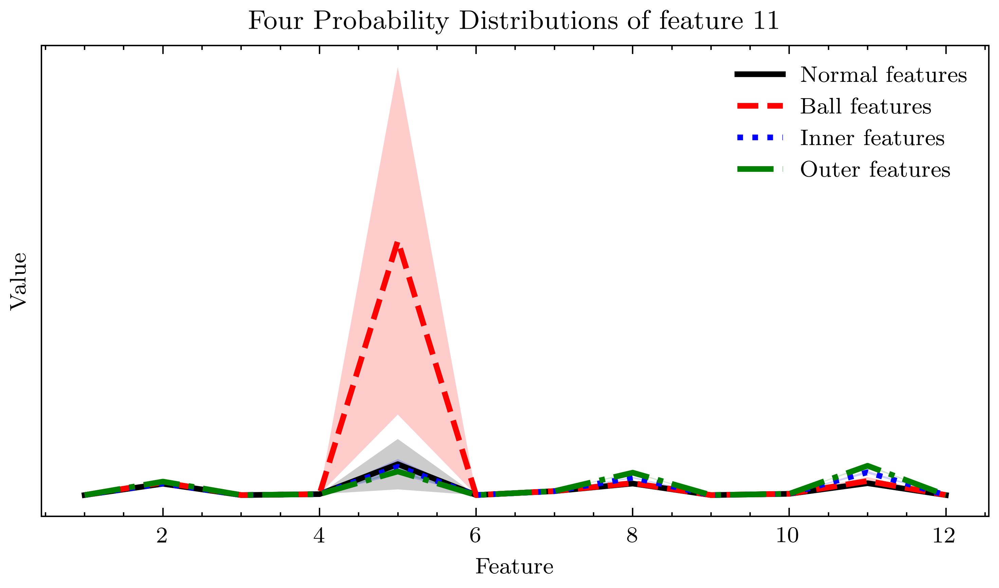

In [91]:
import numpy as np
import matplotlib.pyplot as plt

normal_features = Resnet_feature[:100]
ball_features = Resnet_feature[100:200]
inner_features = Resnet_feature[200:300]
outer_features = Resnet_feature[300:400]


# 计算四组数据的均值和标准差
mean1, std1 = np.mean(normal_features,axis=0), np.std(normal_features,axis=0)
mean2, std2 = np.mean(ball_features,axis=0), np.std(ball_features,axis=0)
mean3, std3 = np.mean(inner_features,axis=0), np.std(inner_features,axis=0)
mean4, std4 = np.mean(outer_features,axis=0), np.std(outer_features,axis=0)



x = np.linspace(1, 512, 512)

# 画图
plt.figure(figsize=(6, 3))
plt.plot(x, mean1, label='Normal features', linewidth=2)
plt.fill_between(x, mean1 - std1, mean1 + std1, alpha=0.2)
plt.plot(x, mean2, label='Ball features', linewidth=2)
plt.fill_between(x, mean2 - std2, mean2 + std2, alpha=0.2)
plt.plot(x, mean3, label='Inner features', linewidth=2)
plt.fill_between(x, mean3 - std3, mean3 + std3, alpha=0.2)
plt.plot(x, mean4, label='Outer features', linewidth=2)
plt.fill_between(x, mean4 - std4, mean4 + std4, alpha=0.2)
plt.legend()
plt.title(f'Four Probability Distributions of feature {i}')
plt.xlabel('Feature')
plt.ylabel('Value')
plt.yticks([]) 
plt.show()

In [88]:
x = np.linspace(1, 400, 400)
x

array([  1.,   2.,   3.,   4.,   5.,   6.,   7.,   8.,   9.,  10.,  11.,
        12.,  13.,  14.,  15.,  16.,  17.,  18.,  19.,  20.,  21.,  22.,
        23.,  24.,  25.,  26.,  27.,  28.,  29.,  30.,  31.,  32.,  33.,
        34.,  35.,  36.,  37.,  38.,  39.,  40.,  41.,  42.,  43.,  44.,
        45.,  46.,  47.,  48.,  49.,  50.,  51.,  52.,  53.,  54.,  55.,
        56.,  57.,  58.,  59.,  60.,  61.,  62.,  63.,  64.,  65.,  66.,
        67.,  68.,  69.,  70.,  71.,  72.,  73.,  74.,  75.,  76.,  77.,
        78.,  79.,  80.,  81.,  82.,  83.,  84.,  85.,  86.,  87.,  88.,
        89.,  90.,  91.,  92.,  93.,  94.,  95.,  96.,  97.,  98.,  99.,
       100., 101., 102., 103., 104., 105., 106., 107., 108., 109., 110.,
       111., 112., 113., 114., 115., 116., 117., 118., 119., 120., 121.,
       122., 123., 124., 125., 126., 127., 128., 129., 130., 131., 132.,
       133., 134., 135., 136., 137., 138., 139., 140., 141., 142., 143.,
       144., 145., 146., 147., 148., 149., 150., 15

In [14]:
exp.net.parameters

<bound method Module.parameters of DFN(
  (symbolic_transform_layer): ModuleList(
    (0): neural_symbolc_base(
      (learnable_param): ModuleList(
        (0): frequency_operation()
        (1): frequency_operation()
        (2): frequency_operation()
        (3): frequency_operation()
        (4): frequency_operation()
        (5): frequency_operation()
        (6): frequency_operation()
        (7): frequency_operation()
      )
      (filter_op): frequency_operation()
      (In): InstanceNorm1d(1, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
      (channel_conv): Conv1d(1, 12, kernel_size=(1,), stride=(1,), bias=False)
      (down_conv): Conv1d(1, 12, kernel_size=(1,), stride=(1,), bias=False)
    )
    (1): neural_symbolc_base(
      (learnable_param): ModuleList(
        (0): frequency_operation()
        (1): frequency_operation()
        (2): frequency_operation()
        (3): frequency_operation()
        (4): frequency_operation()
        (5): frequency_

# 8 超参数对比的分析

## hyperparameter

In [18]:
import pandas as pd
init = pd.read_csv('init.csv')
lr = pd.read_csv('lr.csv')
scale = pd.read_csv('scale.csv')

### init

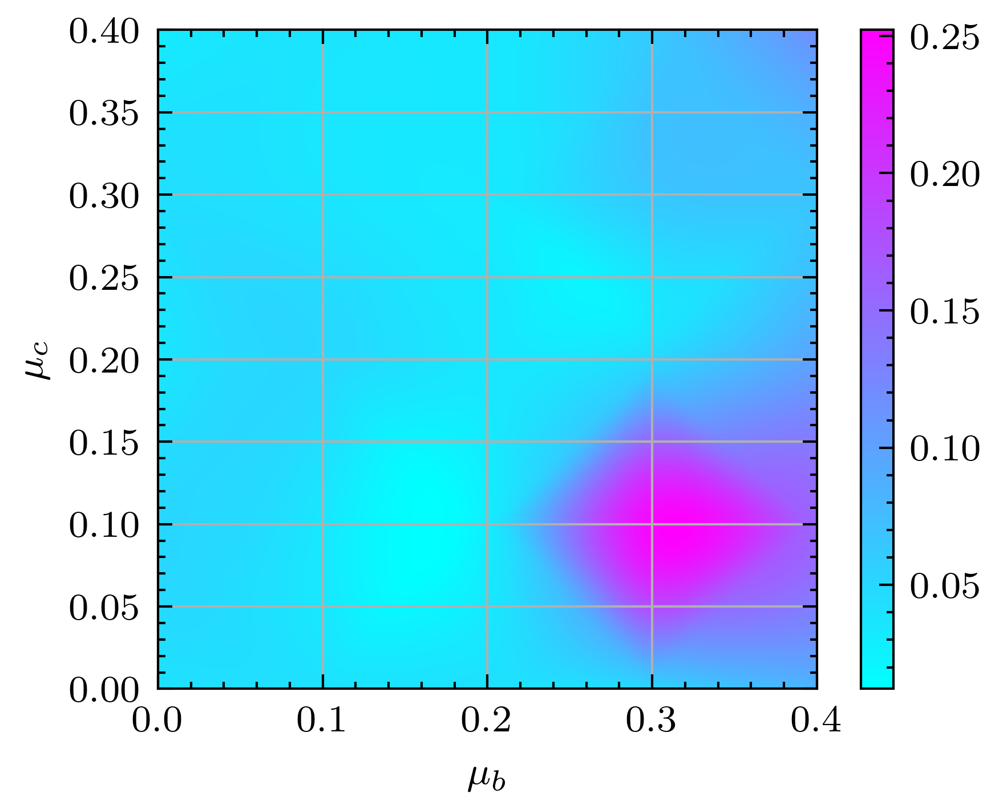

In [55]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import griddata
# 将数据转换为 numpy 数组
x = init['f_b_mu']
y = init['f_c_mu']
z = init['valloss']
# 将数据转换为网格矩阵
xi, yi = np.linspace(x.min(), x.max(), 1000), np.linspace(y.min(), y.max(), 1000)
xi, yi = np.meshgrid(xi, yi)
zi = griddata((x, y), z, (xi, yi), method='cubic')

# 绘制二维平滑图像
plt.imshow(zi, extent=[x.min(), x.max(), y.min(), y.max()], origin='lower', cmap='cool')

# 设置坐标轴标签
plt.xlabel('$\mu_b$')
plt.ylabel('$\mu_c$')
# plt.grid()
# 添加颜色条
plt.colorbar()
plt.savefig(path + f'init.pdf', transparent=True,dpi=512)
# 显示图像
plt.show()

### lr

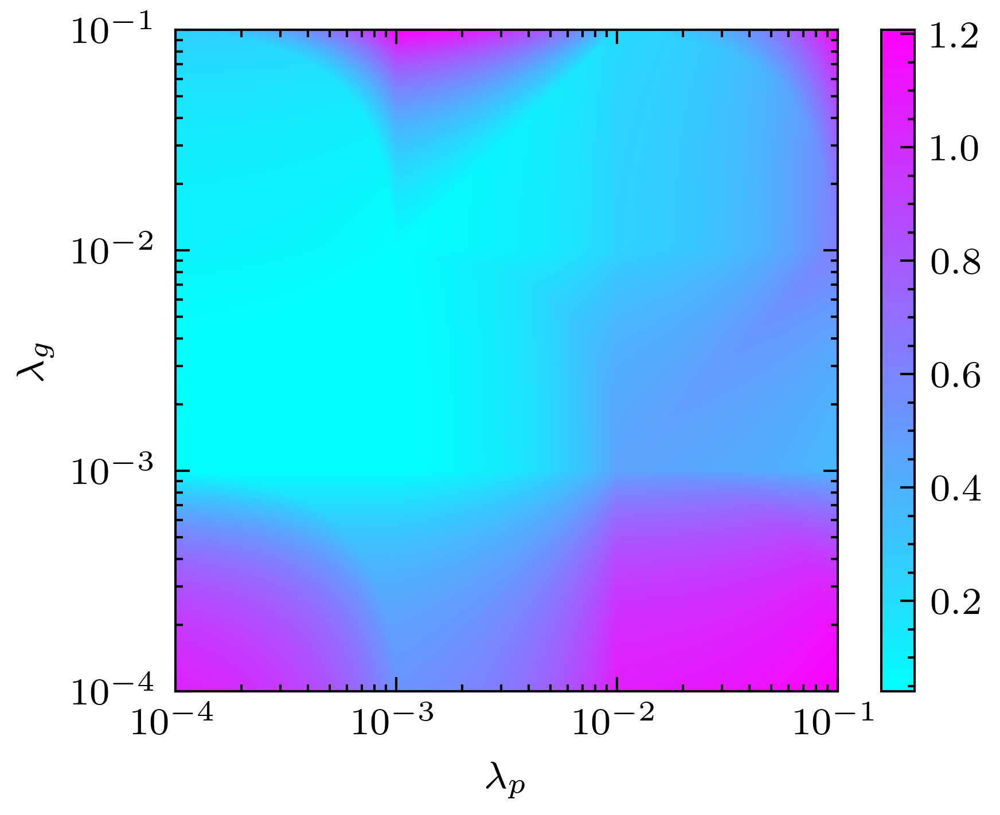

In [49]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import griddata
# 将数据转换为 numpy 数组
x = lr['lr']
y = lr['conv_lr']
z = lr['valloss']
# 将数据转换为网格矩阵
xi, yi = np.linspace(x.min(), x.max(), 10000), np.linspace(y.min(), y.max(), 10000)
xi, yi = np.meshgrid(xi, yi)
zi = griddata((x, y), z, (xi, yi), method='linear')

# 绘制二维平滑图像
plt.imshow(zi, extent=[x.min(), x.max(), y.min(), y.max()], origin='lower', cmap='cool')
plt.yscale("log")
plt.xscale("log")
# 设置坐标轴标签
plt.xlabel('$\lambda_p$')
plt.ylabel('$\lambda_g$')

# 添加颜色条
plt.colorbar()
plt.savefig(path + f'lr.pdf', transparent=True,dpi=512)
# 显示图像
plt.show()

### scale

In [36]:
scale_with_skip = scale.groupby('skip_connect')
scale_with_skip

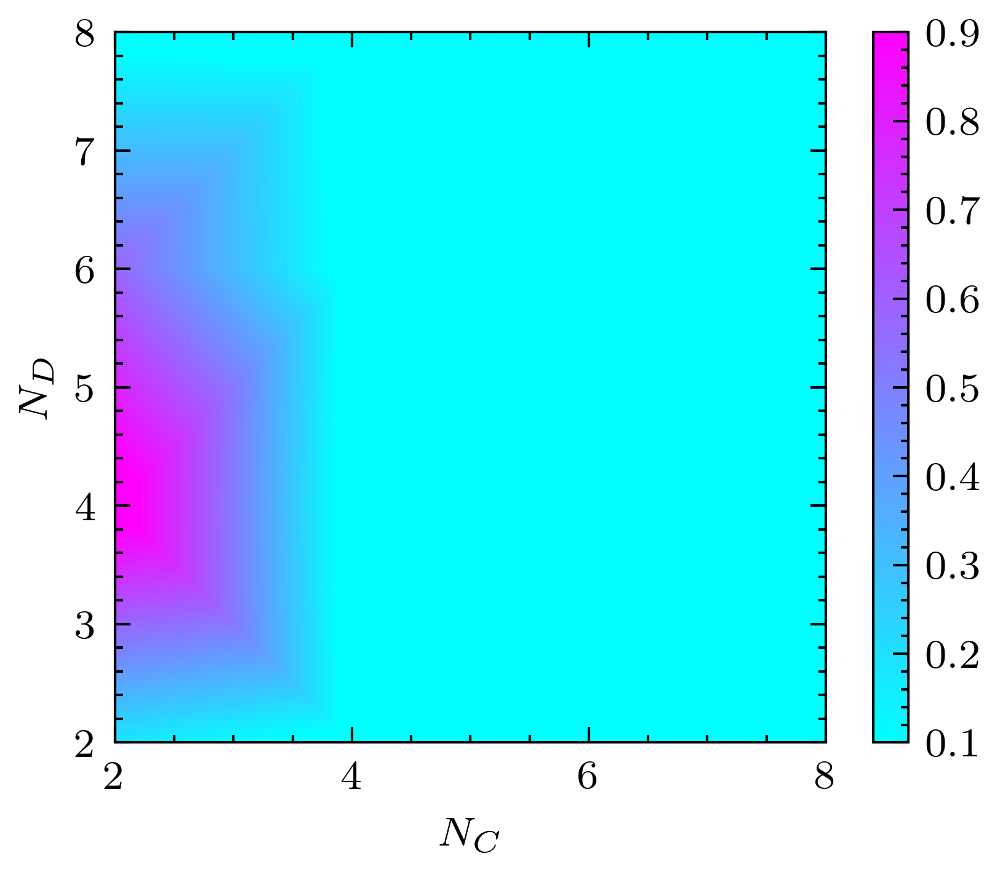

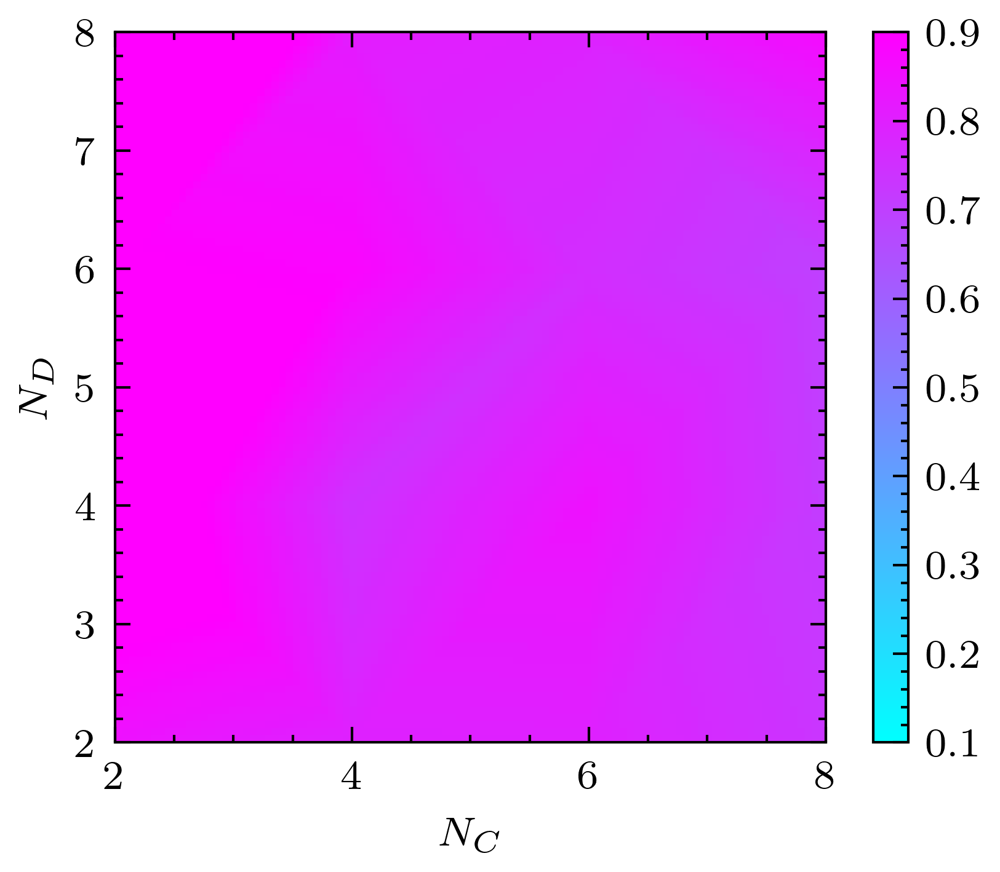

In [54]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import griddata
# 将数据转换为 numpy 数组
scale_with_skip = scale[scale['skip_connect'] == True]
scale_without_skip = scale[scale['skip_connect'] == False]


x = scale_with_skip['scale']
y = scale_with_skip['expert_layer']
z = scale_with_skip['valloss']
# 将数据转换为网格矩阵
xi, yi = np.linspace(x.min(), x.max(), 1000), np.linspace(y.min(), y.max(), 1000)
xi, yi = np.meshgrid(xi, yi)
zi = griddata((x, y), z, (xi, yi), method='linear')

# 绘制二维平滑图像



plt.imshow(zi, extent=[x.min(), x.max(), y.min(), y.max()], origin='lower', cmap='cool',vmin=0.1, vmax=0.9)

# 设置坐标轴标签
plt.xlabel('$N_C$')
plt.ylabel('$N_D$')

# 添加颜色条
plt.colorbar()
plt.savefig(path + f'scale.pdf', transparent=True,dpi=512)
# 显示图像
plt.show()
#########################################################################
x = scale_without_skip['scale']
y = scale_without_skip['expert_layer']
z = scale_without_skip['valloss']
# 将数据转换为网格矩阵
xi, yi = np.linspace(x.min(), x.max(), 100), np.linspace(y.min(), y.max(), 100)
xi, yi = np.meshgrid(xi, yi)
zi = griddata((x, y), z, (xi, yi), method='linear')

# 绘制二维平滑图像
plt.imshow(zi, extent=[x.min(), x.max(), y.min(), y.max()], origin='lower', cmap='cool',vmin=0.1, vmax=0.9)

# 设置坐标轴标签
plt.xlabel('$N_C$')
plt.ylabel('$N_D$')

# 添加颜色条
plt.colorbar()
plt.savefig(path + f'scale_wo.pdf', transparent=True,dpi=512)
# 显示图像
plt.show()

### Parameter importance

# 9 模型输出的信号对比

In [44]:
import numpy as np

def save_tensor_as_numpy(tensor, filename):
    # 将 CUDA tensor 转换为 numpy 数组
    numpy_array = tensor.detach().cpu().numpy()

    # 将 numpy 数组保存到磁盘
    np.save(filename, numpy_array,allow_pickle=True)

In [45]:
import os
os.getcwd()

'/home/richie_thu/_Richie_project/Deep symbolic net/rul prediction/save_dir'

In [2]:


huan_signal = np.load('./7_signal/Huan_signal.npy',allow_pickle=True)
res_signal = np.load('./7_signal/res_signal.npy',allow_pickle=True)
dong_signal = np.load('./7_signal/dong_signal.npy',allow_pickle=True)
WKN_signal = np.load('./7_signal/WKN_signal.npy',allow_pickle=True)




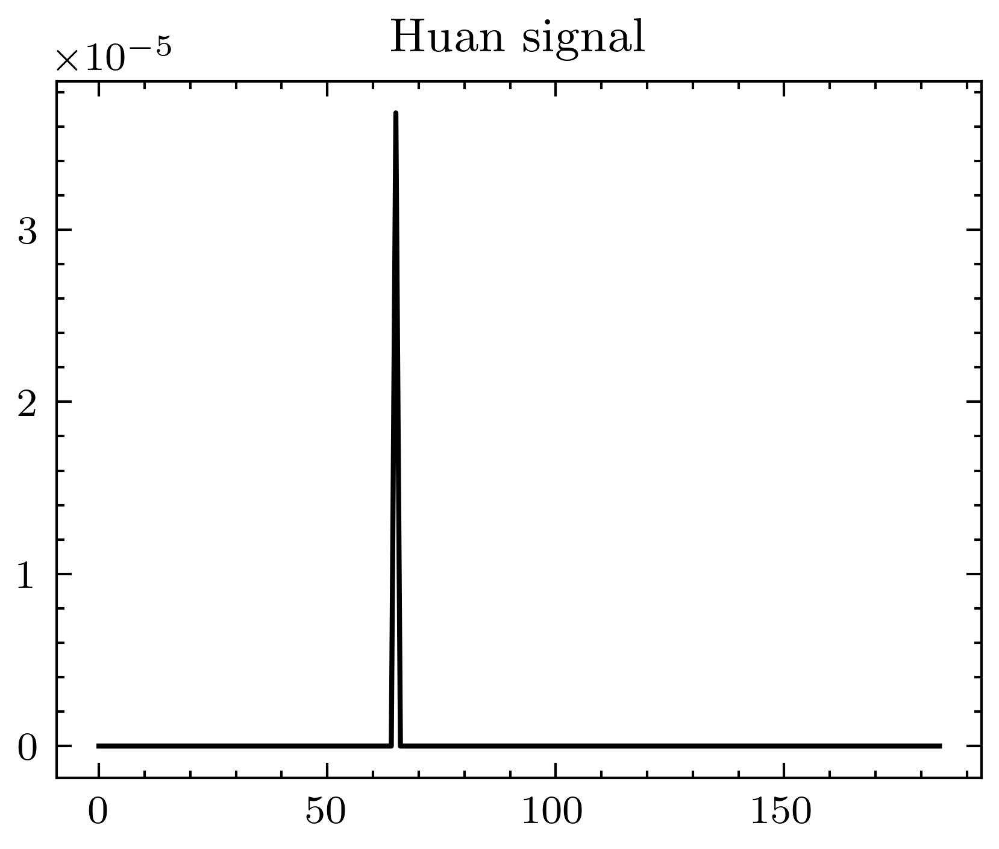

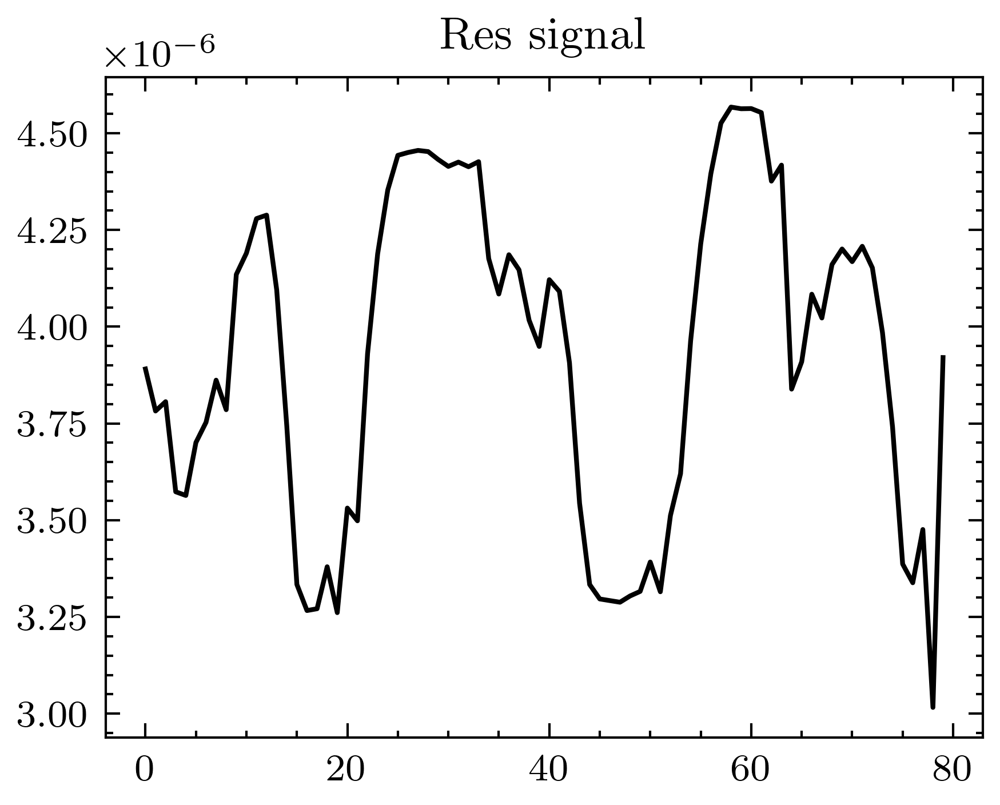

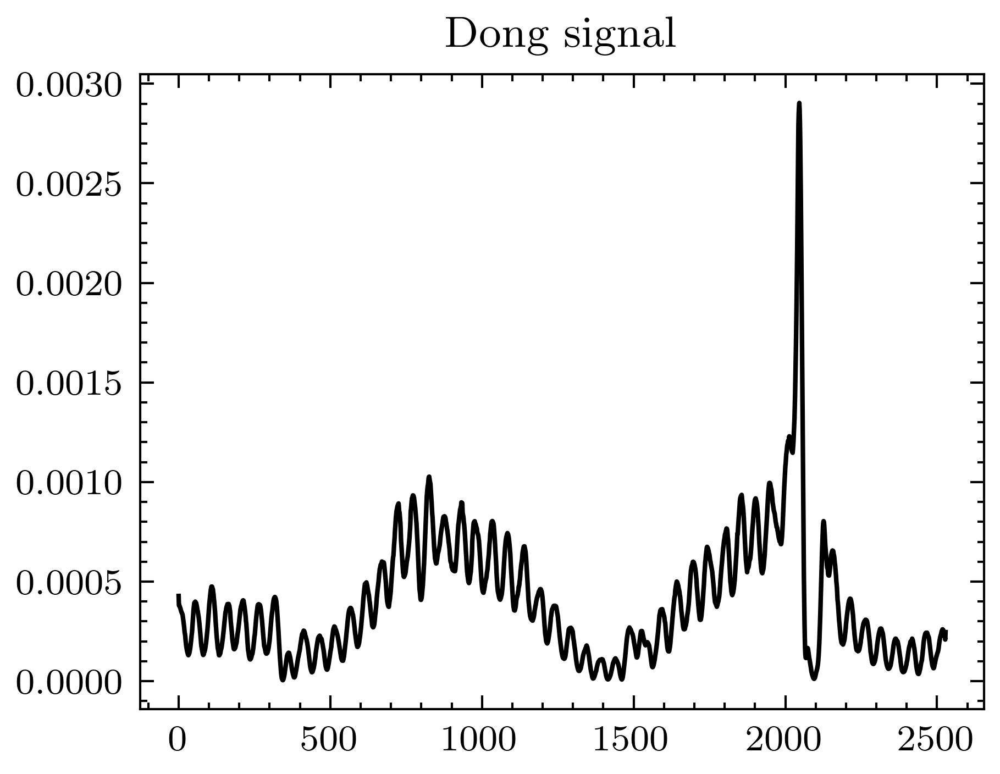

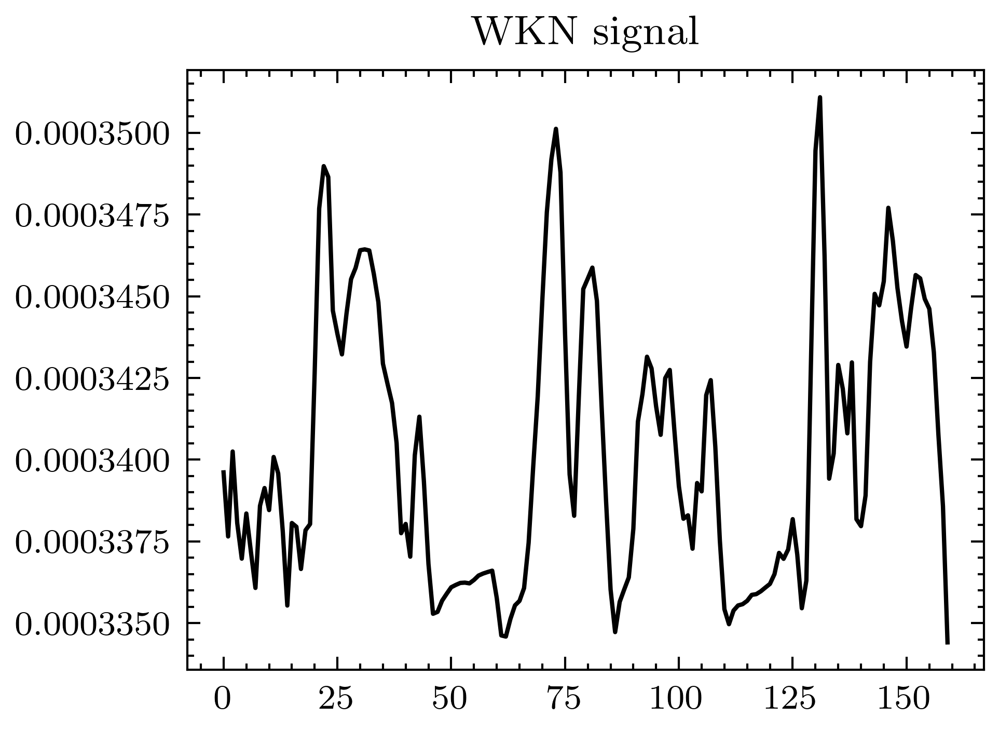

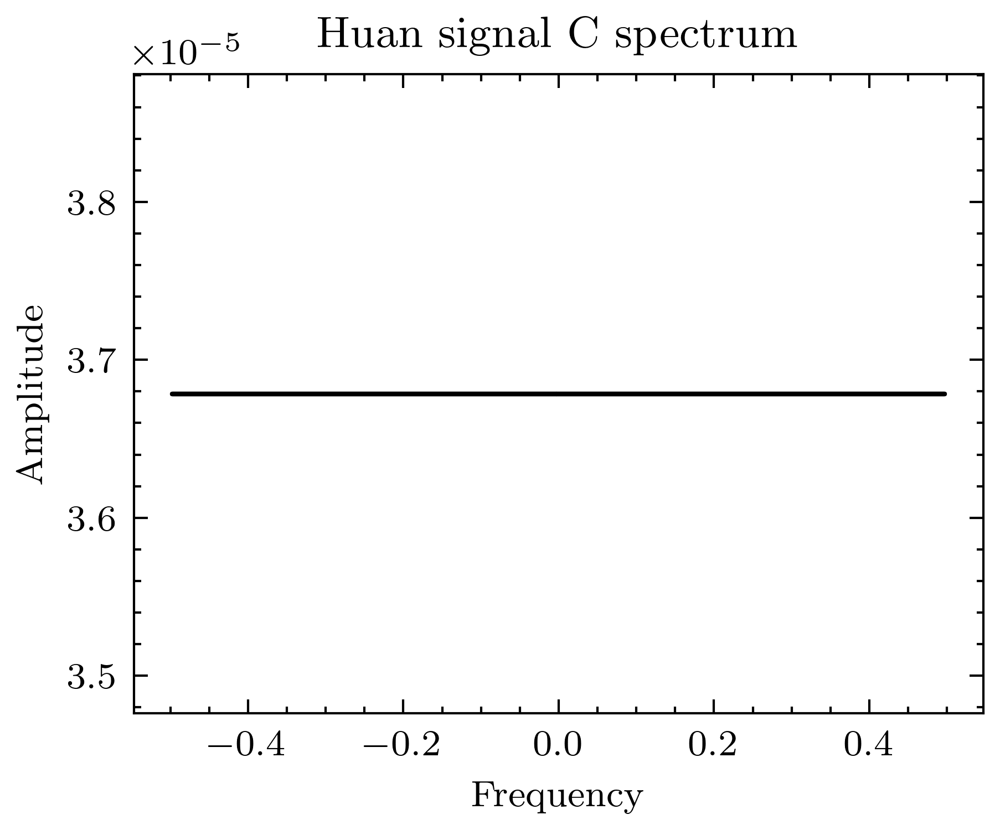

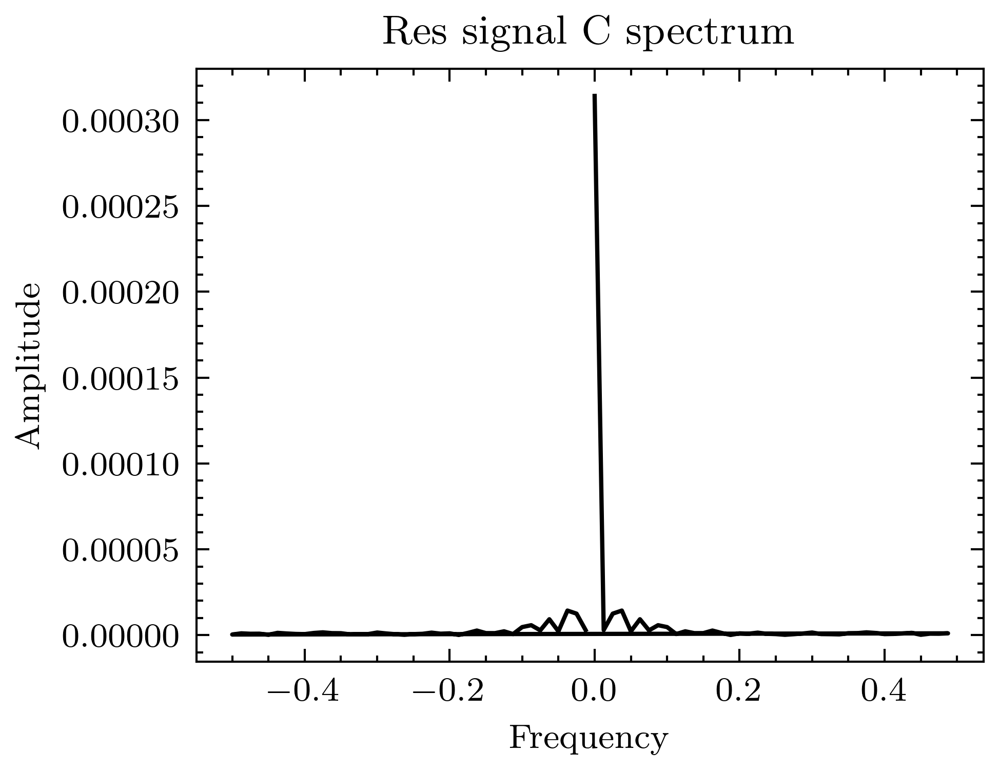

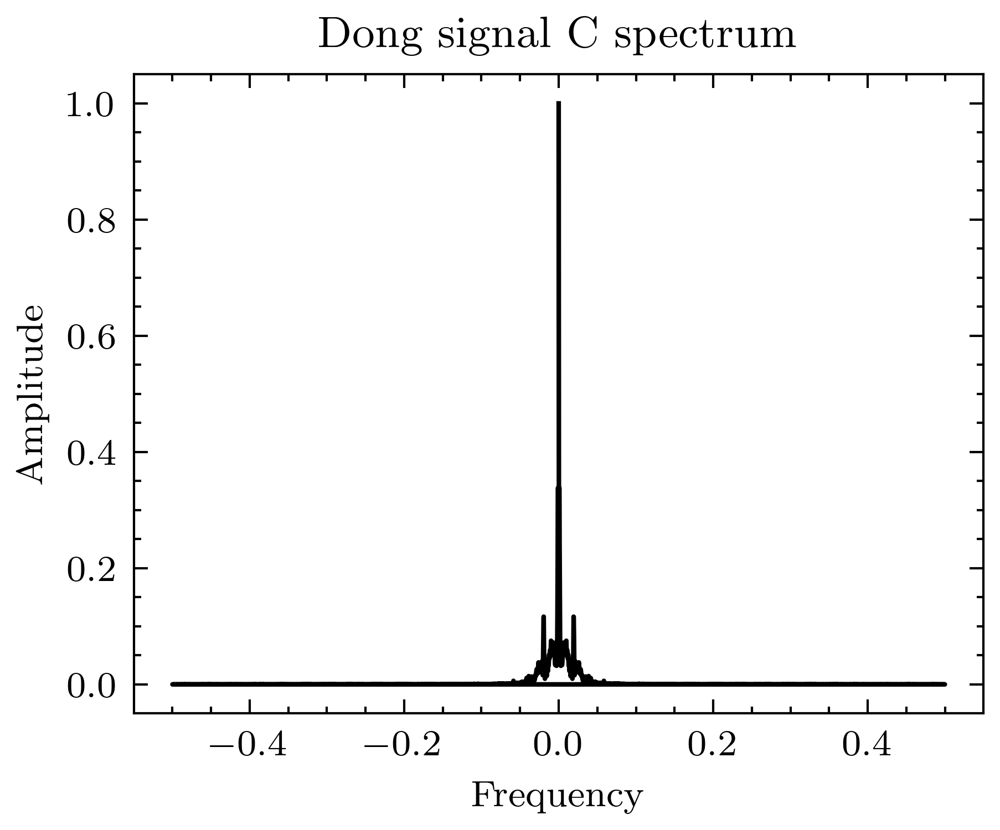

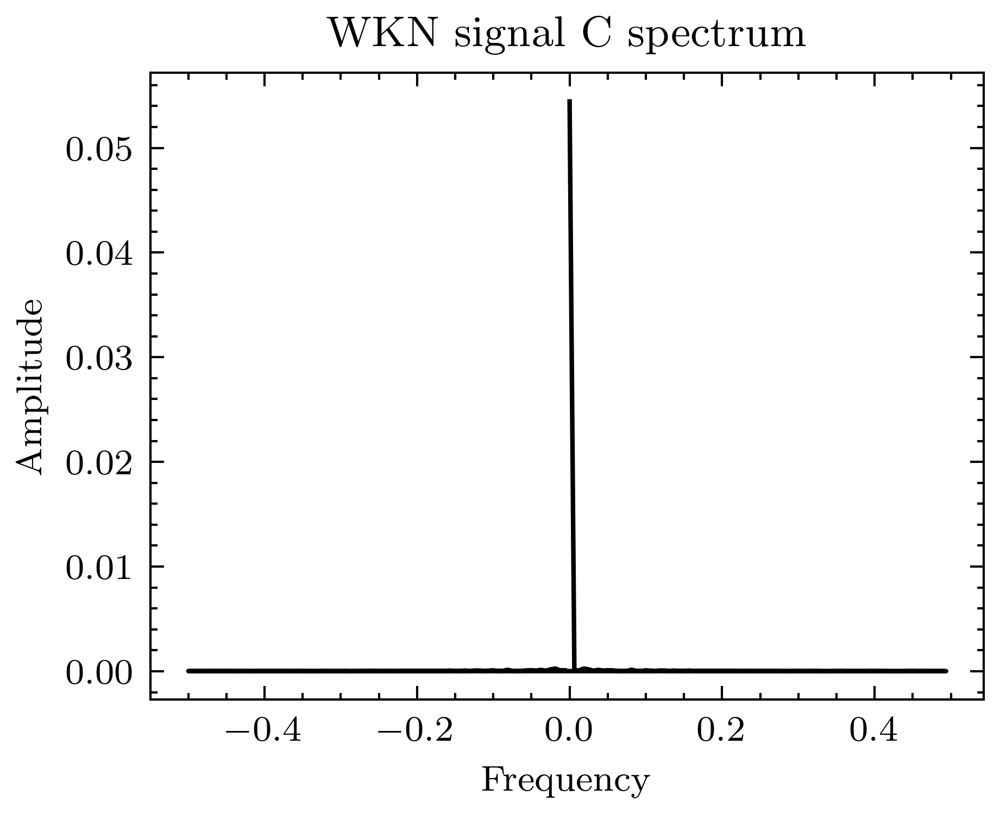

In [11]:
import numpy as np
import matplotlib.pyplot as plt
sample = 209
channel = 0
# 获取第 sample 个信号
huan_sample = huan_signal[sample,channel,:]
res_sample = res_signal[sample,channel,:]
dong_sample = dong_signal[sample,channel,:]
WKN_sample = WKN_signal[sample,channel,:]

def plot_time_domain(signal, title):
    plt.figure()
    plt.plot(signal)
    plt.title(title)
    plt.show()

# 使用函数绘制时域图像
plot_time_domain(huan_sample, 'Huan signal')
plot_time_domain(res_sample, 'Res signal')
plot_time_domain(dong_sample, 'Dong signal')
plot_time_domain(WKN_sample, 'WKN signal')

# 计算并绘制频谱图
def plot_spectrum(signal, title):
    C = np.fft.fft(signal)
    freq = np.fft.fftfreq(len(C))

    plt.figure()
    plt.plot(freq, np.abs(C))
    plt.title(title + ' C spectrum')
    plt.xlabel('Frequency')
    plt.ylabel('Amplitude')
    plt.show()


plot_spectrum(huan_sample, 'Huan signal')
plot_spectrum(res_sample, 'Res signal')
plot_spectrum(dong_sample, 'Dong signal')
plot_spectrum(WKN_sample, 'WKN signal')

## 2D信号

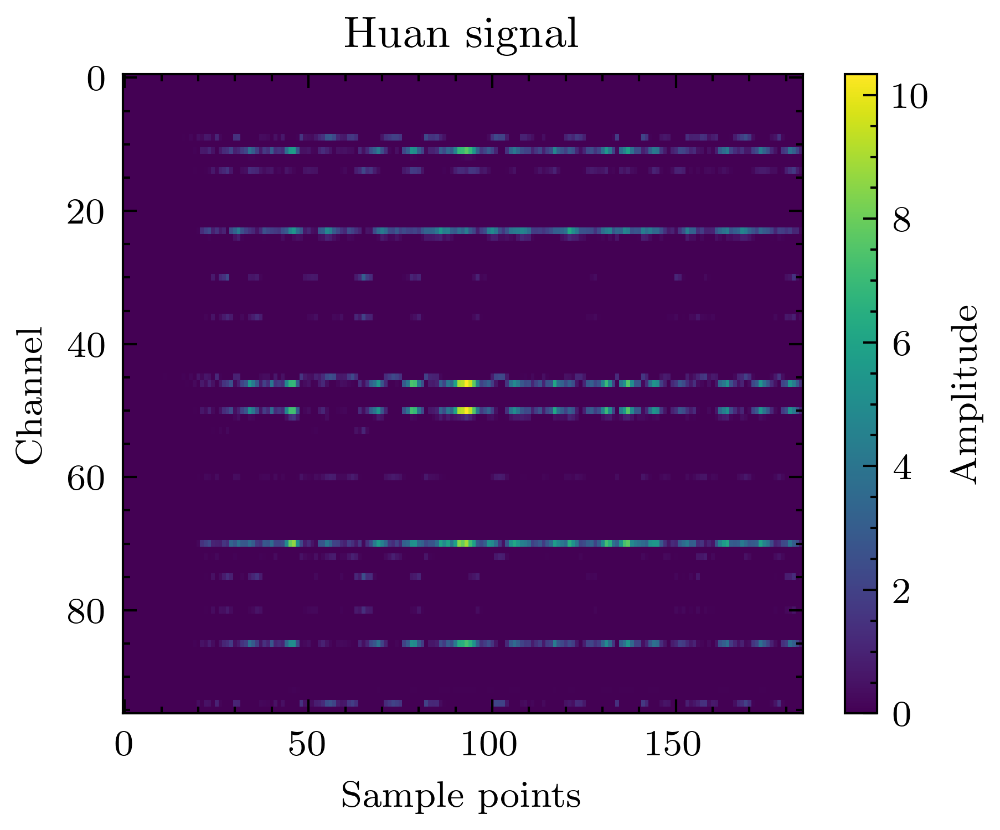

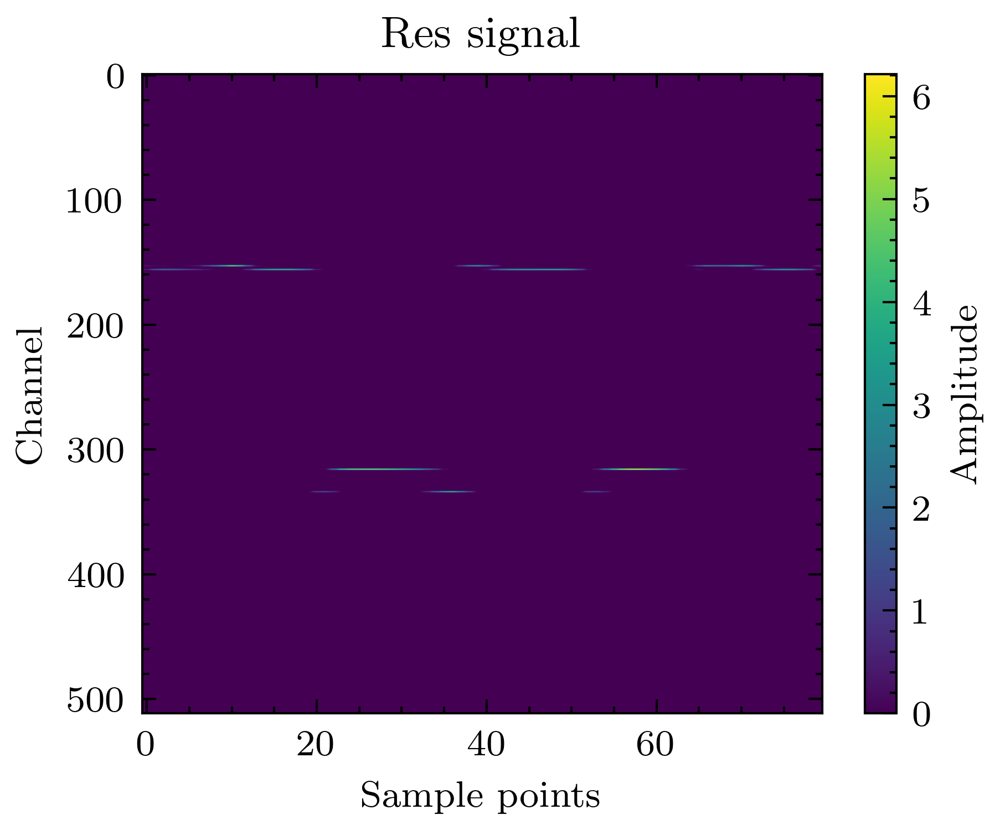

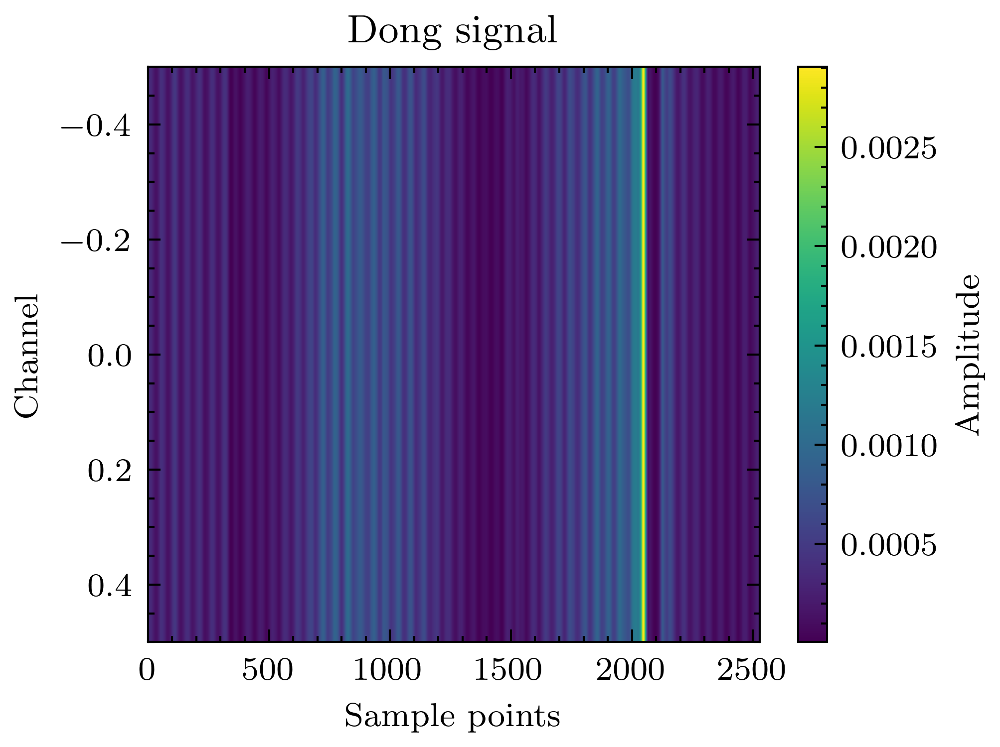

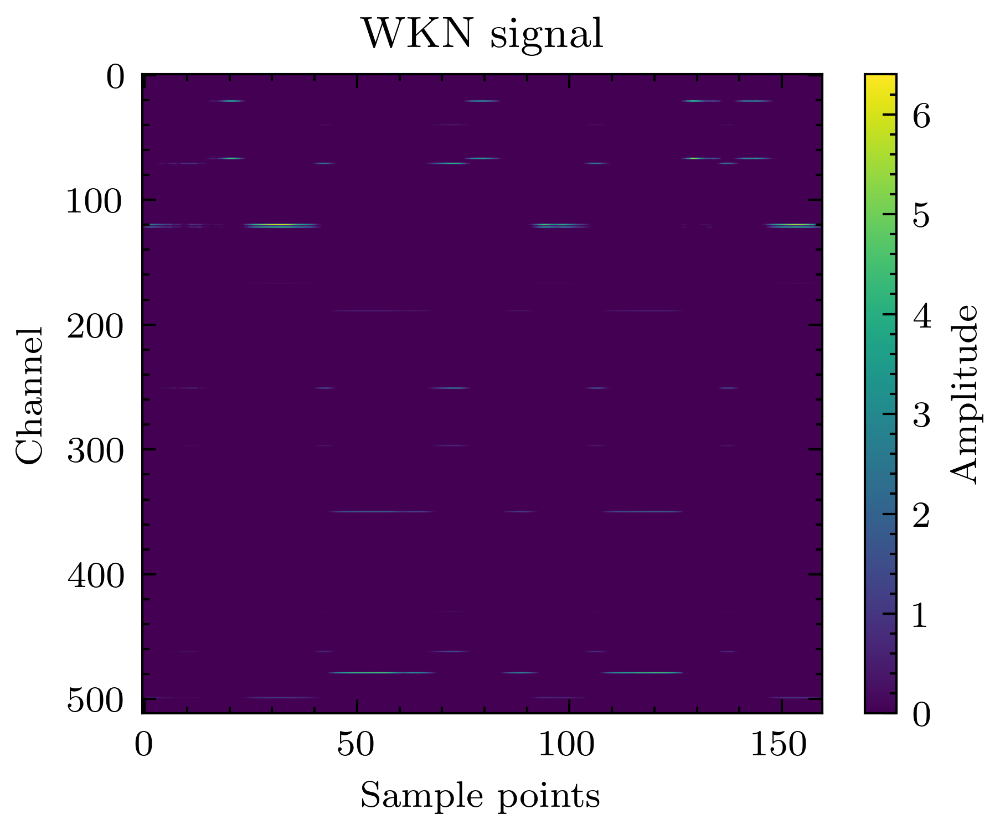

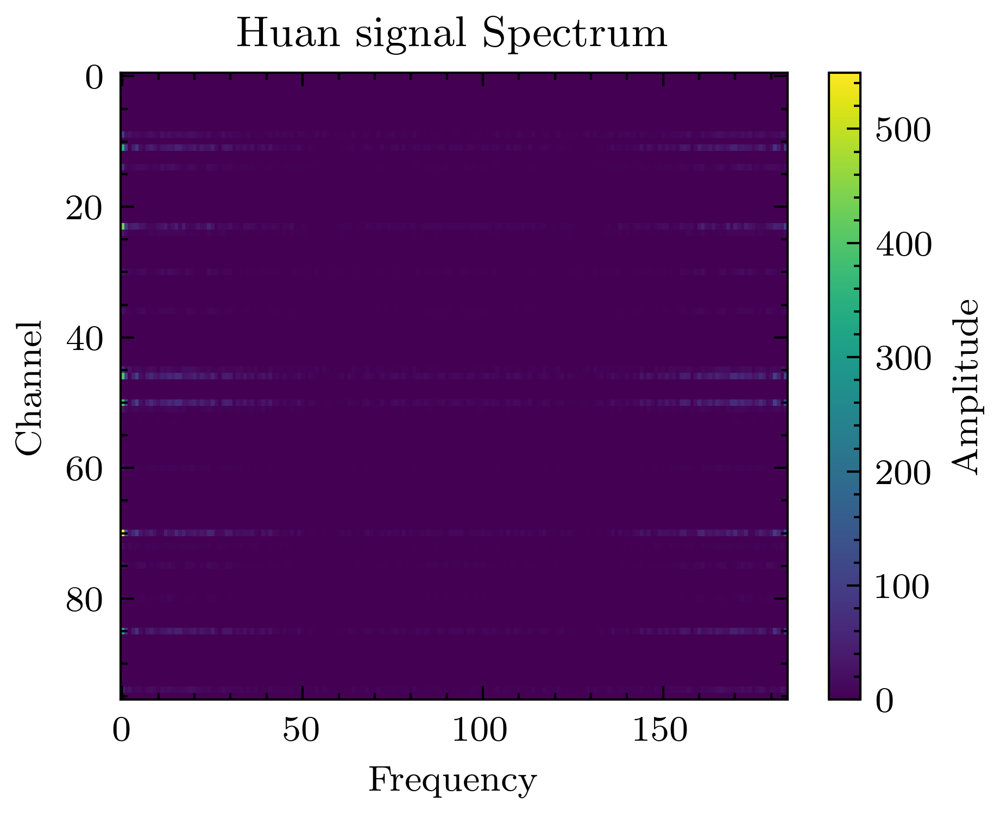

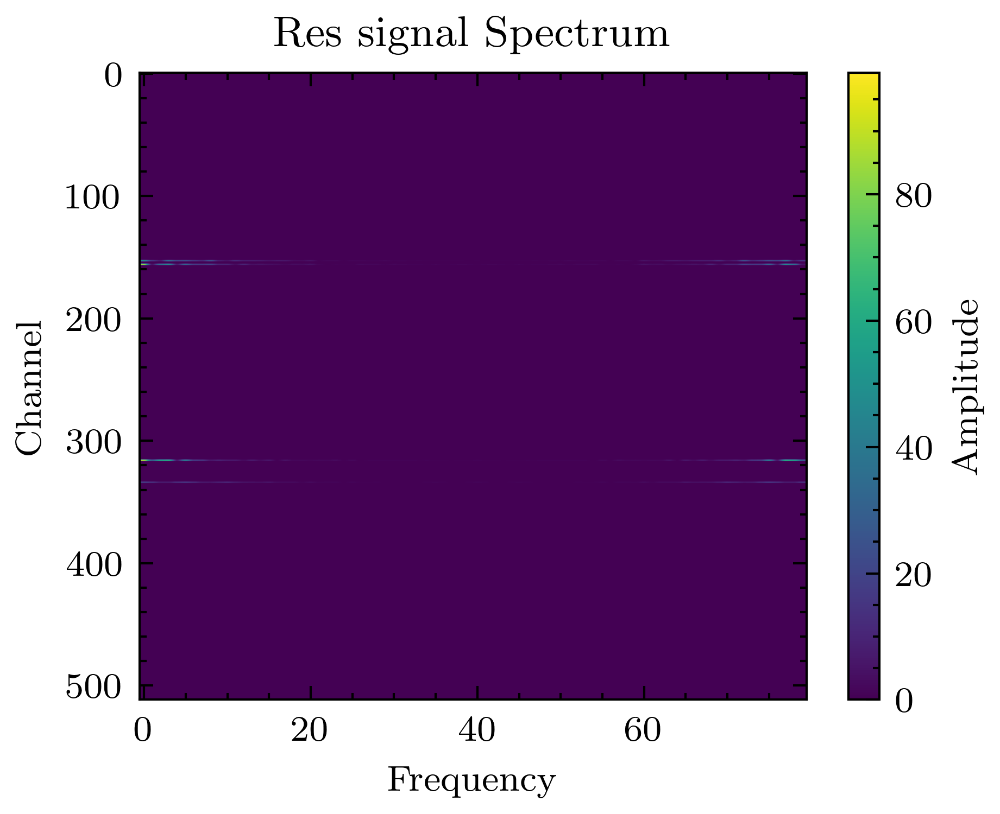

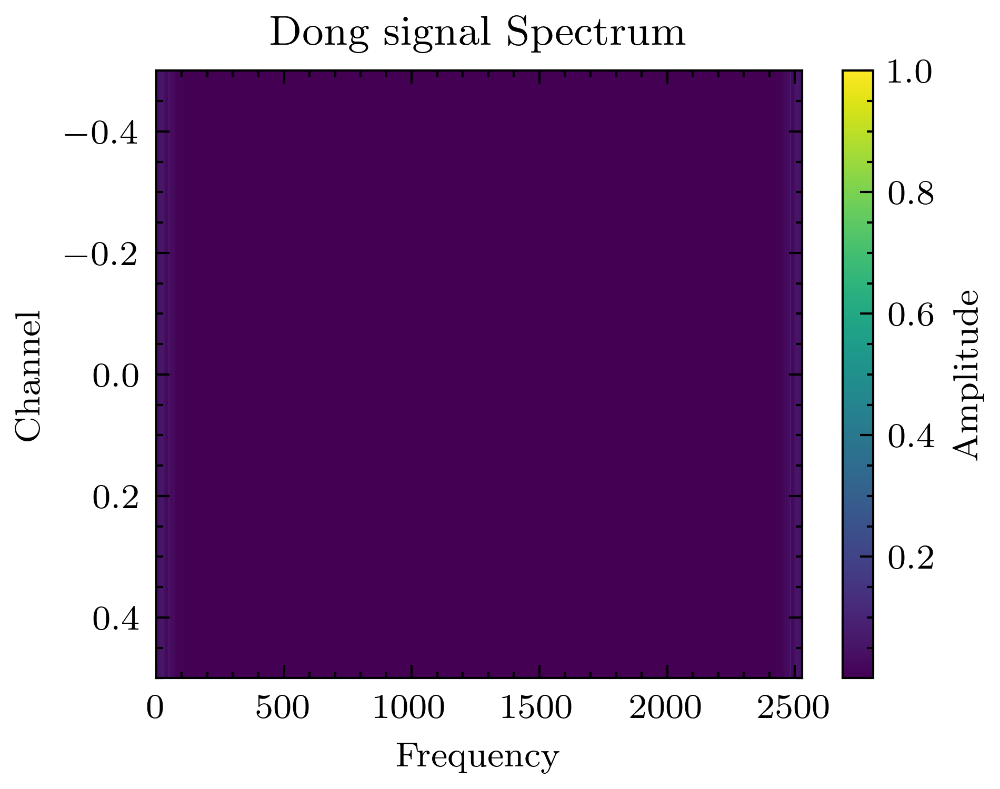

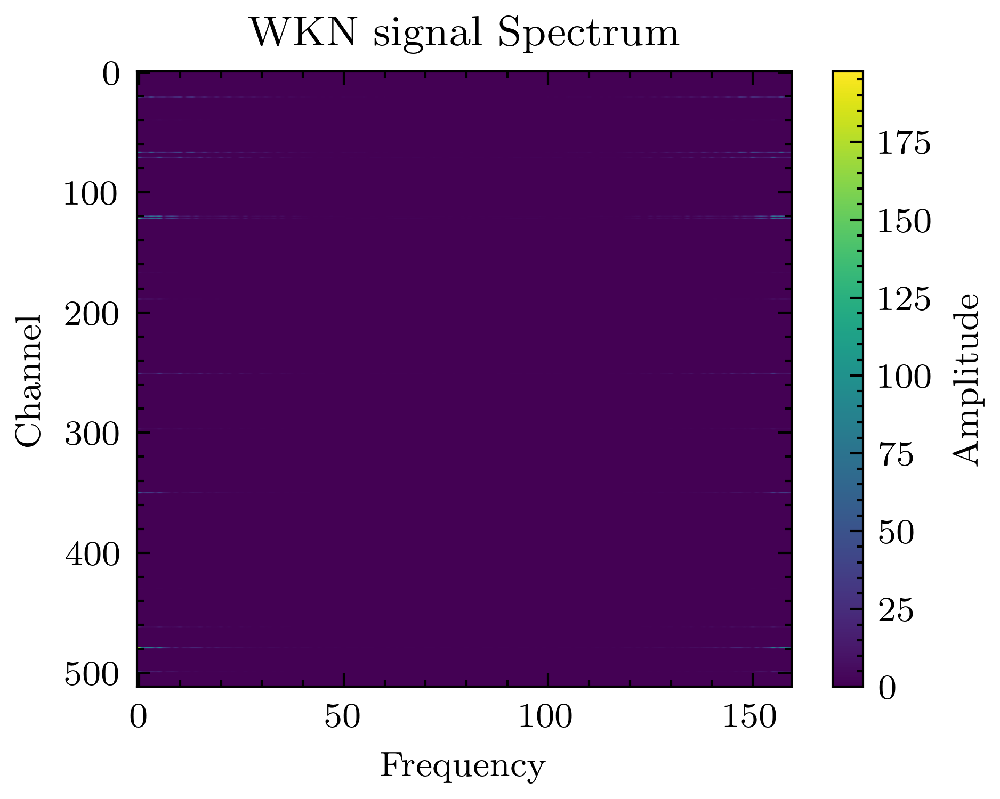

In [14]:
def plot_time_domain_2d(signal, title):
    plt.figure()
    plt.imshow(signal, aspect='auto')
    plt.title(title)
    plt.xlabel('Sample points')
    plt.ylabel('Channel')
    plt.colorbar(label='Amplitude')
    plt.show()

# 使用函数绘制时域二维图像
plot_time_domain_2d(huan_signal[sample], 'Huan signal')
plot_time_domain_2d(res_signal[sample], 'Res signal')
plot_time_domain_2d(dong_signal[sample], 'Dong signal')
plot_time_domain_2d(WKN_signal[sample], 'WKN signal')

def plot_spectrum_2d(signal, title):
    # 计算频谱
    spectrum = np.fft.fft(signal, axis=1)
    # 计算频率
    freq = np.fft.fftfreq(signal.shape[1])

    plt.figure()
    plt.imshow(np.abs(spectrum), aspect='auto') # , extent=[freq.min(), freq.max(), 0, signal.shape[0]]
    plt.title(title + ' Spectrum')
    plt.xlabel('Frequency')
    plt.ylabel('Channel')
    plt.colorbar(label='Amplitude')
    plt.show()

# 使用函数绘制频谱二维图像
plot_spectrum_2d(huan_signal[sample], 'Huan signal')
plot_spectrum_2d(res_signal[sample], 'Res signal')
plot_spectrum_2d(dong_signal[sample], 'Dong signal')
plot_spectrum_2d(WKN_signal[sample], 'WKN signal')

## 选前四组信号

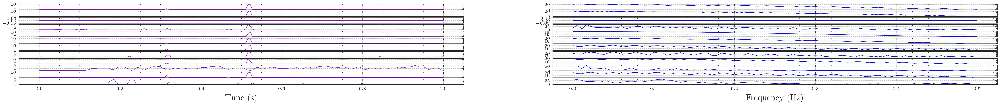

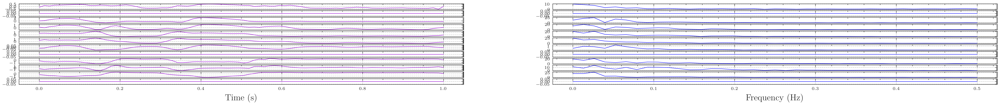

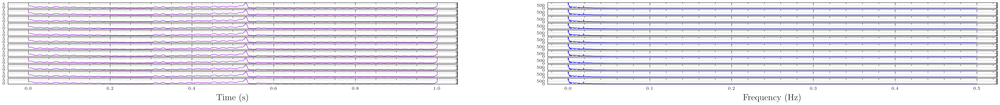

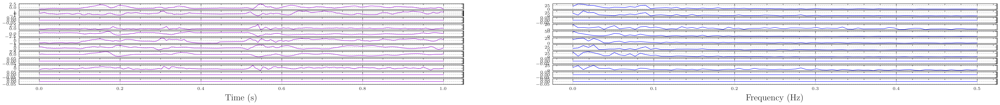

In [42]:
sample = 212
scales = 12
shift = 1
with_stick = True

def plot_tf(output,sample,scales,name):
    
    fig, axs = plt.subplots(nrows=scales, ncols=2, figsize=(scales*2, 2))    
    for scale in range(scales):

        axs[scale,0].grid(True, linestyle='--', linewidth=0.5, color='gray', alpha=0.5)
        axs[scale,1].grid(True, linestyle='--', linewidth=0.5, color='gray', alpha=0.5)
        axs[scale,0].xaxis.set_tick_params(labelsize=6)
        axs[scale,0].yaxis.set_tick_params(labelsize=6)  
        axs[scale,1].xaxis.set_tick_params(labelsize=6)
        axs[scale,1].yaxis.set_tick_params(labelsize=6)
        
        time_signal = output[sample,scale,:]
        time_signal = (time_signal -np.mean(time_signal))/(np.std(time_signal)+ 1e-6)
        length = len(time_signal)
        
        t = np.linspace(0, 1, length)
        w = np.linspace(0, 0.5, length//2-shift)
                
        fre_signal = np.fft.fft(time_signal)[:length//2]
        fre_signal = np.abs(fre_signal)
        axs[scale,0].plot(t,time_signal,linewidth=0.5,color='darkviolet')
        axs[scale,1].plot(w,fre_signal[shift:],linewidth=0.5,color='blue') # [:100]
        
        if with_stick and scale == scales-1:
            axs[scale,0].set_xlabel('Time (s)',fontsize=12)
            # axs[scale,0].set_ylabel('Amplitude',fontsize=12)
            axs[scale,1].set_xlabel('Frequency (Hz)',fontsize=12)
            # axs[scale,1].set_ylabel('Amplitude',fontsize=12)

        else:
            axs[scale,0].set_xticklabels([], fontsize=12)
            # axs[scale,0].set_yticklabels([], fontsize=12)
            axs[scale,1].set_xticklabels([], fontsize=12)
        # axs[scale,0].set_title(name)
    plt.savefig(path +f'{name}signal.pdf', transparent=True,dpi=512)
    plt.show()
dong_signals = np.repeat(dong_signal, scales, axis=1)
plot_tf(huan_signal,sample,scales, 'Huan signal')
plot_tf(res_signal,sample,scales, 'Res signal')
plot_tf(dong_signals,sample,scales, 'Dong signal')
plot_tf(WKN_signal,sample,scales, 'WKN signal')


In [40]:
path


'plot_dir/'

## 特征增益
p.s. 特征的相关系数在上面有模型输出的特征计算，下面重新计算特征有BUG

metric

In [35]:
class MMD_loss(nn.Module):
    
    def __init__(self, kernel_mul = 2.0, kernel_num = 5):
        super(MMD_loss, self).__init__()
        self.kernel_num = kernel_num
        self.kernel_mul = kernel_mul
        self.fix_sigma = None
    def guassian_kernel(self, source, target, kernel_mul=2.0, kernel_num=5, fix_sigma=None):
        
        n_samples = int(source.size()[0])+int(target.size()[0])
        total = torch.cat([source, target],dim=0)
        total0 = total.unsqueeze(0).expand(int(total.size(0)), int(total.size(0)), int(total.size(1)))
        total1 = total.unsqueeze(1).expand(int(total.size(0)), int(total.size(0)), int(total.size(1)))
        L2_distance = ((total0-total1)**2).sum(2) 
        if fix_sigma:
            bandwidth = fix_sigma
        else:
            bandwidth = torch.sum(L2_distance.data) / (n_samples**2-n_samples)
        bandwidth /= kernel_mul ** (kernel_num // 2)
        bandwidth_list = [bandwidth * (kernel_mul**i) for i in range(kernel_num)]
        kernel_val = [torch.exp(-L2_distance / bandwidth_temp) for bandwidth_temp in bandwidth_list]
        return sum(kernel_val)

    def forward(self, source, target):
        batch_size = int(source.size()[0])
        kernels = self.guassian_kernel(source, target, kernel_mul=self.kernel_mul, kernel_num=self.kernel_num, fix_sigma=self.fix_sigma)
        XX = kernels[:batch_size, :batch_size]
        YY = kernels[batch_size:, batch_size:]
        XY = kernels[:batch_size, batch_size:]
        YX = kernels[batch_size:, :batch_size]
        loss = torch.mean(XX + YY - XY -YX)
        return loss
def correlation_coefficient(x, y):
    vx = x - torch.mean(x)
    vy = y - torch.mean(y)
    corr = torch.sum(vx * vy) / (torch.sqrt(torch.sum(vx ** 2)) * torch.sqrt(torch.sum(vy ** 2)))
    return corr

cos_similarity= lambda x,y : nn.CosineSimilarity(dim=1, eps=1e-6)(x,y).mean()
MMD = MMD_loss()
identity = lambda x : x
# Mutual_information = lambda x,y : 

entropy = lambda x: (x * torch.log(torch.softmax(x , dim=-1))).mean(dim=-1, keepdim = True)
kurtosis = lambda x: (((x - torch.mean(x,dim=-1, keepdim = True)) ** 4).mean(dim=-1, keepdim = True)) / ((torch.var(x,dim=-1, keepdim = True) ** 2).mean(dim=-1, keepdim = True))
mean = lambda x: torch.mean(x,dim=-1, keepdim = True)
    

In [33]:
# import numpy as np
# from scipy.stats import entropy
# from sklearn.metrics import mutual_info_score

# def calculate_probabilities(x, y, bins):
#     joint_prob, _, _ = np.histogram2d(x, y, bins=bins)
#     joint_prob = joint_prob.astype(float)
#     joint_prob /= np.sum(joint_prob)
#     x_prob, _ = np.histogram(x, bins=bins)
#     x_prob = x_prob.astype(float)
#     x_prob /= np.sum(x_prob)
#     y_prob, _ = np.histogram(y, bins=bins)
#     y_prob = y_prob.astype(float)
#     y_prob /= np.sum(y_prob)
#     return joint_prob, x_prob, y_prob

# def calculate_mutual_information(joint_prob, x_prob, y_prob):
#     mutual_info = 0
#     for i in range(joint_prob.shape[0]):
#         for j in range(joint_prob.shape[1]):
#             if joint_prob[i, j] > 0:
#                 mutual_info += joint_prob[i, j] * np.log(joint_prob[i, j] / (x_prob[i] * y_prob[j]))
#     return mutual_info

# def calculate_kl_divergence(p, q):
#     return entropy(p, q)

# # 信号 x 和 y
# x = np.random.normal(size=(100,1000))
# y = np.random.normal(size=(100,1000))

# # 计算概率分布
# joint_prob, x_prob, y_prob = calculate_probabilities(x, y, bins=30)

# # 计算互信息
# mutual_info = calculate_mutual_information(joint_prob, x_prob, y_prob)
# print('Mutual Information:', mutual_info)

# # 计算 KL 散度
# kl_div = calculate_kl_divergence(x_prob, y_prob)
# print('KL Divergence:', kl_div)

ValueError: too many values to unpack (expected 2)

array 差異

In [77]:
import numpy as np

def calculate_differences(signals, distance_metric):
    metrics = []
    for i in range(len(signals)):
        for j in range(i+1, len(signals)):
            d = distance_metric(signals[i], signals[j])
            metrics.append(d)
    metrics_array = np.array(metrics)
    mean_metric = np.mean(metrics_array)
    return metrics_array, mean_metric

信號+特徵分割

In [59]:
def norm(x):
    return (x - np.mean(x))/(np.std(x)+ 1e-6)

testx = testx.squeeze()
def signal_extractor(testx):
    testx = testx.reshape(400,-1)
    # testx = norm(testx)
    normal_signal = testx[:100]
    ball_signal = testx[100:200]
    inner_signal = testx[200:300]
    outer_signal = testx[300:400]
    original = [normal_signal, ball_signal, inner_signal, outer_signal]
    return original

original = signal_extractor(testx)

def feature_extractor(testx,only_mean = False):
    
    if only_mean:
        mean_x = mean(testx).reshape(400,-1)+1e-6
        nan_channels = torch.isnan(mean_x).any(dim=0)
        feature_x = mean_x[:, ~nan_channels]
    else:
        entropy_x = entropy(testx).reshape(400,-1)+1e-6
        kurtosis_x = kurtosis(testx).reshape(400,-1)+1e-6
        mean_x = mean(testx).reshape(400,-1)+1e-6
        # entropy_x = norm(entropy_x)
        # kurtosis_x = norm(kurtosis_x)
        # mean_x = norm(mean_x)
        
        feature_x = torch.cat([entropy_x, kurtosis_x, mean_x],dim=-1)
        nan_channels = torch.isnan(feature_x).any(dim=0)
        feature_x = feature_x[:, ~nan_channels]

    normal_feature = feature_x[:100]
    ball_feature = feature_x[100:200]
    inner_feature = feature_x[200:300]
    outer_feature = feature_x[300:400]
    feature_list = [normal_feature, ball_feature, inner_feature, outer_feature]
    return feature_list

feature_list = feature_extractor(testx)




In [38]:
# print(f'## original_cos{calculate_differences(original,cos_similarity)}')
# print(f'## original_MMD{calculate_differences(original,MMD)}')
# print(f'## feature_cos{calculate_differences(feature_list,cos_similarity)}')
# print(f'## feature_MMD{calculate_differences(feature_list,MMD)}')

print(f'## original_CC{calculate_differences(original,correlation_coefficient)}')
print(f'## feature_CC{calculate_differences(feature_list,correlation_coefficient)}')

# metrics_array, mean_metric = calculate_differences(original, cos)

## original_CC(array([ 0.05151986, -0.0641377 , -0.02220684,  0.01971158,  0.04080477,
        0.01562504], dtype=float32), 0.0068861186)
## feature_CC(array([0.9889338 , 0.9925766 , 0.98932934, 0.99423677, 0.9915015 ,
       0.99628735], dtype=float32), 0.99214417)


AFN

In [27]:
resnet_features = FeatureExtractor(exp.net, layers=["symbolic_transform_layer.0",
                                                    "symbolic_transform_layer.1",
                                                    "symbolic_transform_layer.2",
                                                    ])
features = resnet_features(testx.unsqueeze(1).cuda())
features.values()

dict_values([tensor([[[-4.1730e-01, -3.5200e-01, -3.2048e-01,  ..., -5.2844e-01,
          -5.3533e-01, -4.9153e-01],
         [-4.0491e-01, -4.3267e-01, -4.6008e-01,  ..., -3.0316e-01,
          -3.4158e-01, -3.7502e-01],
         [-4.0218e-01, -4.4147e-01, -4.7996e-01,  ..., -2.7182e-01,
          -3.1815e-01, -3.6141e-01],
         ...,
         [-3.5949e-01, -4.1099e-01, -4.6130e-01,  ..., -1.9573e-01,
          -2.5204e-01, -3.0657e-01],
         [ 4.1931e+00,  7.8943e+00,  1.6463e+00,  ..., -2.0475e-01,
          -7.7473e+00, -5.4568e+00],
         [-4.1688e-01, -4.0330e-01, -3.9543e-01,  ..., -4.1399e-01,
          -4.2964e-01, -4.2851e-01]],

        [[-4.1359e-02, -4.2263e-01, -6.4378e-01,  ...,  9.7865e-01,
           7.7968e-01,  4.1207e-01],
         [-8.1486e-03, -1.0786e-01, -2.0292e-01,  ...,  2.6761e-01,
           1.8454e-01,  9.0807e-02],
         [-2.4559e-02, -9.6066e-02, -1.6683e-01,  ...,  1.6932e-01,
           1.1094e-01,  4.5648e-02],
         ...,
         [-2

In [51]:
ton_signal = features['symbolic_transform_layer.0'].cpu().detach()

ton_list = signal_extractor(ton_signal)
ton_feature_list = feature_extractor(ton_signal)
print(f'## original_cos{calculate_differences(ton_list,cos_similarity)}')
# print(f'## original_MMD{calculate_differences(ton_list,MMD)}')
# print(f'## feature_cos{calculate_differences(ton_feature_list,cos_similarity)}')
# print(f'## feature_MMD{calculate_differences(ton_feature_list,MMD)}')

print(f'## original_CC{calculate_differences(ton_list,correlation_coefficient)}')
print(f'## feature_CC{calculate_differences(ton_feature_list,correlation_coefficient)}')

## original_cos(array([ 0.0463617 , -0.06351541, -0.02339639,  0.01744477,  0.03531509,
        0.01950208], dtype=float32), 0.0052853064)
## original_CC(array([ 0.04637839, -0.06351244, -0.02340181,  0.01745519,  0.03532127,
        0.01951424], dtype=float32), 0.005292473)
## feature_CC(array([0.5225785 , 0.6603183 , 0.53676325, 0.7588968 , 0.5975175 ,
       0.8596099 ], dtype=float32), 0.6559474)


In [29]:
ton_signal1 = features['symbolic_transform_layer.1'].cpu().detach()

ton_list1 = signal_extractor(ton_signal1)
print(f'## original1_cos{calculate_differences(ton_list1,cos_similarity)}')



ton_signal2 = features['symbolic_transform_layer.2'].cpu().detach()

ton_list2 = signal_extractor(ton_signal2)
print(f'## original1_cos{calculate_differences(ton_list2,cos_similarity)}')

## original1_cos(array([ 0.04341802, -0.0659866 , -0.02604205,  0.01671739,  0.03411253,
        0.02189273], dtype=float32), 0.0040186695)
## original1_cos(array([ 0.04051075, -0.0483432 , -0.01799396,  0.01481499,  0.02554563,
        0.01422128], dtype=float32), 0.0047925827)


In [81]:

wave_list = signal_extractor(torch.tensor(WKN_signal))
wave_feature_list = feature_extractor(torch.tensor(WKN_signal),only_mean=True)
print(f'## original_cos{calculate_differences(wave_list,cos_similarity)}')
# print(f'## original_MMD{calculate_differences(wave_list,MMD)}')
print(f'## wave_feature_cos{calculate_differences(wave_feature_list,cos_similarity)}')
# print(f'## feature_MMD{calculate_differences(wave_feature_list,MMD)}')

## original_cos(array([0.22045559, 0.23758656, 0.18672635, 0.23282298, 0.22554418,
       0.19792603], dtype=float32), 0.21684362)
## wave_feature_cos(array([0.8748281 , 0.9211816 , 0.7977736 , 0.85699356, 0.9391305 ,
       0.7995749 ], dtype=float32), 0.8649137)


In [40]:
print(f'## original_CC{calculate_differences(wave_list,correlation_coefficient)}')
print(f'## feature_CC{calculate_differences(wave_feature_list,correlation_coefficient)}')

## original_CC(array([0.21595769, 0.23152794, 0.18297586, 0.22795615, 0.22096668,
       0.19491078], dtype=float32), 0.21238251)
## feature_CC(array([0.8428625 , 0.8416259 , 0.8041244 , 0.77014184, 0.8744368 ,
       0.7375962 ], dtype=float32), 0.8117979)


res

In [82]:
res_list = signal_extractor(torch.tensor(res_signal))
res_feature_list = feature_extractor(torch.tensor(res_signal),only_mean=True)
print(f'## original_cos{calculate_differences(res_list,cos_similarity)}')
# print(f'## original_MMD{calculate_differences(res_list,MMD)}')
print(f'## resfeature_cos{calculate_differences(res_feature_list,cos_similarity)}')
# print(f'## feature_MMD{calculate_differences(res_feature_list,MMD)}')

## original_cos(array([0.24845593, 0.25206384, 0.20783865, 0.2919956 , 0.18292359,
       0.20602506], dtype=float32), 0.23155046)
## resfeature_cos(array([0.89720327, 0.9073805 , 0.75940514, 0.91252214, 0.6255664 ,
       0.6434266 ], dtype=float32), 0.79091734)


In [56]:
print(f'## feature_CC{calculate_differences(res_feature_list,correlation_coefficient)}')

## feature_CC(array([0.89223915, 0.9003711 , 0.7454326 , 0.9081459 , 0.6107225 ,
       0.62629545], dtype=float32), 0.78053445)


huan

In [58]:
huan_list = signal_extractor(torch.tensor(huan_signal))
huan_feature_list = feature_extractor(torch.tensor(huan_signal),only_mean=True)
print(f'## original_cos{calculate_differences(huan_list,cos_similarity)}')
# print(f'## original_MMD{calculate_differences(huan_list,MMD)}')
print(f'## feature_cos{calculate_differences(huan_feature_list,cos_similarity)}')
# print(f'## feature_MMD{calculate_differences(huan_feature_list,MMD)}')

## original_cos(array([0.07078397, 0.53897554, 0.12143766, 0.08028806, 0.602472  ,
       0.15013534], dtype=float32), 0.2606821)
## feature_cos(array([0.08929262, 0.6833784 , 0.17016144, 0.10220703, 0.79442626,
       0.21340895], dtype=float32), 0.34214577)


In [42]:
print(f'## feature_CC{calculate_differences(huan_feature_list,correlation_coefficient)}')

## feature_CC(array([0.25950915, 0.5646087 , 0.3420863 , 0.25885782, 0.5531317 ,
       0.38730967], dtype=float32), 0.39425054)


dong

In [23]:
dong_list = signal_extractor(torch.tensor(dong_signal))
dong_feature_list = feature_extractor(torch.tensor(dong_signal))
print(f'## original_cos{calculate_differences(dong_list,cos_similarity)}')
print(f'## original_MMD{calculate_differences(dong_list,MMD)}')
print(f'## feature_cos{calculate_differences(dong_feature_list,cos_similarity)}')
print(f'## feature_MMD{calculate_differences(dong_feature_list,MMD)}')

## original_cos(array([0.69380903, 0.5713692 , 0.6588203 , 0.6889145 , 0.7439096 ,
       0.6248964 ], dtype=float32), 0.6636198)
## original_MMD(array([0.3627538 , 0.0781974 , 0.1852083 , 0.47383535, 0.15544023,
       0.23017259], dtype=float32), 0.24760129)
## feature_cos(array([1.        , 0.9999998 , 1.        , 0.9999998 , 1.        ,
       0.99999994], dtype=float32), 0.99999994)
## feature_MMD(array([0.45860744, 1.8476857 , 0.55246997, 1.9860442 , 0.987805  ,
       1.6370887 ], dtype=float32), 1.2449502)


In [43]:
print(f'## feature_CC{calculate_differences(dong_feature_list,correlation_coefficient)}')

## feature_CC(array([0.96108276, 0.7694666 , 0.9331112 , 0.81125593, 0.9601356 ,
       0.7697546 ], dtype=float32), 0.8674677)


# other

首先，我们需要了解滤波器的稳定性定义。在信号处理中，一个滤波器是稳定的，如果它对有界的输入产生有界的输出。在时域中，一个滤波器是稳定的，如果它的冲激响应是绝对可积的。

现在，让我们根据用户提供的时域和频域表达式进行证明。

时域表达式：$(\kappa_\phi(n)=\frac {f_b}{\sqrt{\pi}}\exp(-f_b^2 n^2)\exp(j2\pi f_c n))$
为了证明滤波器的稳定性，我们需要检查其冲激响应的绝对可积性。滤波器的冲激响应可以通过将所有输入设置为零，除了一个单位冲激脉冲的位置，来获得。假设我们设置输入为(\delta(n))，其中(\delta(n))是单位冲激函数。

将输入(\delta(n))代入时域表达式中，我们得到滤波器的冲激响应：
$[h(n) = \frac {f_b}{\sqrt{\pi}}\exp(-f_b^2 n^2)\exp(j2\pi f_c n)]$

为了证明滤波器的稳定性，我们需要计算冲激响应的绝对值的和：
$[\sum_{n=-\infty}^{\infty} |h(n)|]$

频域表达式：$(R_\phi(w)=e^{-(\omega-2\pi f_c)^{2}/(4 f_b ^{2})})$
为了简化计算，我们可以使用傅里叶变换的性质，将时域表达式转换为频域表达式。根据傅里叶变换的定义，我们有：
$[H(\omega) = \sum_{n=-\infty}^{\infty} h(n)e^{-j\omega n}]$

将时域表达式代入上述公式，我们得到滤波器的频域响应：
$[H(\omega) = \frac {f_b}{\sqrt{\pi}}\sum_{n=-\infty}^{\infty} \exp(-f_b^2 n^2)\exp(j2\pi f_c n)e^{-j\omega n}]$

简化上述公式，我们得到：
$[H(\omega) = \frac {f_b}{\sqrt{\pi}}\sum_{n=-\infty}^{\infty} \exp(-(f_b^2 n^2 + j2\pi f_c - j\omega)n)]$

进一步简化，我们得到：
$[H(\omega) = \frac {f_b}{\sqrt{\pi}}\sum_{n=-\infty}^{\infty} \exp(-(f_b^2 n^2 + j(2\pi f_c - \omega))n)]$

根据频域表达式 $(R_\phi(w)=e^{-(\omega-2\pi f_c)^{2}/(4 f_b ^{2})})$ 可以看出，(H(\omega)) 是与 (R_\phi(\omega)) 相关的函数。

现在，我们需要证明 (R_\phi(\omega)) 的绝对可积性，即证明：
$[\int_{-\infty}^{\infty} |R_\phi(\omega)| d\omega < \infty]$

将频域表达式 (R_\phi(\omega)) 代入上述积分中，我们得到：
$[\int_{-\infty}^{\infty} |e^{-(\omega-2\pi f_c)^{2}/(4 f_b ^{2})}| d\omega]$

在这里，我们可以进行变量替换，令 $(u = \omega - 2\pi f_c)$，则 (d\omega =我很抱歉，但是由于符号和公式的限制，我的回答可能无法正确显示。不过，我可以给你提供一个一般的步骤来证明Morlet滤波器的稳定性。

要证明Morlet滤波器的稳定性，我们需要检查其冲激响应是否绝对可积。冲激响应是通过将输入信号设置为单位冲激函数来计算的。

首先，将Morlet滤波器的时域表示形式代入冲激响应的定义中。假设我们将输入信号设置为单位冲激函数(\delta(n))，其中(\delta(n))在(n=0)处为1，其他位置为0。

将(\delta(n))代入Morlet滤波器的时域表示形式，得到冲激响应函数(h(n))。

接下来，我们需要计算冲激响应的绝对值的和，即$(\sum_{n=-\infty}^{\infty} |h(n)|)$。

如果这个和是有界的，即绝对可积的，那么Morlet滤波器就是稳定的。

##